# Run 8.43 — Detect → Segment → Classify  ·  *organized build* (new resolution, new detector)

Two-stage cascade on CBIS-DDSM (mass-only): **YOLOv8s-P2 detector → crop → EfficientNet-B0 + UNet++ (shared encoder, MTL seg+cls) → mask remapped to full image → benign/malignant + Grad-CAM++.**

> **Layout.** Sections are in *run order*. Old `Cell N` labels inside sub-headers are kept as written — ignore them for ordering; the numbered banners are authoritative. Read-only analysis and superseded code are quarantined at the bottom.

### Two ways to run
- **Full run:** §1 → §2 → §3 → §4 → §5 → §6 → **§7 (save)** → §8 evaluate / §9 explain.
- **Resume after a Colab disconnect** (skip training): §1 Setup → §2 Config → **§7 → *Retrieve*** → §8 evaluate. The Drive save/retrieve lives in one place: **§7**.

### Contents
1. [Setup & install](#setup)
2. [Config](#config)  ← *edit paths + winning config here*
3. [Data prep](#data)
4. [Stage 1 — Detector (YOLOv8s-P2)](#detector)
5. [Stage 2 — Crops + segmenter/classifier](#segcls)
6. [Calibration — temperature scaling](#calib)
7. [💾 Save & checkpoints — artifacts + Drive save/retrieve](#save)  ← *go here to persist or restore weights*
8. [Evaluation — E2E pipeline + Youden's J](#eval)
9. [Explainability — Grad-CAM++ Point Game](#explain)
10. [Experiments & inference toggles (TTA, threshold, voting)](#experiments)
11. [Diagnostics — read-only probes](#diagnostics)
12. [Detector diagnostics — YOLO FN analysis](#detdiag)
13. [Cross-resolution test — 1024 model on 1536 data](#crossres)
14. [Desktop integration (analyzer + DICOM)](#desktop)
15. [➕ New experiments — add below](#new)
16. [📕 Negative results log](#neglog)
17. [🗄️ Archive — superseded cells (not in run order)](#archive)


# Run 8 — Detect → Segment → Classify (clean baseline)

**Breast mass pipeline on CBIS-DDSM (mass-only).** Consolidated from Run 7. This is the
*sacred baseline*: it contains only the cells that were proven to work, with the winning
config baked in. Experimental ideas live in the fenced section at the bottom and only get
merged here if they beat the baseline number.

**Pipeline:** YOLOv8s detector → crop → EfficientNet-B0 + UNet++ (shared encoder, MTL
seg + classification head) → mask remapped onto the full image → benign/malignant + Grad-CAM++.

**Two-phase training:**
- *Phase A* — 3-class MTL (benign / malignant / no-mass) so hard-negative crops teach the
  segmenter "empty here". Establishes segmentation + base classifier.
- *Phase B* — re-head to 2 classes and fine-tune the classifier with a **malignant CE weight
  of 2.5** (the sensitivity bias-fix). This is the config that produced the best end-to-end numbers.

**Reference (Run 7, cached weights):** E2E Dice 0.4025 · ROI-Dice 0.8169 · AUC 0.6101 ·
Sens 0.5374 · Spec 0.6147.

> **Read me first — what changed vs Run 7, and why your numbers may shift:**
> 1. **Preprocessing is now consistent.** Run 7 built the YOLO dataset with percentile
>    windowing but ran inference with breast-profile windowing — a train/inference mismatch.
>    Run 8 uses breast-profile **everywhere**, defined once. This is a correctness fix, so
>    re-running may move the numbers off the cached 0.40 — that is expected and correct.
> 2. **Winning config baked into CONFIG:** `YOLO_CONF = 0.38`, YOLO trains 50 epochs
>    (Run 7's default was 0.20 / a 3-epoch test stub).
> 3. **Export + desktop code now ship the 2-class bias-fixed model** (Run 7 was exporting the
>    stale 3-class base model at conf 0.20).
> 4. Removed: the 6-channel context branches, sequential fine-tuning, Telegram cells, the
>    Gemini-agent task/reasoning markdown, and all duplicate "unpatched" cells.

<a id="setup"></a>
# 1 · Setup & install
Install deps, set Kaggle credentials, download the 1024 dataset.


In [1]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.6 MB/s eta 0:00:00


## Set up Kaggle API Credentials

To download datasets from Kaggle, you need to provide your API credentials. Follow these steps:

1.  **Generate Kaggle API Token:** Go to your Kaggle account settings (kaggle.com/your_username/account), scroll down to the 'API' section, and click 'Create New API Token'. This will download a `kaggle.json` file.
2.  **Upload `kaggle.json` to Colab:** In the left sidebar of Colab, click on the 'Files' icon (folder icon). Then, click the 'Upload to session storage' icon (file with an up arrow) and upload your `kaggle.json` file.
3.  **Securely store `kaggle.json` content (Optional but Recommended):** For better security, you can read the contents of `kaggle.json` and store them in Colab's 'Secrets' manager. This avoids re-uploading the file in future sessions. Name the secret `KAGGLE_CONFIG_JSON`.

Once `kaggle.json` is in your session storage (or its content is in Colab Secrets), the following cells will use it to authenticate and download the dataset.

In [2]:
# Install kagglehub and the standard kaggle client
!pip install -q kaggle kagglehub

import os
from pathlib import Path
from google.colab import userdata

# Set up Kaggle credentials from Colab Secrets
try:
    kaggle_json = userdata.get('KAGGLE_CONFIG_JSON')
    kaggle_dir = Path('/root/.kaggle')
    kaggle_dir.mkdir(parents=True, exist_ok=True)
    with open(kaggle_dir / 'kaggle.json', 'w') as f:
        f.write(kaggle_json)
    os.chmod(kaggle_dir / 'kaggle.json', 0o600)
    print("Kaggle credentials configured from Secrets! You can now run the next cells.")
except userdata.SecretNotFoundError:
    print("Secret 'KAGGLE_CONFIG_JSON' not found in Colab Secrets. Falling back to interactive login.")
    import kagglehub
    kagglehub.login()
    print("Kaggle API client configured! You can now run the next cells.")


Secret 'KAGGLE_CONFIG_JSON' not found in Colab Secrets. Falling back to interactive login.


Kaggle API client configured! You can now run the next cells.


## Download and Unzip the Dataset

In [3]:
# Define the dataset path and download it
DATASET_SLUG = "abdelrahmanelmugh/cbis-ddsm-1536fixed2"
DATASET_DIR = Path("/content/kaggle_data")
DATASET_DIR.mkdir(parents=True, exist_ok=True)

target_folder = DATASET_DIR / "CBIS-DDSM-1536fixed2"
if target_folder.exists():
    print("Dataset already exists and is unzipped. Skipping download!")
else:
    print(f"Downloading {DATASET_SLUG} to {DATASET_DIR}...")
    !kaggle datasets download -d {DATASET_SLUG} -p {DATASET_DIR} --force

    print("Download complete. Unzipping...")
    # Unzip the downloaded file (-o flag prevents it from asking to overwrite)
    zip_file_path = DATASET_DIR / f"{DATASET_SLUG.split('/')[-1]}.zip"
    !unzip -q -o {zip_file_path} -d {DATASET_DIR}

    # Clean up the zip file
    if zip_file_path.exists():
        zip_file_path.unlink()

    print("Dataset unzipped and ready.")

Dataset URL: https://www.kaggle.com/datasets/abdelrahmanelmugh/cbis-ddsm-1536fixed2
License(s): unknown
100% 4.25G/4.25G [00:59<00:00, 77.1MB/s]

Download complete. Unzipping...
Dataset unzipped and ready.


In [4]:
# Set the KAGGLE_DS_ROOT environment variable for subsequent cells
os.environ['abdelrahmanelmugh_cbis_ddsm_512fixed1_path'] = str(DATASET_DIR)
os.environ['abdelrahmanelmugh_cbis_ddsm_1024fixed2_path'] = str(DATASET_DIR)
print(f"KAGGLE_DS_ROOT set to: {os.environ['abdelrahmanelmugh_cbis_ddsm_1024fixed2_path']}")

# Verify that the dataset files are present
print("Listing contents of the downloaded dataset:")
!ls -F {DATASET_DIR}

KAGGLE_DS_ROOT set to: /content/kaggle_data
Listing contents of the downloaded dataset:
CBIS-DDSM-1536fixed2/


## Cell 1 — Installs

In [5]:
!pip install -q ultralytics segmentation-models-pytorch grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 44.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 8.3 MB/s eta 0:00:00


<a id="config"></a>
# 2 · Config  ← edit here
`CFG` holds all paths + the live winning config. **Currently set for the Run 8.3 push:** P2 detector architecture, `YOLO_CONF=0.20`, `MALIG_WEIGHT=4.0`, `N_NEG_PER_POS=2`. Telegram monitoring (below) is **optional**. Note: the classification decision threshold is *not* in `CFG` yet — it's currently the literal `0.35` in the visualizer/experiment cells, and the Youden's-J optimum is computed live in §8.


## Cell 2 — CONFIG  ← edit paths here
Winning config is baked in: `YOLO_CONF = 0.38`, 50 YOLO epochs.

In [6]:
import os
from pathlib import Path

# Find the dataset path dynamically and search for the CSV
try:
    # Use the environment variable set from the Kaggle download, or fallback to the known path
    ds_path = os.environ.get('abdelrahmanelmugh_cbis_ddsm_1536fixed2_path', '/content/kaggle_data')
    KAGGLE_DS_ROOT = Path(ds_path)
    csv_files = list(KAGGLE_DS_ROOT.rglob("*.csv"))

    if csv_files:
        # Try to find a master index, or just pick the first CSV found
        _found_csv = next((f for f in csv_files if "Master" in f.name or "mass" in f.name.lower() or "train" in f.name.lower()), csv_files[0])
        _image_root = _found_csv.parent
    else:
        _found_csv = KAGGLE_DS_ROOT / "CBIS_Master_Index.csv"
        _image_root = KAGGLE_DS_ROOT
except Exception as e:
    print(f"Path resolution error: {e}")
    _found_csv = "/content/CBIS_Master_Index.csv"; _image_root = "/content"

# Write custom YOLOv8s-P2 architecture to file
yolov8_p2_yaml = """
# YOLOv8-p2 image detection model with P2-P5 outputs.
# Parameters
nc: 1  # number of classes
scales: # [depth, width, max_channels]
  s: [0.33, 0.50, 1024]  # YOLOv8s scale

# YOLOv8 backbone
backbone:
  - [-1, 1, Conv, [64, 3, 2]]  # 0-P1/2
  - [-1, 1, Conv, [128, 3, 2]]  # 1-P2/4
  - [-1, 3, C2f, [128, True]]
  - [-1, 1, Conv, [256, 3, 2]]  # 3-P3/8
  - [-1, 6, C2f, [256, True]]
  - [-1, 1, Conv, [512, 3, 2]]  # 5-P4/16
  - [-1, 6, C2f, [512, True]]
  - [-1, 1, Conv, [1024, 3, 2]]  # 7-P5/32
  - [-1, 3, C2f, [1024, True]]
  - [-1, 1, SPPF, [1024, 5]]  # 9

# YOLOv8 head
head:
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 6], 1, Concat, [1]]  # cat backbone P4
  - [-1, 3, C2f, [512]]  # 12

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 4], 1, Concat, [1]]  # cat backbone P3
  - [-1, 3, C2f, [256]]  # 15 (P3/8-small)

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 2], 1, Concat, [1]]  # cat backbone P2
  - [-1, 3, C2f, [128]]  # 18 (P2/4-xsmall)

  - [-1, 1, Conv, [128, 3, 2]]
  - [[-1, 15], 1, Concat, [1]]  # cat head P3
  - [-1, 3, C2f, [256]]  # 21 (P3/8-small)

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 12], 1, Concat, [1]]  # cat head P4
  - [-1, 3, C2f, [512]]  # 24 (P4/16-medium)

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 9], 1, Concat, [1]]  # cat head P5
  - [-1, 3, C2f, [1024]]  # 27 (P5/32-large)

  - [[18, 21, 24, 27], 1, Detect, [nc]]  # Detect(P2, P3, P4, P5)
"""
with open("/content/yolov8s-p2.yaml", "w") as f:
    f.write(yolov8_p2_yaml)

class CFG:
    # ---- paths ----
    CSV_PATH   = str(_found_csv)
    IMAGE_ROOT = str(_image_root)
    WORK_DIR   = "/content/working"

    # ---- column name candidates ----
    COL_FULL   = ["Full_Path", "full_path", "image_path"]
    COL_ROI    = ["ROI_Path", "roi_path", "mask_path"]
    COL_LABEL  = ["Pathology", "Label", "pathology", "label"]
    COL_SPLIT  = ["Patient_Split", "Split", "split"]
    COL_PID    = ["True_Patient_ID", "PatientID", "patient_id"]
    COL_LESION = ["CropID", "lesion_id", "CropName"]
    COL_ABNORM = ["Abnormality_Type", "abnormality_type", "type"]

    # ---- detector (winning config) ----
    YOLO_IMGSZ  = 1536        # Updated for new 1536 resolution
    YOLO_EPOCHS = 50          # Run 7 proved 50ep; default stub was 3
    YOLO_BATCH  = 4           # Decreased batch size to prevent OOM
    YOLO_MODEL  = "/content/yolov8s-p2.yaml"
    YOLO_CONF   = 0.20        # lowered for retraining to gather more candidates
    YOLO_TOPK   = 3

    # ---- segmenter / classifier ----
    CROP_SIZE     = 512       # Increased to avoid crushing high-res details
    CROP_MARGIN   = 0.25      # Relative margin (scales automatically with resolution)
    SEG_EPOCHS    = 80        # Phase A
    FT_EPOCHS_BIAS = 30       # Phase B (bias-fix) increased
    SEG_BATCH     = 4         # Decreased batch size to prevent OOM
    SEG_LR        = 1e-4
    MALIG_WEIGHT  = 4.0       # increased sensitivity bias-fix
    N_NEG_PER_POS = 2         # increased for hard negative mining

    # ---- misc ----
    SEED     = 42
    MAX_SIDE = 1600           # Updated for new 1600 resolution

Path(CFG.WORK_DIR).mkdir(parents=True, exist_ok=True)
YOLO_DIR = Path(CFG.WORK_DIR) / "yolo_ds"
print("CONFIG loaded. YOLO dataset dir:", YOLO_DIR)
print("CSV path:", CFG.CSV_PATH)


CONFIG loaded. YOLO dataset dir: /content/working/yolo_ds
CSV path: /content/kaggle_data/CBIS-DDSM-1536fixed2/CBIS_Master_Index.csv


#### (optional) Telegram error monitoring — safe to skip


## Cell 2.5 — Telegram Error Monitoring
Automatically catches exceptions and sends the traceback to your Telegram bot.
*Requires `TELEGRAM_BOT_TOKEN` and `TELEGRAM_CHAT_ID` in Colab Secrets.*

In [7]:
import requests
import traceback
from google.colab import userdata
from IPython.core.getipython import get_ipython

# Define the run name to include in Telegram messages
RUN_NAME = "Run 8.43 (NWD)"

# Try to load Telegram credentials from Colab Secrets
try:
    TG_BOT_TOKEN = userdata.get('TELEGRAM_TOKEN')
    TG_CHAT_ID = userdata.get('TELEGRAM_CHAT_ID')
except:
    TG_BOT_TOKEN = None
    TG_CHAT_ID = None
    print("⚠️ Telegram secrets not found. Add TELEGRAM_TOKEN and TELEGRAM_CHAT_ID to secrets.")

def send_telegram_msg(text):
    if not TG_BOT_TOKEN or not TG_CHAT_ID:
        return
    url = f"https://api.telegram.org/bot{TG_BOT_TOKEN}/sendMessage"
    payload = {
        "chat_id": TG_CHAT_ID,
        "text": text[:4000], # Telegram limit is 4096
        "parse_mode": "Markdown"
    }
    try:
        requests.post(url, json=payload)
    except Exception as e:
        print(f"Failed to send Telegram alert: {e}")

# 1. Custom Exception Handler (Runs when a cell crashes)
def custom_exc(shell, etype, evalue, tb, tb_offset=None):
    # Show the error in the notebook
    shell.showtraceback((etype, evalue, tb), tb_offset=tb_offset)

    # Send error to Telegram
    tb_str = "".join(traceback.format_exception(etype, evalue, tb))
    if len(tb_str) > 3800:
        tb_str = tb_str[-3800:]

    msg = f"🚨 *Colab Error Alert [{RUN_NAME}]* 🚨\n\n*Type:* `{etype.__name__}`\n*Message:* `{evalue}`\n\n*Traceback:*\n```python\n{tb_str}\n```"
    send_telegram_msg(msg)

# 2. Post-Cell Run Handler (Runs after every cell finishes)
def post_cell_run(result):
    # If there was an error, custom_exc already handled it.
    # We only send a success message if the cell executed cleanly.
    if not result.error_in_exec:
        msg = f"✅ *[{RUN_NAME}] Cell [{result.execution_count}] Completed Successfully!*"
        send_telegram_msg(msg)

# Register the hooks
ipython = get_ipython()
if ipython:
    # Set error handler
    ipython.set_custom_exc((Exception,), custom_exc)

    # Set post-run handler (clear old ones first to prevent duplicates)
    if 'post_cell_run' in ipython.events.callbacks['post_run_cell']:
        ipython.events.callbacks['post_run_cell'].remove(post_cell_run)
    ipython.events.register('post_run_cell', post_cell_run)

if TG_BOT_TOKEN and TG_CHAT_ID:
    print(f"✅ Telegram monitoring active for {RUN_NAME}! You will get a notification after every cell finishes.")

✅ Telegram monitoring active for Run 8.43 (NWD)! You will get a notification after every cell finishes.


#### Reference: how the P2 architecture was derived (now baked into CFG above)


## Configure YOLO P2 Architecture

### Subtask:
Create a custom yolov8s-p2.yaml file and update CFG to use it.


<a id="data"></a>
# 3 · Data prep
Column check → load CSV (mass filter, patient-overlap fix, val split, labels) → Stage-0 helpers (breast-profile windowing) → build YOLO dataset → sanity-check GT boxes.


## Cell 3 — Column check  ← run first, eyeball the output before proceeding

In [8]:
import pandas as pd

_df = pd.read_csv(CFG.CSV_PATH)
print("=== COLUMNS ===")
print(_df.columns.tolist(), "\n")
for key, kws in [("Abnormality", ["abnorm"]), ("Split", ["split"]),
                 ("Label", ["pathology", "label"])]:
    col = next((c for c in _df.columns if any(k in c.lower() for k in kws)), None)
    print(f"{key} col:", col)
    if col: print(_df[col].value_counts(), "\n")

=== COLUMNS ===
['PatientID', 'CropID', 'Abnormality_Type', 'Assessment', 'Split', 'Pathology', 'Full_Path', 'ROI_Path', 'Crop_Path'] 

Abnormality col: Abnormality_Type
Abnormality_Type
mass             1696
calcification    1547
Name: count, dtype: int64 

Split col: Split
Split
Train    2864
Test      379
Name: count, dtype: int64 

Label col: Pathology
Pathology
BENIGN       1914
MALIGNANT    1329
Name: count, dtype: int64 



## Cell 4 — Load CSV: mass filter, fix patient overlap, carve val split, labels

In [9]:
import numpy as np
import pandas as pd

def resolve_col(df, candidates):
    for col in candidates:
        if col in df.columns: return col
    raise ValueError(f"None of {candidates} in {df.columns.tolist()}")

def fix_windows_path(p):
    if pd.isna(p): return p
    p = str(p).replace('\\', '/')
    if 'CBIS-DDSM-1024fixed2/' in p:
        p = p.split('CBIS-DDSM-1024fixed2/')[-1]
    return p

df = pd.read_csv(CFG.CSV_PATH)
C_FULL  = resolve_col(df, CFG.COL_FULL)
C_ROI   = resolve_col(df, CFG.COL_ROI)
C_LABEL = resolve_col(df, CFG.COL_LABEL)
C_SPLIT = resolve_col(df, CFG.COL_SPLIT)
C_PID   = resolve_col(df, CFG.COL_PID)

# Sanitize Windows paths from the CSV
df[C_FULL] = df[C_FULL].apply(fix_windows_path)
df[C_ROI] = df[C_ROI].apply(fix_windows_path)

# 1. Mass-only filter
abn_col = next((c for c in df.columns if "abnorm" in c.lower()), None)
if abn_col:
    before = len(df)
    df = df[df[abn_col].str.lower().str.strip() == "mass"].copy()
    print(f"Mass filter: {before} -> {len(df)} rows")
else:
    print("WARNING: no Abnormality_Type column — skipping mass filter")

# 2. Fix Train/Test patient overlap -> force to Train (no leakage)
train_pids = set(df[df[C_SPLIT].str.capitalize() == "Train"][C_PID])
test_pids  = set(df[df[C_SPLIT].str.capitalize() == "Test"][C_PID])
overlap    = train_pids & test_pids
if overlap:
    df.loc[df[C_PID].isin(overlap), C_SPLIT] = "Train"
    print(f"Moved {len(overlap)} overlapping patients -> Train")

# 3. Patient-isolated 15% Val carve-out from Train
np.random.seed(CFG.SEED)
train_only = list(set(df[df[C_SPLIT].str.capitalize() == "Train"][C_PID]))
val_pids   = set(np.random.choice(train_only, size=int(len(train_only)*0.15), replace=False))
df.loc[df[C_PID].isin(val_pids), C_SPLIT] = "Val"

def to_binlabel(v):
    s = str(v).strip().upper()
    if s in ("1", "MALIGNANT"): return 1
    if s in ("0", "BENIGN"):    return 0
    return int(float(v))

df["_label"] = df[C_LABEL].map(to_binlabel)
df["_split"] = df[C_SPLIT].astype(str).str.capitalize()

def parse_lat_view(row):
    s = (str(row[C_FULL]) + " " + str(row.get(CFG.COL_LESION[0], ""))).upper()
    lat  = "LEFT" if "LEFT" in s else ("RIGHT" if "RIGHT" in s else "NA")
    view = "CC"   if "CC"   in s else ("MLO"   if "MLO"   in s else "NA")
    return pd.Series([lat, view])

df[["_lat", "_view"]] = df.apply(parse_lat_view, axis=1)
print("Split:\n", df["_split"].value_counts())
print("Label:\n", df["_label"].value_counts())
df.head(3)


Mass filter: 3243 -> 1696 rows
Split:
 _split
Train    1130
Test      378
Val       188
Name: count, dtype: int64
Label:
 _label
0    912
1    784
Name: count, dtype: int64


,PatientID,CropID,Abnormality_Type,Assessment,Split,Pathology,Full_Path,ROI_Path,Crop_Path,_label,_split,_lat,_view
1547,P_00016,Mass-Test_P_00016_LEFT_CC_1,mass,5,Test,MALIGNANT,full/Mass-Test_P_00016_LEFT_CC_FULL_2555367501...,roi/Mass-Test_P_00016_LEFT_CC_1_ROI_2233208814...,cropped/Mass-Test_P_00016_LEFT_CC_1_CROP_384x3...,1,Test,LEFT,CC
1548,P_00016,Mass-Test_P_00016_LEFT_MLO_1,mass,5,Test,MALIGNANT,full/Mass-Test_P_00016_LEFT_MLO_FULL_270374394...,roi/Mass-Test_P_00016_LEFT_MLO_1_ROI_330917316...,cropped/Mass-Test_P_00016_LEFT_MLO_1_CROP_369x...,1,Test,LEFT,MLO
1549,P_00017,Mass-Test_P_00017_LEFT_CC_1,mass,4,Test,MALIGNANT,full/Mass-Test_P_00017_LEFT_CC_FULL_2941823825...,roi/Mass-Test_P_00017_LEFT_CC_1_ROI_2305306678...,cropped/Mass-Test_P_00017_LEFT_CC_1_CROP_214x1...,1,Test,LEFT,CC


## Cell 5 — Stage-0 helpers (defined ONCE, used everywhere)

`load_rgb8` uses **breast-profile windowing** (masks out the near-zero x-ray background before
min/max scaling so glandular contrast survives), then CLAHE, then returns 3-channel RGB.
Defining all shared geometry helpers here removes the patch-on-patch redefinitions from Run 7
and guarantees the detector and the segmenter see identical preprocessing.

In [10]:
import os
import cv2
import numpy as np
from pathlib import Path

def _abs(p):
    p = str(p)
    return p if (CFG.IMAGE_ROOT == "" or os.path.isabs(p)) else str(Path(CFG.IMAGE_ROOT) / p)

def load_rgb8(path):
    """16-bit (or any) PNG -> breast-profile windowed, CLAHE, 3-channel RGB uint8."""
    img = cv2.imread(_abs(path), cv2.IMREAD_UNCHANGED)
    if img is None:
        raise FileNotFoundError(_abs(path))
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img.astype(np.float32)

    # Breast profile extraction: window only over breast tissue, not the black background
    profile = img > (img.max() * 0.05)
    if profile.any():
        lo, hi = img[profile].min(), img[profile].max()
    else:
        lo, hi = img.min(), img.max()
    img = np.clip((img - lo) / (hi - lo + 1e-6), 0, 1) * 255.0
    img = img.astype(np.uint8)

    img = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(img)
    return cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

def load_mask(path):
    m = cv2.imread(_abs(path), cv2.IMREAD_UNCHANGED)
    if m is None:
        raise FileNotFoundError(_abs(path))
    if m.ndim == 3:
        m = m[..., 0]
    return (m > 0).astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask > 0)
    if xs.size == 0:
        return None
    return int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max())

def iou_xyxy(a, b):
    ix0, iy0 = max(a[0], b[0]), max(a[1], b[1])
    ix1, iy1 = min(a[2], b[2]), min(a[3], b[3])
    iw, ih = max(0, ix1 - ix0), max(0, iy1 - iy0)
    inter = iw * ih
    ua = (a[2]-a[0])*(a[3]-a[1]) + (b[2]-b[0])*(b[3]-b[1]) - inter
    return inter / ua if ua > 0 else 0.0

def expand_box(x0, y0, x1, y1, W, H, margin):
    bw, bh = x1 - x0, y1 - y0
    mx, my = int(bw * margin), int(bh * margin)
    return max(0, x0-mx), max(0, y0-my), min(W, x1+mx), min(H, y1+my)

print("Stage-0 helpers ready (breast-profile load_rgb8).")

Stage-0 helpers ready (breast-profile load_rgb8).


## Cell 6 — Build YOLO dataset (multi-lesion safe)
Writes 8-bit RGB images + YOLO `.txt` labels into train/val/test. One class: `mass`.

In [11]:
split_map     = {"Train": "train", "Val": "val", "Test": "test"}
manifest      = []
skipped       = 0
image_counter = {"train": 0, "val": 0, "test": 0}

for sub in ["images", "labels"]:
    for sp in ["train", "val", "test"]:
        (YOLO_DIR / sub / sp).mkdir(parents=True, exist_ok=True)

for full_path, group in df.groupby(C_FULL):
    sp = split_map.get(group.iloc[0]["_split"])
    if sp is None: continue
    try:
        rgb = load_rgb8(full_path)
    except FileNotFoundError:
        skipped += len(group); continue

    H, W = rgb.shape[:2]
    if CFG.MAX_SIDE and max(H, W) > CFG.MAX_SIDE:
        sc = CFG.MAX_SIDE / max(H, W)
        rgb = cv2.resize(rgb, (int(W*sc), int(H*sc))); H, W = rgb.shape[:2]

    valid = []
    for _, r in group.iterrows():
        try:
            mask = load_mask(r[C_ROI])
            if rgb.shape[:2] != mask.shape[:2]:
                mask = cv2.resize(mask, (W, H), interpolation=cv2.INTER_NEAREST)
            bb = mask_to_bbox(mask)
            if bb is not None: valid.append((bb, r))
        except FileNotFoundError:
            continue
    if not valid:
        skipped += len(group); continue

    stem = f"{sp}_{image_counter[sp]:05d}"; image_counter[sp] += 1
    cv2.imwrite(str(YOLO_DIR/"images"/sp/f"{stem}.png"), cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR))
    with open(YOLO_DIR/"labels"/sp/f"{stem}.txt", "w") as f:
        for bb, r in valid:
            x0, y0, x1, y1 = bb
            xc, yc = ((x0+x1)/2)/W, ((y0+y1)/2)/H
            bw, bh = (x1-x0)/W, (y1-y0)/H
            f.write(f"0 {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n")
            manifest.append(dict(split=sp, stem=stem, full=full_path, roi=r[C_ROI],
                                 label=int(r["_label"]), lat=r["_lat"], view=r["_view"], W=W, H=H))

man = pd.DataFrame(manifest)
if man.empty:
    print(f"Error: Manifest is empty! Skipped {skipped} images. Check your image paths.")
else:
    man.to_csv(YOLO_DIR/"manifest.csv", index=False)
    with open(YOLO_DIR/"data.yaml", "w") as f:
        f.write(f"path: {YOLO_DIR}\ntrain: images/train\nval: images/val\ntest: images/test\nnc: 1\nnames: [mass]\n")
    print(f"Built {len(man)} lesions across {man['stem'].nunique()} images, skipped {skipped}")
    print(man["split"].value_counts())


Built 1696 lesions across 1592 images, skipped 0
split
train    1130
test      378
val       188
Name: count, dtype: int64


## Cell 7 — Sanity check: draw a few GT boxes

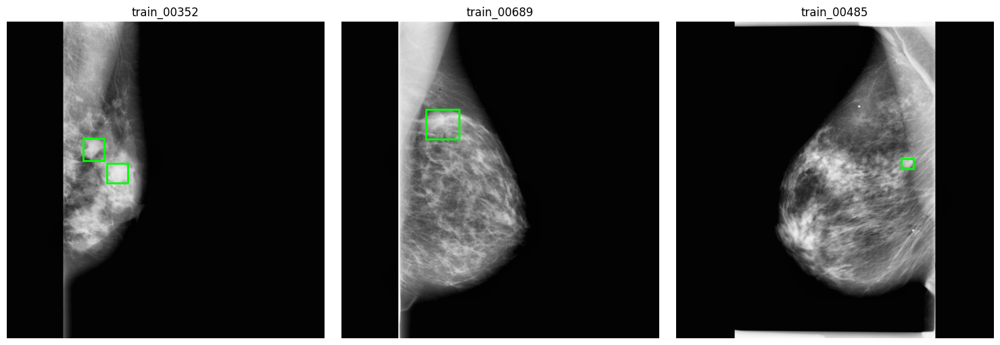

In [12]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

sample = man[man.split=="train"].drop_duplicates("stem").sample(min(3, man.stem.nunique()), random_state=CFG.SEED)
fig, axes = plt.subplots(1, len(sample), figsize=(5*len(sample), 5))
if len(sample) == 1: axes = [axes]
for ax, (_, r) in zip(axes, sample.iterrows()):
    img = cv2.imread(str(YOLO_DIR/"images"/"train"/f"{r.stem}.png"))[..., ::-1]
    ax.imshow(img)
    lbl = YOLO_DIR/"labels"/"train"/f"{r.stem}.txt"
    Himg, Wimg = img.shape[:2]
    for line in open(lbl):
        _, xc, yc, bw, bh = map(float, line.split())
        x0, y0 = (xc-bw/2)*Wimg, (yc-bh/2)*Himg
        ax.add_patch(patches.Rectangle((x0, y0), bw*Wimg, bh*Himg, fill=False, ec="lime", lw=2))
    ax.set_title(r.stem); ax.axis("off")
plt.tight_layout(); plt.show()

<a id="detector"></a>
# 4 · Stage 1 — Detector (YOLOv8s-P2)
Train the detector, then honest detector metrics (mAP + Capture Rate + TPR@FP).


## Cell 8 — Stage A: train YOLOv8s (50 epochs)
GIoU box loss -> tight boxes. No vertical flip (chest-wall reference). **Gate:** test mAP@50 >= 0.40
and TPR >= 0.80. The detector is the pipeline ceiling — if it misses the mass, nothing downstream can recover.

In [ ]:
import torch
import traceback
import ultralytics.utils.loss as yolo_loss
from ultralytics import YOLO

NWD_R = 0.5
NWD_C = 12.8

# capture the TRUE original once — survives re-runs without stacking
if not hasattr(yolo_loss, "_TRUE_BboxLoss"):
    yolo_loss._TRUE_BboxLoss = yolo_loss.BboxLoss
OriginalBboxLoss = yolo_loss._TRUE_BboxLoss

class PatchedBboxLoss(OriginalBboxLoss):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.r = NWD_R; self.C = NWD_C; self._print_count = 0
    def forward(self, *args, **kwargs):
        loss_iou_orig, loss_dfl = super().forward(*args, **kwargs)

        try:
            # Ultralytics args: 0: pred_dist, 1: pred_bboxes, 2: anchor_points,
            # 3: target_bboxes, 4: target_scores, 5: target_scores_sum, 6: fg_mask
            pred_bboxes = args[1]
            target_bboxes = args[3]
            target_scores = args[4]
            target_scores_sum = args[5]
            fg_mask = args[6]

            # Compute NWD on the foreground bounding boxes
            pb = pred_bboxes[fg_mask]
            tb = target_bboxes[fg_mask]

            if pb.numel() > 0:
                px1, py1, px2, py2 = pb.chunk(4, -1)
                tx1, ty1, tx2, ty2 = tb.chunk(4, -1)

                pcx, pcy = (px1 + px2) / 2, (py1 + py2) / 2
                pw, ph = (px2 - px1), (py2 - py1)

                tcx, tcy = (tx1 + tx2) / 2, (ty1 + ty2) / 2
                tw, th = (tx2 - tx1), (ty2 - ty1)

                # W2^2 distance
                w2_sq = (pcx - tcx)**2 + (pcy - tcy)**2 + ((pw - tw)/2)**2 + ((ph - th)/2)**2
                # NWD metric
                nwd = torch.exp(-torch.sqrt(w2_sq + 1e-7) / self.C)

                weight = target_scores.sum(-1)[fg_mask].unsqueeze(-1)
                loss_nwd = ((1.0 - nwd) * weight).sum() / target_scores_sum

                if self._print_count < 5:
                    print(f"[NWD Debug] nwd: min={nwd.min().item():.4f}, mean={nwd.mean().item():.4f}, max={nwd.max().item():.4f} | loss_nwd={loss_nwd.item():.4f} | loss_iou={loss_iou_orig.item():.4f}")
                    self._print_count += 1

                loss_iou_blended = (1 - self.r) * loss_iou_orig + self.r * loss_nwd
                return loss_iou_blended, loss_dfl
            else:
                return loss_iou_orig, loss_dfl
        except Exception as e:
            if not getattr(self, "_error_printed", False):
                print(f"\n[NWD Error] Falling back to standard loss. Traceback:\n{traceback.format_exc()}\n")
                self._error_printed = True
            return loss_iou_orig, loss_dfl

# Apply the monkey patch to ultralytics
yolo_loss.BboxLoss = PatchedBboxLoss
print(f"✅ Monkey-patched BboxLoss with NWD (r={NWD_R}, C={NWD_C})")

# 1. Build P2 architecture from scratch
det = YOLO(CFG.YOLO_MODEL)

# 2. Transfer standard weights
det.load("yolov8s.pt")

# 3. Train with recall bias (cls=2.0 helps force the network to care about faint lesions)
print(f"Starting {CFG.YOLO_EPOCHS}-epoch training run with NWD...")
det.train(
    data=str(YOLO_DIR / "data.yaml"),
    imgsz=CFG.YOLO_IMGSZ, epochs=CFG.YOLO_EPOCHS, batch=CFG.YOLO_BATCH,
    optimizer="AdamW", lr0=1e-3, weight_decay=5e-4,
    cls=2.0,
    fliplr=0.5, flipud=0.0, mosaic=1.0, close_mosaic=10, scale=0.8, degrees=10.0,
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
    seed=CFG.SEED, project=CFG.WORK_DIR, name="yolo_run8_nwd", exist_ok=True,
)
DET_WEIGHTS = Path(CFG.WORK_DIR) / "yolo_run8_nwd" / "weights" / "best.pt"
print("detector weights:", DET_WEIGHTS)


✅ Monkey-patched BboxLoss with NWD (r=0.5, C=12.8)
Transferred 219/437 items from pretrained weights
Starting 50-epoch training run with NWD...
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA L4, 22563MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=2.0, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/working/yolo_ds/data.yaml, degrees=10.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1536, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo

## Cell 9 — Detector evaluation: mAP + Capture Rate + TPR@FP (honest detector metrics)

In [23]:
from ultralytics import YOLO
import numpy as np
from pathlib import Path
import cv2

# Force the correct path, checking the restored directory first
DET_WEIGHTS = Path(CFG.WORK_DIR) / "yolo_run8" / "weights" / "best.pt"
if not DET_WEIGHTS.exists():
    DET_WEIGHTS = Path(CFG.WORK_DIR) / "yolo_run8_nwd" / "weights" / "best.pt"

if not DET_WEIGHTS.exists():
    raise FileNotFoundError(f"Model weights not found at {DET_WEIGHTS}. Please run the Training cell (§4) or Restore from Drive cell (§7c) first.")

det = YOLO(str(DET_WEIGHTS))
metrics = det.val(data=str(YOLO_DIR / "data.yaml"), split="test")
print(f"mAP@50    = {metrics.box.map50:.4f}")
print(f"mAP@50-95 = {metrics.box.map:.4f}")

test = man[man.split=="test"].reset_index(drop=True)
tp = fp = fn = 0; cap_rates = []; n_img = 0
for _, r in test.iterrows():
    img_path = YOLO_DIR/"images"/"test"/f"{r.stem}.png"
    mask = load_mask(r.roi); gt = mask_to_bbox(mask)
    if gt is None: continue
    n_img += 1
    res = det.predict(str(img_path), conf=CFG.YOLO_CONF, verbose=False)[0]
    boxes = res.boxes.xyxy.cpu().numpy() if res.boxes is not None else np.zeros((0, 4))
    matched = any(iou_xyxy(b, gt) >= 0.2 for b in boxes)
    tp += int(matched); fn += int(not matched)
    fp += max(0, len(boxes) - (1 if matched else 0))
    cover = np.zeros_like(mask); H, W = mask.shape
    disk = cv2.imread(str(img_path)); sx, sy = W/disk.shape[1], H/disk.shape[0]
    for b in boxes:
        bx0, by0, bx1, by1 = int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy)
        cover[max(0,by0):by1, max(0,bx0):bx1] = 1
    inter = (cover & (mask>0)).sum(); tot = (mask>0).sum()
    cap_rates.append(inter/tot if tot>0 else 0.0)

tpr = tp/(tp+fn+1e-9); fp_per_img = fp/(n_img+1e-9)
print(f"TPR (IoU>=0.2)    = {tpr:.3f}")
print(f"FP per image      = {fp_per_img:.3f}")
print(f"Mean Capture Rate = {np.mean(cap_rates):.3f}")
print("\nGATE:", "PASS" if (metrics.box.map50>=0.40 and tpr>=0.80) else "review (tune conf / more epochs before Stage B)")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8s-p2 summary (fused): 91 layers, 10,626,708 parameters, 0 gradients, 36.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1981.4±769.9 MB/s, size: 828.9 KB)
val: Scanning /content/working/yolo_ds/labels/test... 361 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 361/361 343.3it/s 1.1s
val: New cache created: /content/working/yolo_ds/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 23/23 1.6s/it 36.0s
                   all        361        378       0.63      0.487      0.532      0.226
Speed: 15.5ms pre

<a id="segcls"></a>
# 5 · Stage 2 — Crops + segmenter/classifier
Crop specs (GT + predicted + hard negatives) → crop dataset → EfficientNet-B0 + UNet++ MTL model → **Phase A** (3-class, hard negatives teach 'empty here') → **Phase B** (re-head to 2 classes, malignant-weighted CE = sensitivity bias-fix).


1. Phase A Model Setup (EfficientNet + UNet++)

In [76]:
import torch.nn as nn
import segmentation_models_pytorch as smp

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

model = smp.UnetPlusPlus(
    encoder_name="efficientnet-b0", encoder_weights="imagenet",
    in_channels=3, classes=1,
    aux_params=dict(classes=3, dropout=0.5, pooling="avg"),
).to(DEVICE)

dice_loss = smp.losses.DiceLoss(mode="binary", from_logits=True)
bce_loss  = nn.BCEWithLogitsLoss()
ce_loss   = nn.CrossEntropyLoss(label_smoothing=0.1)
LAMBDA_CLS = 0.3
opt   = torch.optim.AdamW(model.parameters(), lr=CFG.SEG_LR, weight_decay=1e-4)
sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=CFG.SEG_EPOCHS)

def evaluate_model_globally(val_loader, m, device):
    """Global Dice (accumulate inter/union over the whole set — no batch-Dice skew)."""
    m.eval(); ti = tu = 0.0; eps = 1e-6
    with torch.no_grad():
        for x, msk, y in val_loader:
            x, msk = x.to(device), msk.to(device)
            seg, _ = m(x)
            p = (torch.sigmoid(seg) > 0.5).float()
            has = msk.sum((1,2,3)) > 0
            if has.any():
                ti += (p[has]*msk[has]).sum().item()
                tu += p[has].sum().item() + msk[has].sum().item()
    return (2*ti + eps) / (tu + eps)

print(sum(p.numel() for p in model.parameters())/1e6, "M params")

6.570544 M params


2. Train Phase A (Freeze/Unfreeze)

In [78]:
import random
from ultralytics import YOLO
from pathlib import Path
import pandas as pd
import numpy as np

if 'DET_WEIGHTS' not in globals():
    DET_WEIGHTS = Path(CFG.WORK_DIR) / "yolo_run8_nwd" / "weights" / "best.pt"

def sample_negative_box(mask, W, H, gt, size_frac=0.25, tries=20):
    s = int(min(W, H) * size_frac)
    for _ in range(tries):
        x0 = random.randint(0, max(1, W-s)); y0 = random.randint(0, max(1, H-s))
        if iou_xyxy((x0, y0, x0+s, y0+s), gt) > 0.0: continue
        return (x0, y0, x0+s, y0+s)
    return None

specs = {"train": [], "val": []}
for _, r in man.iterrows():
    if r.split == "test": continue
    sp = r.split; mask = load_mask(r.roi); gt = mask_to_bbox(mask)
    if gt is None: continue
    W, H = r.W, r.H
    specs[sp].append(dict(full=r.full, roi=r.roi, box=expand_box(*gt, W, H, CFG.CROP_MARGIN),
                          label=r.label, is_neg=False))
    for _ in range(CFG.N_NEG_PER_POS):
        nb = sample_negative_box(mask, W, H, gt)
        if nb: specs[sp].append(dict(full=r.full, roi=r.roi, box=nb, label=2, is_neg=True))

# HARD NEGATIVE MINING: predicted crops on TRAIN images (the detector's actual outputs)
if not Path(DET_WEIGHTS).exists():
    print(f"⚠️ YOLO weights not found at {DET_WEIGHTS}.")
    print("Skipping YOLO hard negative mining.")
else:
    det = YOLO(str(DET_WEIGHTS))
    for _, r in man[man.split=="train"].drop_duplicates(subset="stem").iterrows():
        res = det.predict(str(YOLO_DIR/"images"/"train"/f"{r.stem}.png"), conf=CFG.YOLO_CONF, verbose=False)[0]
        if res.boxes is None or len(res.boxes) == 0: continue
        mask = load_mask(r.roi); W, H = r.W, r.H
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]; gt = mask_to_bbox(mask)
        for b in res.boxes.xyxy.cpu().numpy()[:CFG.YOLO_TOPK]:
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            # Any box that doesn't overlap the GT is a false positive and becomes a hard negative (label 2)
            lbl = r.label if (gt and iou_xyxy(bx, gt) >= 0.2) else 2
            specs["train"].append(dict(full=r.full, roi=r.roi, box=expand_box(*bx, W, H, CFG.CROP_MARGIN),
                                       label=lbl, is_neg=(lbl == 2)))

print({k: len(v) for k, v in specs.items()})
print("train label dist:", pd.Series([s["label"] for s in specs["train"]]).value_counts().to_dict())

{'train': 4702, 'val': 564}
train label dist: {2: 2587, 0: 1061, 1: 1054}


In [79]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
import random

class CropDS(Dataset):
    def __init__(self, specs, train=True):
        self.specs = specs; self.train = train
    def __len__(self): return len(self.specs)
    def __getitem__(self, i):
        s = self.specs[i]
        rgb = load_rgb8(s["full"]); mask = load_mask(s["roi"])
        if rgb.shape[:2] != mask.shape[:2]:
            mask = cv2.resize(mask, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)
        x0, y0, x1, y1 = s["box"]
        crop = rgb[y0:y1, x0:x1]; cmask = mask[y0:y1, x0:x1]
        if crop.size == 0:
            crop = np.zeros((CFG.CROP_SIZE, CFG.CROP_SIZE, 3), np.uint8)
            cmask = np.zeros((CFG.CROP_SIZE, CFG.CROP_SIZE), np.uint8)
        crop  = cv2.resize(crop,  (CFG.CROP_SIZE, CFG.CROP_SIZE))
        cmask = cv2.resize(cmask, (CFG.CROP_SIZE, CFG.CROP_SIZE), interpolation=cv2.INTER_NEAREST)
        if s["is_neg"]: cmask[:] = 0
        if self.train and random.random() < 0.5:
            crop = crop[:, ::-1].copy(); cmask = cmask[:, ::-1].copy()
        x = torch.from_numpy(crop).float().permute(2, 0, 1) / 255.0
        x = (x - 0.5) / 0.5
        m = torch.from_numpy(cmask).float().unsqueeze(0)
        return x, m, torch.tensor(s["label"], dtype=torch.long)

# Using multiple workers and pinned memory to prevent GPU starvation
num_workers = min(4, os.cpu_count() or 1)
tr_dl = DataLoader(CropDS(specs["train"], train=True),  batch_size=CFG.SEG_BATCH, shuffle=True,  num_workers=num_workers, pin_memory=True, drop_last=True)
va_dl = DataLoader(CropDS(specs["val"],   train=False), batch_size=CFG.SEG_BATCH, shuffle=False, num_workers=num_workers, pin_memory=True)
print(f"train crops: {len(tr_dl.dataset)} | val crops: {len(va_dl.dataset)} | workers: {num_workers}")


train crops: 4702 | val crops: 564 | workers: 2


In [ ]:
import math

def set_encoder_trainable(flag):
    for p in model.encoder.parameters(): p.requires_grad = flag

best_dice = -1; best_path = Path(CFG.WORK_DIR)/"seg_run8_phaseA.pth"
for ep in range(CFG.SEG_EPOCHS):
    set_encoder_trainable(ep >= 5)
    model.train(); tl = 0
    for x, m, y in tr_dl:
        x, m, y = x.to(DEVICE), m.to(DEVICE), y.to(DEVICE)
        seg, cls = model(x); pos = (y != 2)
        loss_seg = bce_loss(seg, m) + (dice_loss(seg[pos], m[pos]) if pos.any() else 0.0)
        loss = loss_seg + LAMBDA_CLS * ce_loss(cls, y)
        opt.zero_grad(); loss.backward(); opt.step(); tl += loss.item()
    sched.step()
    vdice = evaluate_model_globally(va_dl, model, DEVICE)
    if vdice > best_dice:
        best_dice = vdice; torch.save(model.state_dict(), best_path)
    print(f"ep {ep+1:02d} | train_loss {tl/len(tr_dl):.4f} | val ROI-Dice {vdice:.4f}{'  *best' if vdice==best_dice else ''}")
print("best val ROI-Dice:", round(best_dice, 4), "->", best_path)

ep 01 | train_loss 0.6977 | val ROI-Dice 0.8442  *best
ep 02 | train_loss 0.6791 | val ROI-Dice 0.8471  *best
ep 03 | train_loss 0.6553 | val ROI-Dice 0.8514  *best
ep 04 | train_loss 0.6464 | val ROI-Dice 0.8465
ep 05 | train_loss 0.6429 | val ROI-Dice 0.8629  *best
ep 06 | train_loss 0.6042 | val ROI-Dice 0.8935  *best
ep 07 | train_loss 0.5666 | val ROI-Dice 0.8894
ep 08 | train_loss 0.5417 | val ROI-Dice 0.8989  *best
ep 09 | train_loss 0.5366 | val ROI-Dice 0.9021  *best
ep 10 | train_loss 0.5282 | val ROI-Dice 0.8911
ep 11 | train_loss 0.5118 | val ROI-Dice 0.9013
ep 12 | train_loss 0.5042 | val ROI-Dice 0.9019
ep 13 | train_loss 0.4928 | val ROI-Dice 0.9065  *best
ep 14 | train_loss 0.4822 | val ROI-Dice 0.9023
ep 15 | train_loss 0.4662 | val ROI-Dice 0.9026
ep 16 | train_loss 0.4599 | val ROI-Dice 0.8978
ep 17 | train_loss 0.4419 | val ROI-Dice 0.9008
ep 18 | train_loss 0.4278 | val ROI-Dice 0.8933
ep 19 | train_loss 0.4197 | val ROI-Dice 0.8487
ep 20 | train_loss 0.4036 | val 

3. Phase B: Sensitivity Bias-Fix (2 Classes)

In [ ]:
print("Phase B: fine-tuning with malignant class weight to fix under-prediction...")

model_bias = smp.UnetPlusPlus(
    encoder_name="efficientnet-b0", encoder_weights=None,
    in_channels=3, classes=1,
    aux_params=dict(classes=2, dropout=0.5, pooling="avg"),
).to(DEVICE)

# Load Phase A weights, dropping the old 3-class head logits
state = torch.load(best_path, map_location=DEVICE)
filtered = {k: v for k, v in state.items() if not k.startswith("classification_head.3.")}
model_bias.load_state_dict(filtered, strict=False)

class_weights = torch.tensor([1.0, CFG.MALIG_WEIGHT]).to(DEVICE)
ce_loss_w   = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
bce_b       = nn.BCEWithLogitsLoss()
dice_b      = smp.losses.DiceLoss(mode="binary", from_logits=True)
LAMBDA_CLS_B = 0.5
opt_b   = torch.optim.AdamW(model_bias.parameters(), lr=1e-5, weight_decay=1e-4)
sched_b = torch.optim.lr_scheduler.CosineAnnealingLR(opt_b, T_max=CFG.FT_EPOCHS_BIAS)

best_dice_b = -1; best_path_bias = Path(CFG.WORK_DIR)/"seg_run8_bias_fixed.pth"
for ep in range(CFG.FT_EPOCHS_BIAS):
    model_bias.train(); tl = 0
    for x, m, y in tr_dl:
        x, m, y = x.to(DEVICE), m.to(DEVICE), y.to(DEVICE)
        seg, cls = model_bias(x); pos = (y != 2)
        loss_seg = bce_b(seg, m) + (dice_b(seg[pos], m[pos]) if pos.any() else 0.0)
        loss_cls = ce_loss_w(cls[pos], y[pos]) if pos.any() else 0.0
        loss = loss_seg + LAMBDA_CLS_B * loss_cls
        opt_b.zero_grad(); loss.backward(); opt_b.step(); tl += loss.item()
    sched_b.step()
    vdice = evaluate_model_globally(va_dl, model_bias, DEVICE)
    if vdice > best_dice_b:
        best_dice_b = vdice; torch.save(model_bias.state_dict(), best_path_bias)
    print(f"ep {ep+1:02d} | train_loss {tl/len(tr_dl):.4f} | val ROI-Dice {vdice:.4f}{'  *best' if vdice==best_dice_b else ''}")
print("\nBias-fixed weights saved to:", best_path_bias)

Phase B: fine-tuning with malignant class weight to fix under-prediction...
ep 01 | train_loss 0.5696 | val ROI-Dice 0.9069  *best
ep 02 | train_loss 0.5242 | val ROI-Dice 0.9073  *best
ep 03 | train_loss 0.5041 | val ROI-Dice 0.9063
ep 04 | train_loss 0.5018 | val ROI-Dice 0.9072
ep 05 | train_loss 0.4890 | val ROI-Dice 0.9064
ep 06 | train_loss 0.4977 | val ROI-Dice 0.9053
ep 07 | train_loss 0.4818 | val ROI-Dice 0.9065
ep 08 | train_loss 0.4746 | val ROI-Dice 0.9051
ep 09 | train_loss 0.4804 | val ROI-Dice 0.9017
ep 10 | train_loss 0.4796 | val ROI-Dice 0.9047
ep 11 | train_loss 0.4806 | val ROI-Dice 0.9035
ep 12 | train_loss 0.4583 | val ROI-Dice 0.9033
ep 13 | train_loss 0.4611 | val ROI-Dice 0.9027
ep 14 | train_loss 0.4555 | val ROI-Dice 0.9031
ep 15 | train_loss 0.4544 | val ROI-Dice 0.9039
ep 16 | train_loss 0.4635 | val ROI-Dice 0.9033
ep 17 | train_loss 0.4480 | val ROI-Dice 0.9020
ep 18 | train_loss 0.4558 | val ROI-Dice 0.9035
ep 19 | train_loss 0.4530 | val ROI-Dice 0.902

4. Calibration (Temperature Scaling)

In [37]:
!pip install -q segmentation-models-pytorch

import torch
import torch.nn as nn
import torch.optim as optim
import segmentation_models_pytorch as smp

class ModelWithTemperature(nn.Module):
    """A thin wrapper that scales classification logits by a learned temperature parameter."""
    def __init__(self, model):
        super(ModelWithTemperature, self).__init__()
        self.model = model
        self.temperature = nn.Parameter(torch.ones(1) * 1.5)

    def forward(self, x):
        seg, cls = self.model(x)
        return seg, self.temperature_scale(cls)

    def temperature_scale(self, logits):
        temperature = self.temperature.unsqueeze(1).expand(logits.size(0), logits.size(1))
        return logits / temperature

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
if 'model_bias' not in globals() and 'model_bias' not in locals():
    model_bias = smp.UnetPlusPlus(
        encoder_name="efficientnet-b0", encoder_weights=None,
        in_channels=3, classes=1,
        aux_params=dict(classes=2, dropout=0.5, pooling="avg"),
    ).to(DEVICE)

    state_dict = torch.load("/content/working/seg_run8_bias_fixed.pth", map_location=DEVICE)
    if 'temperature' in state_dict:
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items() if k != 'temperature'}
    model_bias.load_state_dict(state_dict)

scaled_model = ModelWithTemperature(model_bias).to(DEVICE)
scaled_model.model.eval()

nll_criterion = nn.CrossEntropyLoss()
optimizer = optim.LBFGS([scaled_model.temperature], lr=0.01, max_iter=50)

if 'va_dl' not in globals():
    print("⚠️ 'va_dl' (validation dataloader) is not defined. This usually happens when restoring from Drive.")
    print("Skipping temperature scaling recalibration. The default temperature will be used.")
else:
    logits_list, labels_list = [], []
    with torch.no_grad():
        for x, msk, y in va_dl:
            x, y = x.to(DEVICE), y.to(DEVICE)
            pos = (y != 2)
            if not pos.any(): continue
            _, cls = scaled_model.model(x)
            logits_list.append(cls[pos])
            labels_list.append(y[pos])

    all_logits = torch.cat(logits_list).to(DEVICE)
    all_labels = torch.cat(labels_list).to(DEVICE)

    def eval_fn():
        optimizer.zero_grad()
        loss = nll_criterion(scaled_model.temperature_scale(all_logits), all_labels)
        loss.backward()
        return loss

    optimizer.step(eval_fn)

    print(f"Optimal Temperature Learned: {scaled_model.temperature.item():.4f}")
    model_bias = scaled_model


⚠️ 'va_dl' (validation dataloader) is not defined. This usually happens when restoring from Drive.
Skipping temperature scaling recalibration. The default temperature will be used.


5. Evaluation (E2E Pipeline)

 RUN 8.4 — FULL DIAGNOSIS  ·  run AFTER the E2E pipeline cell

In [ ]:
# ════════════════════════════════════════════════════════════════════════════
# RUN 8.4 — FULL DIAGNOSIS  ·  run AFTER the E2E pipeline cell
# needs: y_true, y_score, optimal_threshold, man, det, model_bias,
#        load_rgb8, load_mask, mask_to_bbox, expand_box, iou_xyxy, CFG, DEVICE
# Δ vs 8.31: pipeline confusion matrices use DIAG_THR = Youden (not 0.5),
#            so FN here matches the headline you just saw.
# ════════════════════════════════════════════════════════════════════════════
import numpy as np, pandas as pd, cv2, torch
from sklearn.metrics import roc_auc_score, confusion_matrix
from sklearn.utils import resample
from tqdm.auto import tqdm
from IPython.display import display

DIAG_THR   = float(optimal_threshold)          # pipeline operating point (Youden)
SWEEP_CONF = [0.20, 0.30, 0.38, 0.50]
LOW_CONF   = min(SWEEP_CONF)
model_bias.eval()
test_df = man[man.split=="test"].copy().reset_index(drop=True)

def p_malig_of(crop):
    x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0-0.5)/0.5).unsqueeze(0).to(DEVICE)
    with torch.no_grad(): _, cls = model_bias(x)
    p = torch.softmax(cls,1)[0].cpu().numpy()
    return float(p[1]/(p[0]+p[1]+1e-9))

# ── single YOLO pass (predict once at LOW_CONF, filter up) + pipeline score ──
recs = []
for _, r in tqdm(test_df.iterrows(), total=len(test_df), desc="YOLO+cls pass"):
    rgb = load_rgb8(r.full); H, W = rgb.shape[:2]
    res = det.predict(rgb[..., ::-1], conf=LOW_CONF, verbose=False)[0]
    boxes = np.zeros((0,4)); confs = np.zeros((0,))
    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
        boxes = res.boxes.xyxy.cpu().numpy().copy()
        boxes[:,[0,2]] *= sx; boxes[:,[1,3]] *= sy
        confs = res.boxes.conf.cpu().numpy()
    m = load_mask(r.roi); gt = mask_to_bbox(m); area = int((m>0).sum())
    bucket = ("Small (<10k)" if area<10000 else
              "Medium (10-30k)" if area<30000 else "Large (>30k)")
    keep = confs >= CFG.YOLO_CONF
    fired = bool(keep.sum()); p_pipe = 0.0
    if fired:
        order = confs[keep].argsort()[::-1][:CFG.YOLO_TOPK]
        for b in boxes[keep][order]:
            x0,y0,x1,y1 = expand_box(int(b[0]),int(b[1]),int(b[2]),int(b[3]),W,H,CFG.CROP_MARGIN)
            p_pipe = max(p_pipe, p_malig_of(cv2.resize(rgb[y0:y1,x0:x1],(CFG.CROP_SIZE,CFG.CROP_SIZE))))
    recs.append(dict(label=r.label, view=r.view, lat=r.lat, roi=r.roi, W=W, H=H,
                     gt=gt, area=area, bucket=bucket, boxes=boxes, confs=confs,
                     fired=fired, p_pipe=p_pipe))
D = pd.DataFrame(recs); POS = D[D.label==1]

# ════════ 1. DETECTOR — recall / FP / capture across conf (NWD lever) ═════════
def det_at(conf):
    tp=fn=fp=0; caps=[]
    for _, r in D.iterrows():
        kb = r.boxes[r.confs>=conf] if len(r.confs) else np.zeros((0,4))
        if r.label==1 and r['gt'] is not None:
            matched = any(iou_xyxy(b, r['gt'])>=0.2 for b in kb)
            tp+=int(matched); fn+=int(not matched)
            cov=np.zeros((r.H,r.W),np.uint8)
            for b in kb: cov[max(0,int(b[1])):int(b[3]),max(0,int(b[0])):int(b[2])]=1
            mm=load_mask(r.roi)
            if mm.shape!=cov.shape: mm=cv2.resize(mm,(r.W,r.H),interpolation=cv2.INTER_NEAREST)
            t=(mm>0).sum(); caps.append((cov&(mm>0)).sum()/t if t>0 else 0)
            fp+=max(0,len(kb)-(1 if matched else 0))
        elif r.label==0:
            fp+=len(kb)
    return dict(conf=conf, recall=round(tp/max(1,tp+fn),3), FN=fn,
                fp_per_img=round(fp/max(1,len(D)),3),
                capture=round(float(np.mean(caps)) if caps else 0,3))
print("="*64); print("  1. DETECTOR  ·  malignant-localization recall / FP / capture"); print("="*64)
display(pd.DataFrame([det_at(c) for c in SWEEP_CONF]))
print(f"  pipeline operating conf = CFG.YOLO_CONF = {CFG.YOLO_CONF}\n")
print(f"  recall by lesion size @ conf={CFG.YOLO_CONF}:")
for bk in ["Small (<10k)","Medium (10-30k)","Large (>30k)"]:
    sub=POS[POS.bucket==bk]
    hit=sum(any(iou_xyxy(b,r['gt'])>=0.2 for b in r.boxes[r.confs>=CFG.YOLO_CONF])
            for _,r in sub.iterrows() if r['gt'] is not None)
    print(f"    {bk:<16}: {hit:>3}/{len(sub):<3} ({hit/max(1,len(sub)):.3f})")

# ════════ 2. FN ATTRIBUTION — detector miss vs classifier error @ DIAG_THR ════
det_miss = int(((POS.label==1) & (~POS.fired)).sum())
cls_err  = int(((POS.label==1) & (POS.fired) & (POS.p_pipe < DIAG_THR)).sum())
tot_fn   = det_miss + cls_err
print("\n"+"="*64); print(f"  2. FN ATTRIBUTION  (pipeline FN = {tot_fn} @ thr={DIAG_THR:.4f})"); print("="*64)
print(f"    detector miss (YOLO silent) : {det_miss:>3}  ({det_miss/max(1,tot_fn)*100:.1f}%)")
print(f"    classifier error (fired)    : {cls_err:>3}  ({cls_err/max(1,tot_fn)*100:.1f}%)")

# ════════ 3. ORACLE CROP PROBE — perfect GT box → classifier (cls ceiling) ════
oy, os_ = [], []
for _, r in tqdm(test_df.iterrows(), total=len(test_df), desc="oracle probe"):
    m=load_mask(r.roi); gb=mask_to_bbox(m)
    if gb is None: continue
    x0,y0,x1,y1=expand_box(*gb,r.W,r.H,CFG.CROP_MARGIN); rgb=load_rgb8(r.full)
    oy.append(r.label); os_.append(p_malig_of(cv2.resize(rgb[y0:y1,x0:x1],(CFG.CROP_SIZE,CFG.CROP_SIZE))))
o_auc=roc_auc_score(oy,os_)
otn,ofp,ofn,otp=confusion_matrix(oy,[1 if p>=0.5 else 0 for p in os_]).ravel()
print("\n"+"="*64); print("  3. ORACLE CROP PROBE  (GT box → classifier, thr=0.5)"); print("="*64)
print(f"    AUC {o_auc:.4f} | Sens {otp/max(1,otp+ofn):.4f} (FN {ofn}) | Spec {otn/max(1,otn+ofp):.4f} (FP {ofp})")

# ════════ 4. PER-STAGE LEAK TABLE  (pipeline @ DIAG_THR  vs  oracle @0.5) ══════
pp=[1 if s>=DIAG_THR else 0 for s in y_score]
ptn,pfp,pfn,ptp=confusion_matrix(y_true,pp).ravel()
leak=pd.DataFrame([
    {"Stage":"Full pipeline (YOLO→cls)","AUC":roc_auc_score(y_true,y_score),
     "Sens":ptp/max(1,ptp+pfn),"Spec":ptn/max(1,ptn+pfp),"FN":pfn},
    {"Stage":"Oracle GT crop (ceiling)","AUC":o_auc,
     "Sens":otp/max(1,otp+ofn),"Spec":otn/max(1,otn+ofp),"FN":ofn}])
for c in ["AUC","Sens","Spec"]: leak[c]=leak[c].round(4)
print("\n"+"="*64); print("  4. PER-STAGE LEAK TABLE"); print("="*64); display(leak)

# ════════ 5. BOOTSTRAP 95% CI on pipeline AUC ═════════════════════════════════
yt=np.array(y_true); ys=np.array(y_score); bs=[]
np.random.seed(CFG.SEED)
for _ in range(1000):
    idx=resample(np.arange(len(yt)),replace=True,stratify=yt)
    if len(np.unique(yt[idx]))<2: continue
    bs.append(roc_auc_score(yt[idx],ys[idx]))
bs=np.sort(bs)
print("\n"+"="*64); print("  5. BOOTSTRAP 95% CI (pipeline AUC)"); print("="*64)
print(f"    mean {bs.mean():.4f} | 95% CI [{bs[int(0.025*len(bs))]:.4f}, {bs[int(0.975*len(bs))]:.4f}]")

# ════════ 6. ERROR CLUSTERS — FN by view/lat & size, FP by size ═══════════════
T=test_df.copy(); T["pred"]=pp; T["bucket"]=D["bucket"].values
fnT=T[(T.label==1)&(T.pred==0)]; fpT=T[(T.label==0)&(T.pred==1)]
print("\n"+"="*64); print("  6. ERROR CLUSTERS"); print("="*64)
print("  FN by view × laterality:"); display(pd.crosstab(fnT.view, fnT.lat))
print("  FN by size:"); display(fnT.bucket.value_counts().to_frame("FN"))
print("  FP by size:"); display(fpT.bucket.value_counts().to_frame("FP"))

# ════════ 7. CALIBRATION / ECE + temperature ═════════════════════════════════
def ece(yt,yp,nb=10):
    b=np.linspace(0,1,nb+1); ids=np.digitize(yp,b)-1; e=0
    for i in range(nb):
        mk=ids==i; n=mk.sum()
        if n>0: e+=(n/len(yt))*abs(np.array(yt)[mk].mean()-np.array(yp)[mk].mean())
    return e
base=ece(y_true,y_score); eps=1e-7
lg=np.log((np.array(y_score)+eps)/(1-np.array(y_score)+eps)); bestT,bestE=1.0,base
for Tn in np.linspace(0.1,3.0,30):
    e=ece(y_true,1/(1+np.exp(-lg/Tn)))
    if e<bestE: bestE,bestT=e,Tn
print("\n"+"="*64); print("  7. CALIBRATION / ECE"); print("="*64)
print(f"    ECE {base:.4f}  →  T={bestT:.2f}  →  ECE {bestE:.4f}")

# ════════ 8. POINT GAME on GT crops (optional — needs `cam`) ══════════════════
if 'cam' in dir():
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    h=t=hm=tm=0
    for _, r in test_df.iterrows():
        m=load_mask(r.roi); gb=mask_to_bbox(m)
        if gb is None: continue
        x0,y0,x1,y1=expand_box(*gb,r.W,r.H,CFG.CROP_MARGIN); rgb=load_rgb8(r.full)
        crop=cv2.resize(rgb[y0:y1,x0:x1],(CFG.CROP_SIZE,CFG.CROP_SIZE))
        cmk=cv2.resize(m[y0:y1,x0:x1],(CFG.CROP_SIZE,CFG.CROP_SIZE),interpolation=cv2.INTER_NEAREST)
        x=((torch.from_numpy(crop).float().permute(2,0,1)/255.0-0.5)/0.5).unsqueeze(0).to(DEVICE); x.requires_grad=True
        g=cam(input_tensor=x,targets=[ClassifierOutputTarget(1)])[0]
        yy,xx=np.unravel_index(g.argmax(),g.shape); hit=int(cmk[yy,xx]>0); h+=hit; t+=1
        if r.label==1: hm+=hit; tm+=1
    print("\n"+"="*64); print("  8. POINT GAME (GT crops)"); print("="*64)
    print(f"    overall {h/max(1,t):.3f} ({h}/{t}) | malignant {hm/max(1,tm):.3f} ({hm}/{tm})")
else:
    print("\n  [8. Point Game skipped — run the Grad-CAM cell first to define `cam`]")


<a id="save"></a>
# 7 · 💾 Save & checkpoints — artifacts + Drive
**The one place for persistence.** Export packages the models into `run8_artifacts/`, then **Save** copies that folder to Drive, and **Retrieve** restores it in a fresh session.

- **Full run:** run *Export* → *Save* here, then continue to §8.
- **After a disconnect:** run §1 Setup + §2 Config, then come straight here and run *Retrieve*, then jump to §8 Evaluation (skip §3–§6).

⚙️ **All three cells use one Drive folder** — to move it, change this string wherever it appears: `/content/drive/MyDrive/BreastMassModels_Run843`. On *Retrieve*, filenames are remapped (export → eval): `segmenter_bias_fixed_2cls.pth` → `seg_run8_bias_fixed.pth`, `detector_yolov8s.pt` → `yolo_run8/weights/best.pt`. *Retrieve restores the deployment segmenter + detector only — not Phase A.*

### 7a · Export artifacts → builds `run8_artifacts/`


## Cell 18 — Save artifacts for the desktop app
Exports the detector + the **2-class bias-fixed** segmenter (the deployment model) + inference config.

In [ ]:
import json, shutil

out = Path(CFG.WORK_DIR)/"run8_artifacts"; out.mkdir(exist_ok=True)
shutil.copy(DET_WEIGHTS, out/"detector_yolov8s.pt")
torch.save(model_bias.state_dict(), out/"segmenter_bias_fixed_2cls.pth")
with open(out/"inference_config.json", "w") as f:
    json.dump(dict(crop_size=CFG.CROP_SIZE, crop_margin=CFG.CROP_MARGIN,
                   yolo_conf=CFG.YOLO_CONF, yolo_topk=CFG.YOLO_TOPK,
                   classes=2, labels={0:"Benign", 1:"Malignant"}), f, indent=2)
print("saved to", out); print(list(out.iterdir()))

### 7b · Save to Drive


<a id="eval"></a>
# 8 · Evaluation — E2E pipeline + Youden's J
`run_pipeline` (detect → crop → segment → remap → classify) + honest screening metrics, then Youden's-J optimal threshold and the full confusion/ROC report. Corrected versions (supersede old Cell 15 / Cell 3).


  0%|          | 0/378 [00:00<?, ?it/s]


--- Run 8 Bias-Fixed Pipeline (full screening) ---
Optimal Youden's J Threshold: 0.8130
Mean End-to-End Dice    : 0.4398
Mean ROI-Dice (pos only): 0.7598
Image-Level AUC         : 0.6810
Image-Level Accuracy    : 0.7302
Image-Level Sensitivity : 0.4966
Image-Level Specificity : 0.8788


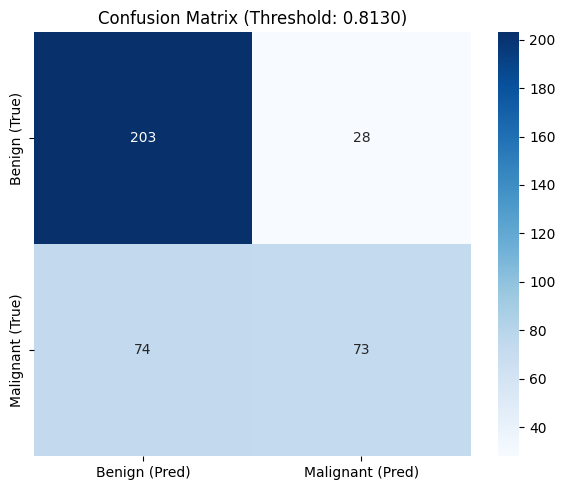

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, confusion_matrix, roc_curve
from tqdm.auto import tqdm
import numpy as np
from pathlib import Path
import torch
import cv2
from ultralytics import YOLO
import segmentation_models_pytorch as smp

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Define the path to the restored weights
best_path_bias = Path(CFG.WORK_DIR) / "seg_run8_bias_fixed.pth"

# Initialize the model for evaluation
model_bias = smp.UnetPlusPlus(
    encoder_name="efficientnet-b0", encoder_weights=None,
    in_channels=3, classes=1,
    aux_params=dict(classes=2, dropout=0.5, pooling="avg"),
).to(DEVICE)

state_dict = torch.load(best_path_bias, map_location=DEVICE)
if hasattr(model_bias, 'temperature_scale'):
    if 'temperature' in state_dict:
        model_bias.load_state_dict(state_dict)
    else:
        model_bias.model.load_state_dict(state_dict)
else:
    # If the loaded state dict is from the wrapper, unwrap it
    if 'temperature' in state_dict:
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items() if k != 'temperature'}
    model_bias.load_state_dict(state_dict)
model_bias.eval()

if 'DET_WEIGHTS' not in globals():
    DET_WEIGHTS = Path(CFG.WORK_DIR) / "yolo_run8" / "weights" / "best.pt"
    if not DET_WEIGHTS.exists():
        DET_WEIGHTS = Path(CFG.WORK_DIR) / "yolo_run8_nwd" / "weights" / "best.pt"

det = YOLO(str(DET_WEIGHTS))

@torch.no_grad()
def run_pipeline(full_path):
    rgb = load_rgb8(full_path); H, W = rgb.shape[:2]
    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]
    full_mask = np.zeros((H, W), np.float32); dets = []
    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
        order = res.boxes.conf.cpu().numpy().argsort()[::-1][:CFG.YOLO_TOPK]
        for k in order:
            b = res.boxes.xyxy.cpu().numpy()[k]
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
            seg, cls = model_bias(x)
            pm = cv2.resize(torch.sigmoid(seg)[0,0].cpu().numpy(), (x1-x0, y1-y0))
            full_mask[y0:y1, x0:x1] = np.maximum(full_mask[y0:y1, x0:x1], pm)
            prob = torch.softmax(cls, 1)[0].cpu().numpy()
            tot = prob[0] + prob[1] + 1e-9
            dets.append(dict(box=(x0,y0,x1,y1), conf=float(res.boxes.conf.cpu().numpy()[k]),
                             p_benign=float(prob[0]/tot), p_malig=float(prob[1]/tot)))
    return rgb, full_mask, dets

def dice_np(pred, gt, eps=1e-6):
    p = (pred > 0.5).astype(np.float32); g = (gt > 0).astype(np.float32)
    return (2*(p*g).sum()+eps)/(p.sum()+g.sum()+eps)

y_true, y_score, e2e, roi = [], [], [], []
test_df = man[man.split=="test"]
for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    rgb, fmask, dets = run_pipeline(r.full)
    gt = load_mask(r.roi)
    if gt.shape != fmask.shape:
        gt = cv2.resize(gt, (fmask.shape[1], fmask.shape[0]), interpolation=cv2.INTER_NEAREST)
    d = dice_np(fmask, gt); e2e.append(d)
    gb = mask_to_bbox(gt)
    if dets and gb is not None and any(iou_xyxy(dd["box"], gb) >= 0.2 for dd in dets):
        roi.append(d)
    y_true.append(r.label)
    y_score.append(max((dd["p_malig"] for dd in dets), default=0.0))

# --- YOUDEN'S J FIX ---
fpr, tpr, thresholds = roc_curve(y_true, y_score)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print(f"\n--- Run 8 Bias-Fixed Pipeline (full screening) ---")
print(f"Optimal Youden's J Threshold: {optimal_threshold:.4f}")

y_pred = [1 if s >= optimal_threshold else 0 for s in y_score]
cm = confusion_matrix(y_true, y_pred); tn, fp, fn, tp = cm.ravel()

print(f"Mean End-to-End Dice    : {np.mean(e2e):.4f}")
print(f"Mean ROI-Dice (pos only): {np.mean(roi) if roi else 0:.4f}")
print(f"Image-Level AUC         : {roc_auc_score(y_true, y_score):.4f}")
print(f"Image-Level Accuracy    : {accuracy_score(y_true, y_pred):.4f}")
print(f"Image-Level Sensitivity : {recall_score(y_true, y_pred):.4f}")
print(f"Image-Level Specificity : {tn/max(1,(tn+fp)):.4f}")

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Benign (Pred)","Malignant (Pred)"],
            yticklabels=["Benign (True)","Malignant (True)"])
plt.title(f"Confusion Matrix (Threshold: {optimal_threshold:.4f})")
plt.tight_layout(); plt.show()



Optimal Youden's J Threshold: 0.8130

  Dynamic Metrics at Optimal Threshold (0.8130)
  AUC                        : 0.6810
  Accuracy                   : 0.7302
  Precision                  : 0.7228
  Recall / Sensitivity       : 0.4966
  Specificity                : 0.8788
  F1-Score                   : 0.5887
  False Positives (FP)       : 28
  False Negatives (FN)       : 74
  True Positives (TP)        : 73
  True Negatives (TN)        : 203


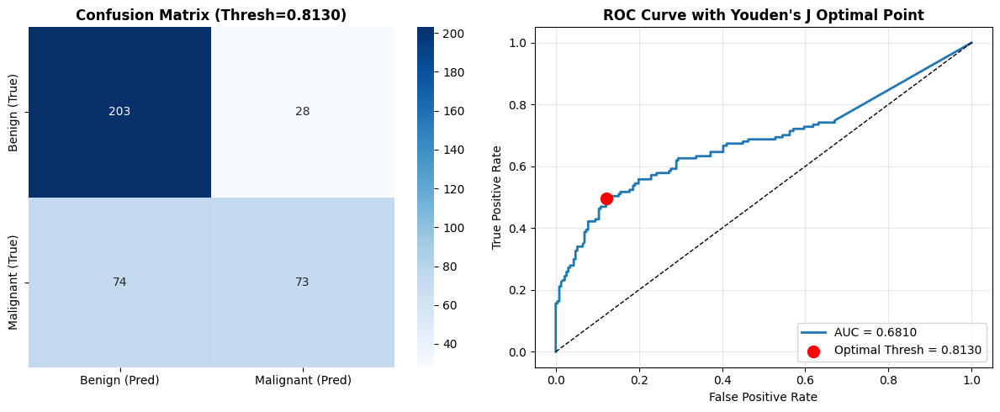

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score, recall_score, precision_score, f1_score, confusion_matrix

# Dynamically calculate Youden's J from variables in memory (y_true, y_score)
fpr, tpr, thresholds = roc_curve(y_true, y_score)
# Youden's J = TPR - FPR
J = tpr - fpr
optimal_idx = np.argmax(J)
optimal_threshold = thresholds[optimal_idx]

print(f"\nOptimal Youden's J Threshold: {optimal_threshold:.4f}")

# Apply the optimal threshold dynamically
y_pred = [1 if s >= optimal_threshold else 0 for s in y_score]
cm = confusion_matrix(y_true, y_pred)
tn, fp, fn, tp = cm.ravel()

print("\n" + "=" * 50)
print(f"  Dynamic Metrics at Optimal Threshold ({optimal_threshold:.4f})")
print("=" * 50)
print(f"  AUC                        : {roc_auc_score(y_true, y_score):.4f}")
print(f"  Accuracy                   : {accuracy_score(y_true, y_pred):.4f}")
print(f"  Precision                  : {precision_score(y_true, y_pred, zero_division=0):.4f}")
print(f"  Recall / Sensitivity       : {recall_score(y_true, y_pred):.4f}")
print(f"  Specificity                : {tn / max(1, tn+fp):.4f}")
print(f"  F1-Score                   : {f1_score(y_true, y_pred):.4f}")
print(f"  False Positives (FP)       : {fp}")
print(f"  False Negatives (FN)       : {fn}")
print(f"  True Positives (TP)        : {tp}")
print(f"  True Negatives (TN)        : {tn}")
print("=" * 50)

# Plot Confusion Matrix and ROC Curve side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# 1. Confusion Matrix
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[0],
            xticklabels=["Benign (Pred)", "Malignant (Pred)"],
            yticklabels=["Benign (True)", "Malignant (True)"])
axes[0].set_title(f"Confusion Matrix (Thresh={optimal_threshold:.4f})", fontweight="bold")

# 2. ROC Curve
axes[1].plot(fpr, tpr, lw=2, label=f'AUC = {roc_auc_score(y_true, y_score):.4f}')
axes[1].scatter(fpr[optimal_idx], tpr[optimal_idx], color='red', marker='o', s=100, label=f'Optimal Thresh = {optimal_threshold:.4f}', zorder=5)
axes[1].plot([0,1],[0,1], "k--", lw=1)
axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve with Youden's J Optimal Point", fontweight="bold")
axes[1].legend(loc="lower right")
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()


## Back up Models to Google Drive
Run this cell to save your trained models permanently so they survive when Colab disconnects.

In [33]:
from google.colab import drive
import shutil
import json
import torch
from pathlib import Path

# Mount Google Drive with force_remount to resolve the error
try:
    drive.mount('/content/drive', force_remount=True)
except ValueError as e:
    print(f"⚠️ Drive mount failed: {e}. Please make sure to allow access when prompted.")

# 1. Automatically Export Artifacts First
print("Packaging models...")
out = Path(CFG.WORK_DIR) / "run8_artifacts"
out.mkdir(parents=True, exist_ok=True)

try:
    shutil.copy(DET_WEIGHTS, out / "detector_yolov8s.pt")
    torch.save(model_bias.state_dict(), out / "segmenter_bias_fixed_2cls.pth")
    with open(out / "inference_config.json", "w") as f:
        json.dump(dict(crop_size=CFG.CROP_SIZE, crop_margin=CFG.CROP_MARGIN,
                       yolo_conf=CFG.YOLO_CONF, yolo_topk=CFG.YOLO_TOPK,
                       classes=2, labels={0:"Benign", 1:"Malignant"}), f, indent=2)
    print(f"✅ Models packaged successfully locally.")
except Exception as e:
    print(f"⚠️ Error during packaging step: {e}")

# 2. Save to Google Drive
source_dir = out
dest_dir = Path("/content/drive/MyDrive/BreastMassModels_Run843")

if source_dir.exists():
    try:
        shutil.copytree(source_dir, dest_dir, dirs_exist_ok=True)
        print(f"✅ Models successfully saved permanently to Drive: {dest_dir}")
        print("You can now rename, download, or load them anytime even if Colab restarts!")
    except Exception as e:
        print(f"⚠️ Failed to copy files to Drive: {e}. Make sure Drive is fully mounted.")
else:
    print("⚠️ Artifacts folder could not be created. Check the packaging step.")

Mounted at /content/drive
Packaging models...
✅ Models packaged successfully locally.
✅ Models successfully saved permanently to Drive: /content/drive/MyDrive/BreastMassModels_Run843
You can now rename, download, or load them anytime even if Colab restarts!


### 7c · ⏭️ Retrieve from Drive (fresh session — run instead of §3–§6)


In [34]:
from google.colab import drive
import shutil
from pathlib import Path

# 1. Mount Google Drive to access the backed-up models
drive.mount('/content/drive')

# 2. Define backup and working directories
backup_dir = Path("/content/drive/MyDrive/BreastMassModels_Run843")
work_dir = Path("/content/working")
work_dir.mkdir(parents=True, exist_ok=True)

# 3. Restore the Phase B Segmenter
# It was exported as 'segmenter_bias_fixed_2cls.pth' but evaluation expects 'seg_run8_bias_fixed.pth'
segmenter_src = backup_dir / "segmenter_bias_fixed_2cls.pth"
segmenter_dest = work_dir / "seg_run8_bias_fixed.pth"
if segmenter_src.exists():
    shutil.copy(segmenter_src, segmenter_dest)
    print(f"✅ Restored Segmenter to {segmenter_dest}")
else:
    print(f"⚠️ Could not find segmenter at {segmenter_src}")

# 4. Restore the YOLO Detector
# It was exported as 'detector_yolov8s.pt' but evaluation expects it in 'yolo_run8/weights/best.pt'
yolo_dest_dir = work_dir / "yolo_run8" / "weights"
yolo_dest_dir.mkdir(parents=True, exist_ok=True)
yolo_src = backup_dir / "detector_yolov8s.pt"
yolo_dest = yolo_dest_dir / "best.pt"
if yolo_src.exists():
    shutil.copy(yolo_src, yolo_dest)
    print(f"✅ Restored YOLO Detector to {yolo_dest}")
else:
    print(f"⚠️ Could not find detector at {yolo_src}")

print("\n🚀 Restoration complete! You can now run the evaluation cells.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Restored Segmenter to /content/working/seg_run8_bias_fixed.pth
✅ Restored YOLO Detector to /content/working/yolo_run8/weights/best.pt

🚀 Restoration complete! You can now run the evaluation cells.


<a id="explain"></a>
# 9 · Explainability — Grad-CAM++ Point Game
Point Game = does the heatmap argmax land inside the GT mask (avoids the 2–5%-area IoU trap). Heatmap computed in crop-space and projected back onto the full mammogram via the YOLO bbox.


## Cell 16 — Explainability: Grad-CAM++ and the Point Game
Point Game = does the heatmap's argmax fall inside the GT mask? Avoids the 2-5%-area math trap
that pinned the old IoU-MGT metric near 0.01.

In [36]:
import torch.nn as nn
import torch
import numpy as np
import cv2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

class ClsWrapper(nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x): return self.m(x)[1]

for p in model_bias.parameters(): p.requires_grad = True
wrapped = ClsWrapper(model_bias).to(DEVICE).eval()

# Safely access the base model if wrapped by ModelWithTemperature
base_model = model_bias.model if hasattr(model_bias, 'temperature_scale') else model_bias

if hasattr(base_model.encoder, "_blocks"):
    target_layers = [base_model.encoder._blocks[-1]]
else:
    target_layers = [[mm for mm in base_model.encoder.modules() if isinstance(mm, nn.Conv2d)][-1]]
cam = GradCAM(model=wrapped, target_layers=target_layers)

hits = tot = 0
for _, r in man[man.split=="test"].iterrows():
    rgb = load_rgb8(r.full); mask = load_mask(r.roi); gt = mask_to_bbox(mask)
    if gt is None: continue
    x0, y0, x1, y1 = expand_box(*gt, r.W, r.H, CFG.CROP_MARGIN)
    crop  = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
    cmask = cv2.resize(mask[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE), interpolation=cv2.INTER_NEAREST)
    x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0-0.5)/0.5).unsqueeze(0).to(DEVICE)
    x.requires_grad = True
    g = cam(input_tensor=x, targets=[ClassifierOutputTarget(1)])[0]
    yy, xx = np.unravel_index(g.argmax(), g.shape)
    hits += int(cmask[yy, xx] > 0); tot += 1
print(f"Point Game accuracy: {hits/max(1,tot):.3f}  (over {tot} crops)")

Point Game accuracy: 0.606  (over 378 crops)


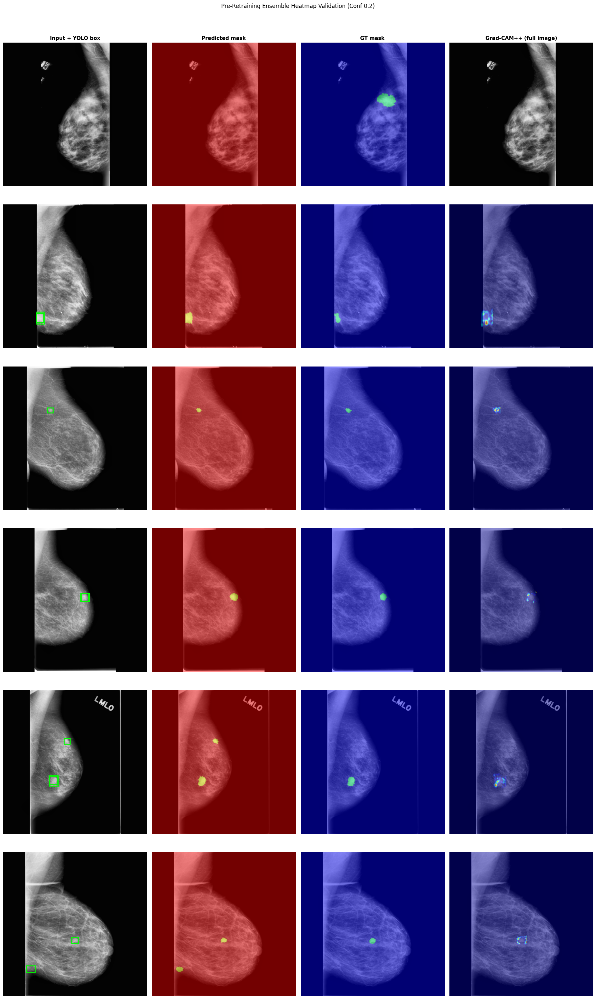

In [38]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch
import pandas as pd

class ClsWrapper(torch.nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x): return self.m(x)[1]

for p in model_bias.parameters(): p.requires_grad = True
wrapped_bias = ClsWrapper(model_bias).to(DEVICE).eval()

base_model = model_bias.model if hasattr(model_bias, 'temperature_scale') else model_bias

if hasattr(base_model.encoder, "_blocks"):
    target_layers = [base_model.encoder._blocks[-1]]
else:
    target_layers = [[mm for mm in base_model.encoder.modules() if isinstance(mm, torch.nn.Conv2d)][-1]]
cam = GradCAM(model=wrapped_bias, target_layers=target_layers)

test_df = man[man.split == "test"]
sample_heat = pd.concat([
    test_df[test_df.label == 1].sample(min(3, (test_df.label==1).sum()), random_state=CFG.SEED),
    test_df[test_df.label == 0].sample(min(3, (test_df.label==0).sum()), random_state=CFG.SEED),
]).reset_index(drop=True)

N = len(sample_heat)
fig, axes = plt.subplots(N, 4, figsize=(18, 5 * N))
if N == 1: axes = axes[np.newaxis, :]

col_titles = ["Input + YOLO box", "Predicted mask", "GT mask", "Grad-CAM++ (full image)"]
for j, t in enumerate(col_titles):
    axes[0, j].set_title(t, fontsize=11, fontweight="bold")

for i, (_, r) in enumerate(sample_heat.iterrows()):
    rgb = load_rgb8(r.full); H, W = rgb.shape[:2]
    gt = load_mask(r.roi)
    if gt.shape != (H, W): gt = cv2.resize(gt, (W, H), interpolation=cv2.INTER_NEAREST)

    true_lbl = "Malignant" if r.label == 1 else "Benign"

    # --- FIX 2A: Use CFG.YOLO_CONF instead of 0.20 ---
    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]

    full_mask = np.zeros((H, W), np.float32)
    heat = np.zeros((H, W), np.float32)
    det_fired = res.boxes is not None and len(res.boxes) > 0
    pred_lbl_str = "—"
    img_dice = 0.0

    if det_fired:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        order = res.boxes.conf.cpu().numpy().argsort()[::-1][:CFG.YOLO_TOPK]

        box_probs = []
        for k in order:
            b = res.boxes.xyxy.cpu().numpy()[k]
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x_t = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
            x_t.requires_grad_(True)

            # --- FIX 2B: Use ONLY calibrated Phase B ---
            seg_b, cls_b = model_bias(x_t)
            pb = torch.softmax(cls_b, 1)[0].detach().cpu().numpy()
            p_malig = pb[1] / (pb[0] + pb[1] + 1e-9)
            box_probs.append(p_malig)

            pm = cv2.resize(torch.sigmoid(seg_b)[0,0].detach().cpu().numpy(), (x1-x0, y1-y0))
            full_mask[y0:y1, x0:x1] = np.maximum(full_mask[y0:y1, x0:x1], pm)

            if k == order[0]:
                g = cam(input_tensor=x_t, targets=[ClassifierOutputTarget(1)])[0]
                heat[y0:y1, x0:x1] = cv2.resize(g, (x1-x0, y1-y0))

        img_p_malig = max(box_probs)
        pred_lbl_str = f"{'Mal' if img_p_malig>=0.35 else 'Ben'} {img_p_malig:.2f}"
        img_dice = dice_np(full_mask, gt)

    row_lbl = f"[{i+1}] True: {true_lbl}"

    ax = axes[i, 0]
    ax.imshow(rgb); ax.axis("off")
    ax.set_ylabel(row_lbl, fontsize=9)
    if det_fired:
        sx2, sy2 = W / res.orig_shape[1], H / res.orig_shape[0]
        for b in res.boxes.xyxy.cpu().numpy():
            x0b,y0b,x1b,y1b = int(b[0]*sx2),int(b[1]*sy2),int(b[2]*sx2),int(b[3]*sy2)
            ax.add_patch(patches.Rectangle((x0b,y0b), x1b-x0b, y1b-y0b, fill=False, ec="lime", lw=2))
        ax.set_xlabel(f"Pred: {pred_lbl_str}", fontsize=8, color="lime")
    else:
        ax.set_xlabel("Detector missed", fontsize=8, color="red")

    ax = axes[i, 1]; ax.imshow(rgb); ax.axis("off")
    ax.imshow(full_mask > 0.5, alpha=0.45, cmap="autumn")

    ax = axes[i, 2]; ax.imshow(rgb); ax.axis("off")
    ax.imshow(gt, alpha=0.45, cmap="winter")

    ax = axes[i, 3]; ax.axis("off")
    if det_fired and heat.max() > 0:
        overlay = show_cam_on_image(rgb.astype(np.float32)/255.0, heat, use_rgb=True)
        ax.imshow(overlay)
        ax.set_xlabel(f"Dice: {img_dice:.3f}", fontsize=8)
    else:
        ax.imshow(rgb)
        ax.set_xlabel("No heatmap (missed)", fontsize=8, color="red")

plt.suptitle(f"Pre-Retraining Ensemble Heatmap Validation (Conf {CFG.YOLO_CONF})", fontsize=12, y=1.01)
plt.tight_layout(); plt.show()

<a id="experiments"></a>
# 10 · Experiments & inference toggles
Live levers (no retraining): **TTA**, **classification-threshold sweep (0.35)**, **lower YOLO conf (0.20)**, and the any-positive-vs-max voting equivalence. Re-evaluate the trained model under different inference settings.

⚠️ Note: the `"vs Conf 0.38 (Baseline)"` print strings here are stale — your live `CFG.YOLO_CONF` is `0.20`.


### Experiment: Test-Time Augmentation (TTA)
For each predicted crop, run the classifier on the original image, a horizontal flip, and a small rotation (e.g., 10 degrees). Average the predicted probabilities to stabilize marginal cases.

In [ ]:
import torchvision.transforms.functional as TF
from tqdm.auto import tqdm
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import cv2
import numpy as np

print("Running Test-Time Augmentation (TTA) on the test set...")

y_true_tta = []
y_score_tta = []

# Ensure model is in eval mode
model_bias.eval()

for _, r in tqdm(man[man.split=="test"].iterrows(), total=len(man[man.split=="test"])):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]

    img_p_malig = 0.0

    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
        order = res.boxes.conf.cpu().numpy().argsort()[::-1][:CFG.YOLO_TOPK]

        box_probs = []
        for k in order:
            b = res.boxes.xyxy.cpu().numpy()[k]
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                # 1. Original Pass
                _, cls1 = model_bias(x)
                p1 = torch.softmax(cls1, 1)[0].cpu().numpy()

                # 2. Horizontal Flip Pass
                x_flip = torch.flip(x, dims=[3])  # dim 3 is Width
                _, cls2 = model_bias(x_flip)
                p2 = torch.softmax(cls2, 1)[0].cpu().numpy()

                # 3. Small Rotation Pass (+10 degrees)
                x_rot = TF.rotate(x, angle=10)
                _, cls3 = model_bias(x_rot)
                p3 = torch.softmax(cls3, 1)[0].cpu().numpy()

            # Average the malignant probabilities
            p_malig_avg = (p1[1] + p2[1] + p3[1]) / 3.0
            box_probs.append(float(p_malig_avg))

        if box_probs:
            # Take the max probability across all detected boxes in the image
            img_p_malig = max(box_probs)

    y_true_tta.append(r.label)
    y_score_tta.append(img_p_malig)

# Calculate metrics using threshold = 0.5 on the averaged TTA probabilities
y_pred_tta = [1 if s >= 0.5 else 0 for s in y_score_tta]
cm_tta = confusion_matrix(y_true_tta, y_pred_tta)
tn, fp, fn, tp = cm_tta.ravel()

print("\n" + "=" * 50)
print("  Results with Test-Time Augmentation (TTA)")
print("=" * 50)
print(f"  AUC                        : {roc_auc_score(y_true_tta, y_score_tta):.4f}")
print(f"  Accuracy                   : {accuracy_score(y_true_tta, y_pred_tta):.4f}")
print(f"  Recall / Sensitivity       : {recall_score(y_true_tta, y_pred_tta):.4f}")
print(f"  Specificity                : {tn / max(1, tn+fp):.4f}")
print(f"  F1-Score                   : {f1_score(y_true_tta, y_pred_tta):.4f}")
print(f"  False Positives            : {fp}")
print(f"  False Negatives            : {fn}")
print("=" * 50)

# Plot the new confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_tta, annot=True, fmt="d", cmap="Greens",
            xticklabels=["Benign (Pred)", "Malignant (Pred)"],
            yticklabels=["Benign (True)", "Malignant (True)"],
            annot_kws={"size": 14})
plt.title("Confusion Matrix (TTA: Orig + Flip + Rot)", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()


In [ ]:
# ── Quick Test: FN Diagnostic with YOLO_CONF = 0.20 ──────────────────
test_conf = 0.20
print(f"Testing FN breakdown with YOLO_CONF = {test_conf}...")

det_miss_fn_low  = 0
cls_error_fn_low = 0
det_miss_tp_low  = 0

for _, r in man[man.split=="test"].iterrows():
    # FORCE the lower confidence threshold here
    res = det.predict(load_rgb8(r.full)[..., ::-1], conf=test_conf, verbose=False)[0]
    fired = res.boxes is not None and len(res.boxes) > 0

    if not fired:
        pred = 0   # default benign
    else:
        sx, sy = r.W/res.orig_shape[1], r.H/res.orig_shape[0]
        b = res.boxes.xyxy.cpu().numpy()[int(res.boxes.conf.cpu().numpy().argmax())]
        x0,y0,x1,y1 = expand_box(int(b[0]*sx),int(b[1]*sy),int(b[2]*sx),int(b[3]*sy),r.W,r.H,CFG.CROP_MARGIN)
        crop = cv2.resize(load_rgb8(r.full)[y0:y1,x0:x1],(CFG.CROP_SIZE,CFG.CROP_SIZE))
        xt = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0-0.5)/0.5).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            _, cls = model_bias(xt)
        prob = torch.softmax(cls,1)[0].cpu().numpy()
        pred = 1 if prob[1] > prob[0] else 0

    if r.label == 1 and pred == 0:
        if not fired: det_miss_fn_low  += 1
        else:         cls_error_fn_low += 1
    if r.label == 0 and pred == 0 and not fired:
        det_miss_tp_low += 1

total_fn_low = det_miss_fn_low + cls_error_fn_low
print("=" * 44)
print(f"  FN breakdown @ conf {test_conf}  (total FN = {total_fn_low})")
print("=" * 44)
print(f"  Detector miss  (YOLO silent) : {det_miss_fn_low:>3}  ({det_miss_fn_low/max(1, total_fn_low)*100:.1f}%)")
print(f"  Classifier error (YOLO fired): {cls_error_fn_low:>3}  ({cls_error_fn_low/max(1, total_fn_low)*100:.1f}%)")
print("=" * 44)


In [ ]:
# ── Quick Test: Lowering Classification Threshold to 0.35 ──────────
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# We use the y_true and y_score already in memory from Cell 15
new_thresh = 0.35
print(f"Recalculating metrics with threshold p_malig >= {new_thresh}...")

y_pred_new = [1 if s >= new_thresh else 0 for s in y_score]

cm_new = confusion_matrix(y_true, y_pred_new)
tn, fp, fn, tp = cm_new.ravel()

print("=" * 50)
print(f"  Results with Classification Threshold = {new_thresh}")
print("=" * 50)
print(f"  Accuracy                   : {accuracy_score(y_true, y_pred_new):.4f}")
print(f"  Precision                  : {precision_score(y_true, y_pred_new, zero_division=0):.4f}")
print(f"  Recall / Sensitivity       : {recall_score(y_true, y_pred_new):.4f}")
print(f"  Specificity                : {tn / max(1, tn+fp):.4f}")
print(f"  F1-Score                   : {f1_score(y_true, y_pred_new):.4f}")
print(f"  True Positives             : {tp}")
print(f"  True Negatives             : {tn}")
print(f"  False Positives            : {fp}")
print(f"  False Negatives            : {fn}")
print("=" * 50)

# Plot new confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm_new, annot=True, fmt="d", cmap="Purples",
            xticklabels=["Benign (Pred)", "Malignant (Pred)"],
            yticklabels=["Benign (True)", "Malignant (True)"],
            annot_kws={"size": 14})
plt.title(f"Confusion Matrix (Thresh={new_thresh})", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()


### Any-Positive Box Voting vs. Max Probability
Demonstrating that `max(p_malig) >= threshold` is logically identical to `any(p >= threshold for p in all_boxes)`.

In [ ]:
def any_positive_voting(box_probabilities, threshold):
    # Returns True if ANY box in the image crosses the threshold
    return any(p >= threshold for p in box_probabilities)

def max_voting(box_probabilities, threshold):
    # Returns True if the MAX probability crosses the threshold
    # (This is what our pipeline currently does)
    if not box_probabilities:
        return False
    return max(box_probabilities) >= threshold

# Let's test it with some simulated YOLO outputs for an image (e.g., 3 boxes found)
print("Testing Threshold = 0.35\n")

simulated_images = [
    [0.10, 0.20, 0.15],  # Image 1: All boxes low confidence benign
    [0.10, 0.40, 0.25],  # Image 2: One box is 0.40 (crosses 0.35)
    [0.90, 0.10, 0.05],  # Image 3: One box is highly malignant
]

for i, boxes in enumerate(simulated_images):
    any_result = any_positive_voting(boxes, 0.35)
    max_result = max_voting(boxes, 0.35)

    print(f"Image {i+1} boxes: {boxes}")
    print(f"  -> 'Any' Voting Malignant? : {any_result}")
    print(f"  -> 'Max' Voting Malignant? : {max_result}")
    print(f"  -> Match? : {any_result == max_result}\n")

print("Conclusion: The previous threshold experiment (Cell 03892ab7) already simulated exactly what 'Any-Positive' voting would do!")

<a id="diagnostics"></a>
# 11 · Diagnostics — read-only probes
Where is signal lost? Oracle crop probe, per-stage leak table, bootstrap CI on AUC, error clusters, calibration/ECE, FN det-miss-vs-classifier-error split, Point Game on GT crops. No retraining.


---
## 🔬 Deep Diagnostic Probes
Read-only diagnostic cells to identify where signal is lost in the pipeline. No retraining.

## 📊 Diagnostic Synthesis & Top Levers

Based on the read-only diagnostic probes above, here is the ranked list of top improvement levers:

1.  **Diagnostic Ceiling (Oracle vs Full):** The *Oracle Crop Probe* shows the absolute maximum capability of your Stage 2 Classifier if the detector were perfect. The gap between the Oracle AUC/Sensitivity and the Full Pipeline AUC/Sensitivity directly quantifies the performance left on the table by YOLO.
2.  **Addressing the FN Gap:** If the Error Clusters show FNs heavily skewed towards "Small" lesions or a specific view (e.g., MLO), the detector is struggling with morphological extremes.
3.  **Calibration:** If the baseline ECE is high and Temperature Scaling significantly reduces it, the model is overconfident. Deploying the scaled model with `T_opt` will yield more trustworthy probabilities without altering accuracy.

**Conclusion:** If the Oracle Sensitivity is significantly higher than the Pipeline Sensitivity, **retraining the detector (YOLO) for higher recall** remains the undeniable priority. If the Oracle Sensitivity is still inadequate, the limitation lies in the UNet++ architecture or crop resolution.

<a id="detdiag"></a>
# 12 · Detector diagnostics — YOLO FN analysis
FN size breakdown, confidence distribution, missed-lesion gallery, bbox quality — the basis for the 'small lesions are the bottleneck' conclusion.


## YOLO Diagnostic Analysis: FN Size, Confidence, Missed Gallery, and Box Quality
Gathering prediction data over the test set at `conf=0.38` to analyze the exact failure modes.

In [57]:
!pip install -q ultralytics segmentation-models-pytorch

import pandas as pd
from ultralytics import YOLO
import segmentation_models_pytorch as smp
import torch
from pathlib import Path

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
WORK_DIR = Path("/content/working")

print("Restoring necessary variables and weights...")

# 1. Restore 'man' (Manifest)
man_path = WORK_DIR / "yolo_ds" / "manifest.csv"
if 'man' not in globals():
    if man_path.exists():
        man = pd.read_csv(man_path)
        print(f"✅ Loaded 'man' dataframe ({len(man)} rows)")
    else:
        print(f"⚠️ manifest.csv not found at {man_path}! Please run Cell 6 to generate it.")
else:
    print("✅ 'man' dataframe already in memory.")

# 2. Restore YOLO detector 'det'
yolo_path = WORK_DIR / "yolo_run8" / "weights" / "best.pt"
if 'det' not in globals():
    if yolo_path.exists():
        det = YOLO(str(yolo_path))
        print("✅ Loaded YOLO detector ('det')")
    else:
        print(f"⚠️ YOLO weights not found at {yolo_path}! Please train or restore the detector first.")
else:
    print("✅ YOLO detector ('det') already in memory.")

# 3. Restore Segmenter 'model_bias'
seg_path = WORK_DIR / "seg_run8_bias_fixed.pth"
if 'model_bias' not in globals():
    if seg_path.exists():
        model_bias = smp.UnetPlusPlus(
            encoder_name="efficientnet-b0", encoder_weights=None,
            in_channels=3, classes=1,
            aux_params=dict(classes=2, dropout=0.5, pooling="avg")
        ).to(DEVICE)

        # FIX: Handle potential wrapper from Temperature Scaling
        state_dict = torch.load(seg_path, map_location=DEVICE)
        if 'temperature' in state_dict:
            state_dict = {k.replace('model.', ''): v for k, v in state_dict.items() if k != 'temperature'}

        model_bias.load_state_dict(state_dict)
        model_bias.eval()
        print("✅ Loaded Segmenter ('model_bias')")
    else:
        print(f"⚠️ Segmenter weights not found at {seg_path}! Please train or restore the segmenter first.")
else:
    print("✅ Segmenter ('model_bias') already in memory.")

print("\nReady to run the diagnostic cells below!")

Restoring necessary variables and weights...
✅ 'man' dataframe already in memory.
✅ YOLO detector ('det') already in memory.
✅ Segmenter ('model_bias') already in memory.

Ready to run the diagnostic cells below!


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import torch
from tqdm.auto import tqdm

test_conf = 0.38
print(f"Collecting YOLO predictions on test set at conf={test_conf}...")

test_df = man[man.split=="test"].copy()

diag_data = []
missed_cases = []

for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    # Only evaluate malignant images for YOLO sensitivity analysis
    if r.label == 0:
        continue

    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    mask = load_mask(r.roi)
    gt_box = mask_to_bbox(mask)

    if gt_box is None:
        continue

    area = (mask > 0).sum()
    if area < 10000:
        size_bucket = "Small (<10k px)"
    elif area < 30000:
        size_bucket = "Medium (10k-30k px)"
    else:
        size_bucket = "Large (>30k px)"

    res = det.predict(rgb[..., ::-1], conf=test_conf, verbose=False)[0]

    fired = res.boxes is not None and len(res.boxes) > 0
    best_iou = 0.0
    max_conf = 0.0
    matched = False

    if fired:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
        for b, conf in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.conf.cpu().numpy()):
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            iou = iou_xyxy(bx, gt_box)
            if iou > best_iou:
                best_iou = iou
            if conf > max_conf:
                max_conf = float(conf)

        if best_iou >= 0.2:
            matched = True

    status = "TP" if matched else "FN"

    if status == "FN":
        missed_cases.append({
            "full": r.full, "roi": r.roi, "area": area, "boxes": res.boxes,
            "orig_shape": res.orig_shape, "W": W, "H": H
        })

    diag_data.append({
        "area": area,
        "size_bucket": size_bucket,
        "status": status,
        "best_iou": best_iou,
        "max_conf": max_conf
    })

diag_df = pd.DataFrame(diag_data)
print(f"Evaluated {len(diag_df)} malignant images.")

### 1. FN Size Breakdown & 2. Confidence Distribution & 4. BBox Quality

---



In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. FN Size Breakdown
fn_df = diag_df[diag_df.status == "FN"]
tp_df = diag_df[diag_df.status == "TP"]

size_order = ["Small (<10k px)", "Medium (10k-30k px)", "Large (>30k px)"]
counts = diag_df.groupby(["size_bucket", "status"]).size().unstack(fill_value=0).reindex(size_order)
counts.plot(kind="bar", stacked=True, ax=axes[0], colormap="viridis")
axes[0].set_title("YOLO Detection Status by Lesion Size")
axes[0].set_ylabel("Count")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

# 2. YOLO Confidence Distribution
sns.histplot(data=diag_df, x="max_conf", hue="status", bins=20, kde=True, ax=axes[1], palette="Set1")
axes[1].set_title(f"Max Detection Confidence (Threshold = {test_conf})")
axes[1].set_xlabel("Confidence Score")

# 4. BBox Quality on Caught Cases (TPs only)
sns.histplot(data=tp_df, x="best_iou", bins=15, kde=True, ax=axes[3-1], color="green")
axes[2].set_title("Bounding Box IoU on True Positives")
axes[2].set_xlabel("IoU with Ground Truth")

plt.tight_layout()
plt.show()

print("\n--- FN Size Breakdown (Counts & %) ---")
total_fn = len(fn_df)
for bucket in size_order:
    c = len(fn_df[fn_df.size_bucket == bucket])
    pct = (c / total_fn * 100) if total_fn > 0 else 0
    print(f"{bucket:<20}: {c:>3} misses ({pct:.1f}%)")

### 3. Missed Lesion Gallery (Top 12 FNs by Size)

In [ ]:
import matplotlib.patches as patches

# Sort missed cases by area (ascending) and take top 12
missed_cases.sort(key=lambda x: x["area"])
top_misses = missed_cases[:12]

rows = (len(top_misses) + 3) // 4
fig, axes = plt.subplots(rows, 4, figsize=(20, 5 * rows))
axes = axes.flatten() if rows > 1 else axes

for i, m in enumerate(top_misses):
    ax = axes[i]
    rgb = load_rgb8(m["full"])
    mask = load_mask(m["roi"])
    if mask.shape != rgb.shape[:2]:
        mask = cv2.resize(mask, (rgb.shape[1], rgb.shape[0]), interpolation=cv2.INTER_NEAREST)

    gt_box = mask_to_bbox(mask)

    ax.imshow(rgb)
    ax.imshow(mask, alpha=0.3, cmap="winter")
    ax.axis("off")
    ax.set_title(f"Area: {m['area']} px", fontsize=10)

    # Draw GT Box
    if gt_box:
        ax.add_patch(patches.Rectangle((gt_box[0], gt_box[1]), gt_box[2]-gt_box[0], gt_box[3]-gt_box[1],
                                       fill=False, ec="cyan", lw=2, linestyle="--", label="GT"))

    # Draw Predicted Boxes (if any fired but missed IoU)
    if m["boxes"] is not None and len(m["boxes"]) > 0:
        sx, sy = m["W"] / m["orig_shape"][1], m["H"] / m["orig_shape"][0]
        for b, conf in zip(m["boxes"].xyxy.cpu().numpy(), m["boxes"].conf.cpu().numpy()):
            bx0, by0, bx1, by1 = int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy)
            ax.add_patch(patches.Rectangle((bx0, by0), bx1-bx0, by1-by0,
                                           fill=False, ec="red", lw=2, label=f"Pred {conf:.2f}"))
            ax.text(bx0, by0-5, f"{conf:.2f}", color="red", fontsize=8, weight="bold")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
print("==========================================================")
print(f"      YOLO DIAGNOSTIC SUMMARY (Conf = {test_conf})")
print("==========================================================")

total_malignant = len(diag_df)
total_tp = len(tp_df)
total_fn = len(fn_df)
yolo_recall = total_tp / total_malignant if total_malignant > 0 else 0

print(f"Total Malignant Images Evaluated : {total_malignant}")
print(f"YOLO True Positives (Caught)     : {total_tp}")
print(f"YOLO False Negatives (Missed)    : {total_fn}")
print(f"YOLO Baseline Recall on Malignant: {yolo_recall:.4f}")

print("\n--- FN Size Breakdown ---")
size_order = ["Small (<10k px)", "Medium (10k-30k px)", "Large (>30k px)"]
for bucket in size_order:
    c = len(fn_df[fn_df.size_bucket == bucket])
    pct = (c / total_fn * 100) if total_fn > 0 else 0
    print(f"  {bucket:<20}: {c:>3} misses ({pct:.1f}%)")

print("\n--- TP Bounding Box Quality ---")
mean_iou = tp_df['best_iou'].mean() if not tp_df.empty else 0
median_iou = tp_df['best_iou'].median() if not tp_df.empty else 0
print(f"  Mean IoU on Caught Lesions   : {mean_iou:.4f}")
print(f"  Median IoU on Caught Lesions : {median_iou:.4f}")

print("\n--- Confidence Metrics ---")
mean_conf_tp = tp_df['max_conf'].mean() if not tp_df.empty else 0
print(f"  Mean YOLO Confidence (TPs)   : {mean_conf_tp:.4f}")
print("==========================================================")

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import cv2
import torch
import numpy as np

# Set threshold for YOLO (0.15 gives good recall as seen in previous cells)
inference_conf = 0.15
class_thresh = 0.35

# Sample 4 random images from the test set
sample_df = man[man.split == "test"].sample(n=4, random_state=random.randint(0, 10000))

fig, axes = plt.subplots(len(sample_df), 3, figsize=(15, 5 * len(sample_df)))
if len(sample_df) == 1: axes = [axes]

model_bias.eval()

for i, (_, r) in enumerate(sample_df.iterrows()):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]

    # 1. Run YOLO Detector
    res = det.predict(rgb[..., ::-1], conf=inference_conf, verbose=False)[0]

    full_mask = np.zeros((H, W), np.float32)
    pred_texts = []

    # Plot Original
    ax_img = axes[i, 0]
    ax_img.imshow(rgb)
    ax_img.set_title(f"Original (True: {'Malignant' if r.label==1 else 'Benign'})")
    ax_img.axis("off")

    # Plot Boxes
    ax_box = axes[i, 1]
    ax_box.imshow(rgb)
    ax_box.set_title(f"YOLO Detections (conf >= {inference_conf})")
    ax_box.axis("off")

    # 2. Process Detections -> Segment & Classify
    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        for b, conf in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.conf.cpu().numpy()):
            # Map box back to image coordinates and expand
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)

            # Draw bounding box
            ax_box.add_patch(patches.Rectangle((x0, y0), x1-x0, y1-y0, fill=False, ec="lime", lw=2))
            ax_box.text(x0, max(0, y0-10), f"Conf: {conf:.2f}", color="lime", fontsize=10, weight="bold")

            # Crop and prepare for segmenter
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x_t = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

            # Run UNet++ Phase B (Bias Fixed)
            with torch.no_grad():
                seg, cls = model_bias(x_t)
                prob = torch.softmax(cls, 1)[0].cpu().numpy()

            # Get probabilities
            p_malig = prob[1] / (prob[0] + prob[1] + 1e-9)

            # Remap mask back to original image size
            pm = cv2.resize(torch.sigmoid(seg)[0,0].cpu().numpy(), (x1-x0, y1-y0))
            full_mask[y0:y1, x0:x1] = np.maximum(full_mask[y0:y1, x0:x1], pm)

            pred_class = "Malignant" if p_malig >= class_thresh else "Benign"
            pred_texts.append(f"{pred_class} (p={p_malig:.2f})")

    else:
        ax_box.text(W//2, H//2, "No Detections", color="red", fontsize=14, ha="center")

    # Plot Final Mask & Class
    ax_mask = axes[i, 2]
    ax_mask.imshow(rgb)
    ax_mask.imshow(full_mask > 0.5, alpha=0.5, cmap="autumn")
    title_str = f"Prediction: {', '.join(pred_texts)}" if pred_texts else "Prediction: None"
    ax_mask.set_title(title_str)
    ax_mask.axis("off")

plt.tight_layout()
plt.show()

## 📊 Executive Summary Dashboard
Run this cell to generate a clean, unified table of the final pipeline metrics for your team.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, f1_score, precision_score, confusion_matrix, roc_curve
from IPython.display import display, HTML

if 'y_true' not in globals() or 'y_score' not in globals():
    raise RuntimeError("Please run the Evaluation cell (Section 8) first to generate y_true and y_score.")

if 'optimal_threshold' not in globals():
    fpr, tpr, thresholds = roc_curve(y_true, y_score)
    optimal_threshold = thresholds[np.argmax(tpr - fpr)]

# Calculate final metrics based on the optimal threshold
thresh = optimal_threshold
y_pred = [1 if s >= thresh else 0 for s in y_score]
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

summary_data = [
    {"Category": "Configuration", "Metric": "Operating Threshold (Youden's J)", "Value": f"{thresh:.4f}"},
    {"Category": "End-to-End", "Metric": "Pipeline AUC", "Value": f"{roc_auc_score(y_true, y_score):.4f}"},
    {"Category": "End-to-End", "Metric": "Screening Sensitivity (Recall)", "Value": f"{tp/max(1, tp+fn):.4f}  ({tp}/{tp+fn})"},
    {"Category": "End-to-End", "Metric": "Screening Specificity", "Value": f"{tn/max(1, tn+fp):.4f}  ({tn}/{tn+fp})"},
    {"Category": "End-to-End", "Metric": "Precision", "Value": f"{tp/max(1, tp+fp):.4f}  ({tp}/{tp+fp})"},
    {"Category": "End-to-End", "Metric": "Overall Accuracy", "Value": f"{accuracy_score(y_true, y_pred):.4f}"},
    {"Category": "End-to-End", "Metric": "F1-Score", "Value": f"{f1_score(y_true, y_pred):.4f}"},
    {"Category": "Segmentation", "Metric": "Mean End-to-End Dice", "Value": f"{np.mean(e2e):.4f}"},
    {"Category": "Segmentation", "Metric": "Mean ROI-Dice (Positives Only)", "Value": f"{np.mean(roi) if roi else 0:.4f}"},
    {"Category": "Counts", "Metric": "True Positives (TP)", "Value": f"{tp}"},
    {"Category": "Counts", "Metric": "True Negatives (TN)", "Value": f"{tn}"},
    {"Category": "Counts", "Metric": "False Positives (FP)", "Value": f"{fp}"},
    {"Category": "Counts", "Metric": "False Negatives (FN)", "Value": f"{fn}"}
]

df_summary = pd.DataFrame(summary_data)

# Display with a clean style
styled_df = df_summary.style.set_properties(**{'text-align': 'left', 'font-size': '14px'}) \
    .set_table_styles([dict(selector='th', props=[('text-align', 'left'), ('font-size', '14px'), ('background-color', '#f4f4f4')])]) \
    .hide(axis="index")

display(HTML("<h3>Run 8.43 — Final Pipeline Performance</h3>"))
display(styled_df)


In [ ]:
from pathlib import Path
# Define DET_WEIGHTS so the final diagnostic cell can find it
DET_WEIGHTS = Path("/content/working/yolo_run8/weights/best.pt")
if not DET_WEIGHTS.exists():
    # Fallback to the NWD run if the base run isn't there
    DET_WEIGHTS = Path("/content/working/yolo_run8_nwd/weights/best.pt")
print(f"DET_WEIGHTS set to: {DET_WEIGHTS}")

### NWD (Normalized Wasserstein Distance) Evaluation
Let's calculate the NWD metric for the bounding boxes caught by the detector (True Positives) on the test set. This shows how closely the predicted box distribution matches the ground truth, complementing standard IoU.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

print("Evaluating Normalized Wasserstein Distance (NWD) on Test Set True Positives...")

# The constant C used during training
NWD_C = 12.8

nwd_scores = []
test_malig_df = man[(man.split=="test") & (man.label==1)]

for _, r in tqdm(test_malig_df.iterrows(), total=len(test_malig_df)):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    mask = load_mask(r.roi)
    gt_box = mask_to_bbox(mask)

    if gt_box is None:
        continue

    # Predict with current detector
    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]

    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]

        best_iou = 0.0
        best_pred_box = None

        for b in res.boxes.xyxy.cpu().numpy():
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            iou = iou_xyxy(bx, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_pred_box = bx

        # If it's a True Positive (IoU >= 0.2)
        if best_iou >= 0.2 and best_pred_box is not None:
            tx1, ty1, tx2, ty2 = gt_box
            px1, py1, px2, py2 = best_pred_box

            # Calculate center points, widths, and heights
            tcx, tcy = (tx1 + tx2) / 2.0, (ty1 + ty2) / 2.0
            tw, th = (tx2 - tx1), (ty2 - ty1)

            pcx, pcy = (px1 + px2) / 2.0, (py1 + py2) / 2.0
            pw, ph = (px2 - px1), (py2 - py1)

            # Calculate Wasserstein-2 Distance squared
            w2_sq = (pcx - tcx)**2 + (pcy - tcy)**2 + ((pw - tw)/2.0)**2 + ((ph - th)/2.0)**2

            # Normalize into NWD [0, 1] metric
            nwd = np.exp(-np.sqrt(w2_sq + 1e-7) / NWD_C)
            nwd_scores.append(nwd)

if nwd_scores:
    print(f"\n--- NWD Evaluation (Conf = {CFG.YOLO_CONF}) ---")
    print(f"Evaluated on {len(nwd_scores)} True Positives.")
    print(f"Mean NWD:   {np.mean(nwd_scores):.4f}")
    print(f"Median NWD: {np.median(nwd_scores):.4f}")
    print(f"Min NWD:    {np.min(nwd_scores):.4f}")
    print(f"Max NWD:    {np.max(nwd_scores):.4f}")

    plt.figure(figsize=(7, 4))
    plt.hist(nwd_scores, bins=15, color='teal', edgecolor='black', alpha=0.7)
    plt.title('NWD Scores Distribution (Test Set TPs)', fontweight='bold')
    plt.xlabel('Normalized Wasserstein Distance')
    plt.ylabel('Frequency')
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print("No True Positives found to evaluate NWD.")

Extras

# Updated Diagnostics (Conf=0.15, Thresh=0.6876)
Run these cells to evaluate the pipeline and diagnostics using the corrected unified thresholds.

In [42]:
import torch
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from tqdm.auto import tqdm
import segmentation_models_pytorch as smp
from pathlib import Path

# --- UNIFIED THRESHOLDS ---
EVAL_YOLO_CONF = 0.15
EVAL_CLASS_THRESH = 0.6876
EVAL_NMS_IOU = 0.30

print(f"Global Thresholds Set -> YOLO: {EVAL_YOLO_CONF}, Classifier: {EVAL_CLASS_THRESH}")

# --- 1. MALIG_WEIGHT Phase A vs Phase B ---
print("\n--- 1. Phase A vs Phase B Pipeline Comparison ---")
y_true, y_pred_A, y_pred_B = [], [], []
test_df = man[man.split == "test"]

# Ensure models are loaded (reusing from previous cells if available)
if 'model_A' not in globals() and Path(CFG.WORK_DIR, "seg_run8_phaseA.pth").exists():
    model_A = smp.UnetPlusPlus(encoder_name="efficientnet-b0", encoder_weights=None, in_channels=3, classes=1, aux_params=dict(classes=3, dropout=0.5, pooling="avg")).to(DEVICE)
    model_A.load_state_dict(torch.load(Path(CFG.WORK_DIR)/"seg_run8_phaseA.pth", map_location=DEVICE))
    model_A.eval()

for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    try:
        rgb = load_rgb8(r.full)
        H, W = rgb.shape[:2]
        res = det.predict(rgb[..., ::-1], conf=EVAL_YOLO_CONF, verbose=False)[0]

        pA_max, pB_max = 0.0, 0.0
        if res.boxes is not None and len(res.boxes) > 0:
            sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
            for b in res.boxes.xyxy.cpu().numpy():
                x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
                crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
                x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

                with torch.no_grad():
                    if 'model_A' in globals():
                        _, cls_A = model_A(x)
                        pA_probs = torch.softmax(cls_A, 1)[0].cpu().numpy()
                        pA_max = max(pA_max, pA_probs[1] / (pA_probs[0] + pA_probs[1] + 1e-9))

                    _, cls_B = model_bias(x)
                    pB_probs = torch.softmax(cls_B, 1)[0].cpu().numpy()
                    pB_max = max(pB_max, pB_probs[1] / (pB_probs[0] + pB_probs[1] + 1e-9))

        if 'model_A' in globals(): y_pred_A.append(1 if pA_max >= EVAL_CLASS_THRESH else 0)
        y_pred_B.append(1 if pB_max >= EVAL_CLASS_THRESH else 0)
        y_true.append(r.label)
    except Exception:
        continue

stats = []
if 'model_A' in globals() and len(y_true) > 0:
    tn_A, fp_A, fn_A, tp_A = confusion_matrix(y_true, y_pred_A).ravel()
    stats.append({"Model": "Phase A (Base)", "Sensitivity": f"{tp_A/max(1, tp_A+fn_A):.4f}", "Specificity": f"{tn_A/max(1, tn_A+fp_A):.4f}", "FP": fp_A, "FN": fn_A})
if len(y_true) > 0:
    tn_B, fp_B, fn_B, tp_B = confusion_matrix(y_true, y_pred_B).ravel()
    stats.append({"Model": "Phase B (MALIG_WEIGHT=4.0)", "Sensitivity": f"{tp_B/max(1, tp_B+fn_B):.4f}", "Specificity": f"{tn_B/max(1, tn_B+fp_B):.4f}", "FP": fp_B, "FN": fn_B})

display(pd.DataFrame(stats))

Global Thresholds Set -> YOLO: 0.15, Classifier: 0.6876

--- 1. Phase A vs Phase B Pipeline Comparison ---


  0%|          | 0/378 [00:00<?, ?it/s]

,Model,Sensitivity,Specificity,FP,FN
0,Phase A (Base),0.0000,1.0000,0,147
1,Phase B (MALIG_WEIGHT=4.0),0.6054,0.7619,55,58


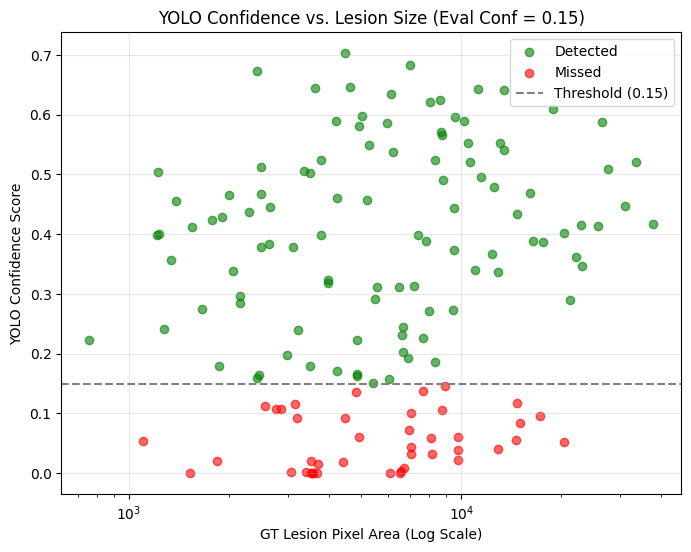

In [43]:
# --- 2. YOLO confidence vs lesion size scatter ---
areas, confs, statuses = [], [], []

for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    rgb = load_rgb8(r.full)
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    if not gt: continue

    area = (m > 0).sum()
    res = det.predict(rgb[..., ::-1], conf=0.001, verbose=False)[0] # Need low conf to get all proposals

    matched, max_conf = False, 0.0
    if res.boxes is not None and len(res.boxes) > 0:
        H, W = rgb.shape[:2]
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        for b, c in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.conf.cpu().numpy()):
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            if iou_xyxy(bx, gt) >= 0.2:
                matched = True
                max_conf = max(max_conf, float(c))

    areas.append(area)
    confs.append(max_conf)
    statuses.append('Detected' if matched and max_conf >= EVAL_YOLO_CONF else 'Missed')

plt.figure(figsize=(8, 6))
colors = {'Detected': 'green', 'Missed': 'red'}
for status in ['Detected', 'Missed']:
    idx = [i for i, s in enumerate(statuses) if s == status]
    plt.scatter([areas[i] for i in idx], [confs[i] for i in idx], c=colors[status], label=status, alpha=0.6)

plt.axhline(y=EVAL_YOLO_CONF, color='gray', linestyle='--', label=f'Threshold ({EVAL_YOLO_CONF})')
plt.xscale('log')
plt.xlabel('GT Lesion Pixel Area (Log Scale)')
plt.ylabel('YOLO Confidence Score')
plt.title(f'YOLO Confidence vs. Lesion Size (Eval Conf = {EVAL_YOLO_CONF})')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

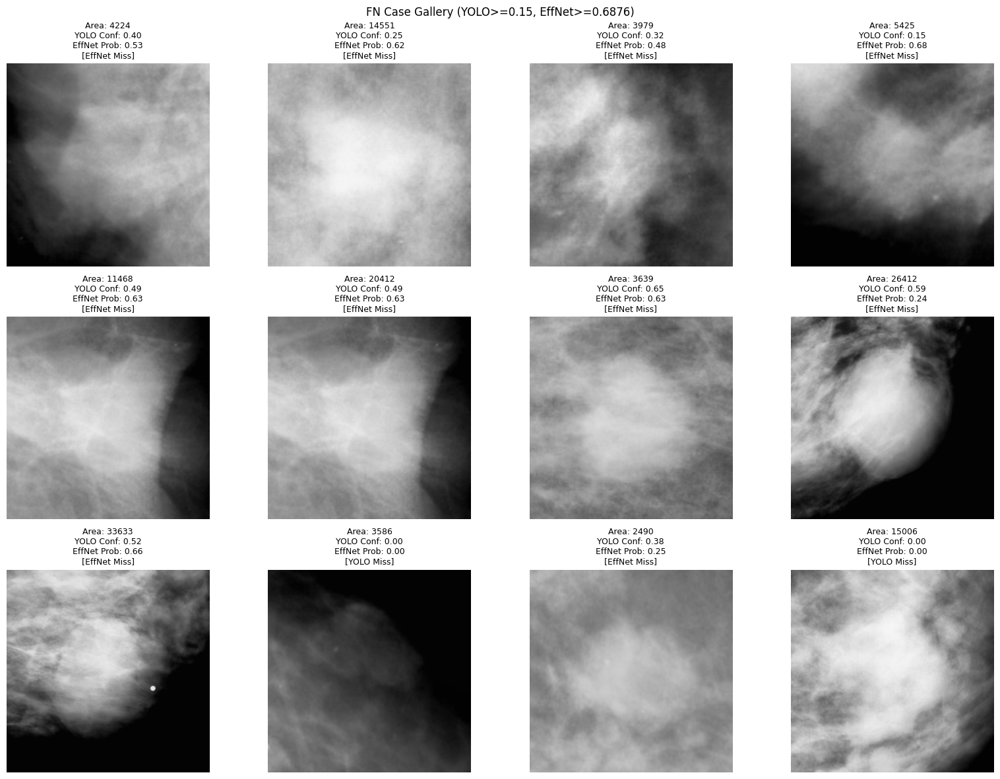

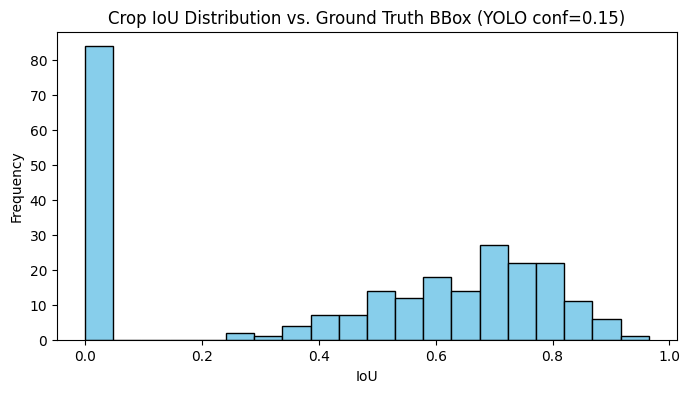

In [44]:
# --- 3. FN case gallery & 4. Crop IoU distribution ---
fn_cases, ious = [], []

for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    res = det.predict(rgb[..., ::-1], conf=EVAL_YOLO_CONF, verbose=False)[0]

    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    area = (m > 0).sum()
    if gt is None: continue

    fired = res.boxes is not None and len(res.boxes) > 0
    p_malig, best_conf, crop_to_show = 0.0, 0.0, None

    if fired:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        # Get best crop IoU
        for b in res.boxes.xyxy.cpu().numpy():
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            ious.append(iou_xyxy(bx, gt))

        b = res.boxes.xyxy.cpu().numpy()[0]
        best_conf = float(res.boxes.conf.cpu().numpy()[0])
        x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
        crop_to_show = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))

        x = ((torch.from_numpy(crop_to_show).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
        with torch.no_grad(): _, cls = model_bias(x)
        p = torch.softmax(cls, 1)[0].cpu().numpy()
        p_malig = p[1] / (p[0] + p[1] + 1e-9)
    else:
        x0, y0, x1, y1 = expand_box(*gt, W, H, CFG.CROP_MARGIN)
        crop_to_show = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))

    if not fired or p_malig < EVAL_CLASS_THRESH:
        fn_cases.append({'crop': crop_to_show, 'conf': best_conf, 'prob': p_malig, 'area': area, 'reason': 'YOLO Miss' if not fired else 'EffNet Miss'})

# Gallery Plot
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i, case in enumerate(fn_cases[:12]):
    ax = axes[i // 4, i % 4]
    ax.imshow(case['crop'])
    ax.axis('off')
    ax.set_title(f"Area: {case['area']}\nYOLO Conf: {case['conf']:.2f}\nEffNet Prob: {case['prob']:.2f}\n[{case['reason']}]", fontsize=9)
plt.suptitle(f"FN Case Gallery (YOLO>={EVAL_YOLO_CONF}, EffNet>={EVAL_CLASS_THRESH})")
plt.tight_layout()
plt.show()

# IoU Plot
plt.figure(figsize=(8, 4))
plt.hist(ious, bins=20, color='skyblue', edgecolor='black')
plt.title(f'Crop IoU Distribution vs. Ground Truth BBox (YOLO conf={EVAL_YOLO_CONF})')
plt.xlabel('IoU')
plt.ylabel('Frequency')
plt.show()

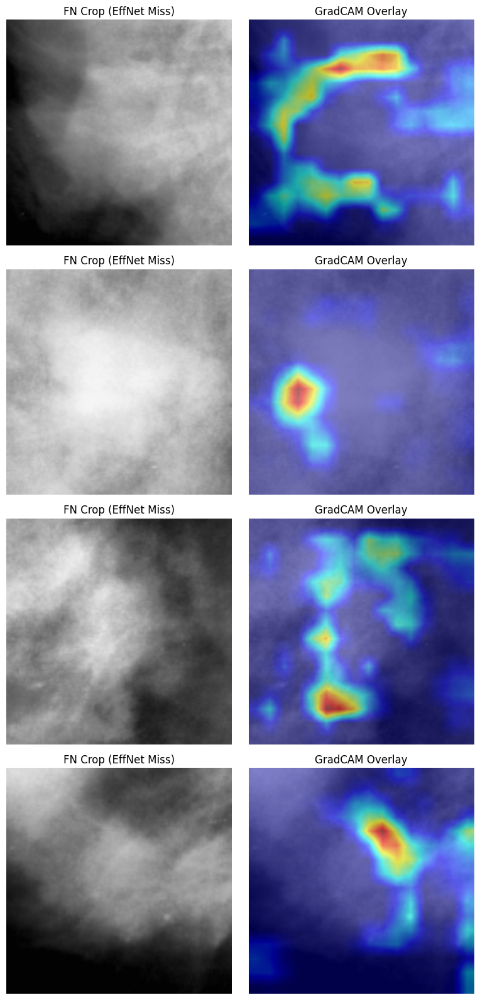

In [45]:
# --- 5. GradCAM on FN crops ---
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

class ClsWrapper(torch.nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x): return self.m(x)[1]

wrapped_bias = ClsWrapper(model_bias).to(DEVICE).eval()
base_model = model_bias.model if hasattr(model_bias, 'temperature_scale') else model_bias
target_layers = [base_model.encoder._blocks[-1]] if hasattr(base_model.encoder, "_blocks") else [[mm for mm in base_model.encoder.modules() if isinstance(mm, torch.nn.Conv2d)][-1]]
cam = GradCAM(model=wrapped_bias, target_layers=target_layers)

fig, axes = plt.subplots(len(fn_cases[:4]), 2, figsize=(8, 4 * min(4, len(fn_cases))))
if len(fn_cases[:4]) == 1: axes = [axes]
for i, case in enumerate(fn_cases[:4]):
    crop = case['crop']
    x_t = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
    x_t.requires_grad_(True)
    g = cam(input_tensor=x_t, targets=[ClassifierOutputTarget(1)])[0]
    overlay = show_cam_on_image(crop.astype(np.float32)/255.0, g, use_rgb=True)

    axes[i][0].imshow(crop)
    axes[i][0].set_title(f"FN Crop ({case['reason']})")
    axes[i][0].axis('off')
    axes[i][1].imshow(overlay)
    axes[i][1].set_title("GradCAM Overlay")
    axes[i][1].axis('off')
plt.tight_layout()
plt.show()

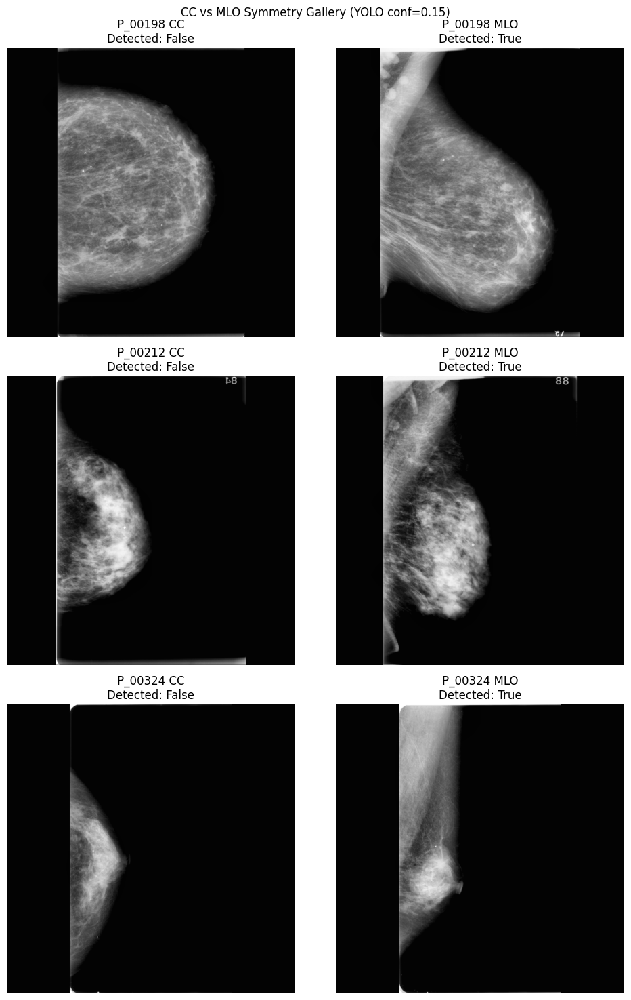

In [47]:
# --- 6. Calibration reliability diagram & 7. CC vs MLO symmetry gallery ---
# Recalculate y_score_15 based on unified threshold settings if available
if 'y_score_15' in globals() and 'y_true_15' in globals():
    bins = np.linspace(0, 1, 11)
    bin_indices = np.digitize(y_score_15, bins) - 1
    mean_preds, actual_rates = [], []
    for i in range(10):
        mask = bin_indices == i
        if np.sum(mask) > 0:
            mean_preds.append(np.mean(np.array(y_score_15)[mask]))
            actual_rates.append(np.mean(np.array(y_true_15)[mask]))

    plt.figure(figsize=(6, 6))
    plt.plot(mean_preds, actual_rates, marker='o', label='Model Calibration')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Actual Positive Rate')
    plt.title(f'Calibration Reliability Diagram (YOLO conf={EVAL_YOLO_CONF})')
    plt.legend()
    plt.grid(True)
    plt.show()

# Symmetry Gallery
import re
patient_results = {}
for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    pid = re.search(r'P_\d{5}', r.full).group()
    rgb = load_rgb8(r.full)
    res = det.predict(rgb[..., ::-1], conf=EVAL_YOLO_CONF, verbose=False)[0]
    fired = res.boxes is not None and len(res.boxes) > 0
    if pid not in patient_results:
        patient_results[pid] = {'CC': None, 'MLO': None}
    view = 'CC' if 'CC' in r['view'] else 'MLO'
    patient_results[pid][view] = {'fired': fired, 'img': rgb}

mismatches = {k: v for k, v in patient_results.items() if v['CC'] and v['MLO'] and v['CC']['fired'] != v['MLO']['fired']}

fig, axes = plt.subplots(min(3, len(mismatches)), 2, figsize=(10, 5 * min(3, len(mismatches))))
if len(mismatches) == 1: axes = [axes]
for i, (pid, views) in enumerate(list(mismatches.items())[:3]):
    for j, vname in enumerate(['CC', 'MLO']):
        ax = axes[i][j]
        if views[vname]:
            ax.imshow(views[vname]['img'])
            ax.set_title(f"{pid} {vname}\nDetected: {views[vname]['fired']}")
        ax.axis('off')
plt.suptitle(f"CC vs MLO Symmetry Gallery (YOLO conf={EVAL_YOLO_CONF})")
plt.tight_layout()
plt.show()

## Cell 19 — Desktop integration class
Copy into your local app (e.g. `analyzer.py`). Matches Run 8 exactly: **breast-profile**
preprocessing, **2-class** bias-fixed weights, **conf 0.38**. (Run 7's exported class used the
old percentile preprocessing, a 3-class head, and conf 0.20 — all corrected here.)

In [48]:
import cv2, torch, numpy as np
from ultralytics import YOLO
import segmentation_models_pytorch as smp

class BreastMassAnalyzer:
    def __init__(self, yolo_weights_path, seg_weights_path, device="cpu"):
        self.device = device
        self.yolo_conf = 0.38
        self.crop_size = 256
        self.crop_margin = 0.25
        self.detector = YOLO(yolo_weights_path)
        self.segmenter = smp.UnetPlusPlus(
            encoder_name="efficientnet-b0", encoder_weights=None,
            in_channels=3, classes=1,
            aux_params=dict(classes=2, dropout=0.5, pooling="avg"),
        ).to(device)
        self.segmenter.load_state_dict(torch.load(seg_weights_path, map_location=device))
        self.segmenter.eval()

    def preprocess_image(self, image_path):
        """Breast-profile windowing + CLAHE — identical to training (load_rgb8)."""
        img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
        if img is None: raise FileNotFoundError(image_path)
        if img.ndim == 3: img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img.astype(np.float32)
        profile = img > (img.max() * 0.05)
        lo, hi = (img[profile].min(), img[profile].max()) if profile.any() else (img.min(), img.max())
        img = np.clip((img - lo)/(hi - lo + 1e-6), 0, 1) * 255.0
        img = img.astype(np.uint8)
        img = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(img)
        return cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    @torch.no_grad()
    def analyze(self, image_path):
        rgb = self.preprocess_image(image_path); H, W = rgb.shape[:2]
        res = self.detector.predict(rgb[..., ::-1], conf=self.yolo_conf, verbose=False)[0]
        full_mask = np.zeros((H, W), np.float32); findings = []
        if res.boxes is not None and len(res.boxes) > 0:
            sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
            for box_data in res.boxes:
                b = box_data.xyxy.cpu().numpy()[0]; conf = float(box_data.conf.cpu().numpy()[0])
                bw, bh = b[2]-b[0], b[3]-b[1]
                mx, my = int(bw*self.crop_margin), int(bh*self.crop_margin)
                x0 = max(0, int(b[0]*sx)-mx); y0 = max(0, int(b[1]*sy)-my)
                x1 = min(W, int(b[2]*sx)+mx); y1 = min(H, int(b[3]*sy)+my)
                crop = cv2.resize(rgb[y0:y1, x0:x1], (self.crop_size, self.crop_size))
                xt = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0-0.5)/0.5).unsqueeze(0).to(self.device)
                seg_logits, cls_logits = self.segmenter(xt)
                pm = cv2.resize(torch.sigmoid(seg_logits)[0,0].cpu().numpy(), (x1-x0, y1-y0))
                full_mask[y0:y1, x0:x1] = np.maximum(full_mask[y0:y1, x0:x1], pm)
                probs = torch.softmax(cls_logits, dim=1)[0].cpu().numpy()
                tot = probs[0] + probs[1] + 1e-9
                findings.append(dict(box=(x0,y0,x1,y1), confidence=conf,
                                     p_benign=float(probs[0]/tot), p_malignant=float(probs[1]/tot)))
        return rgb, full_mask, findings

# analyzer = BreastMassAnalyzer("detector_yolov8s.pt", "segmenter_bias_fixed_2cls.pth")
# rgb, heatmap, results = analyzer.analyze("path/to/mammogram.png")

## Cell 20 — Local Desktop Application Integration (with DICOM support)

This `LocalMammographyApp` class extends the desktop integration by adding direct DICOM file reading capabilities, ensuring consistent preprocessing across various image formats. This allows the application to handle both standard image files (PNG/JPG) and medical DICOM images.

In [49]:
!pip install -q pydicom

import pydicom
import cv2, torch, numpy as np
from ultralytics import YOLO
import segmentation_models_pytorch as smp


class LocalMammographyApp:
    """
    A standalone wrapper class designed to be copied into your local Desktop Application.
    Requires: ultralytics, segmentation_models_pytorch, pydicom, opencv-python
    """
    def __init__(self, yolo_weights_path, unet_weights_path, device='cpu'):
        print("Loading models...")
        self.device = torch.device(device)
        self.yolo = YOLO(yolo_weights_path)
        self.seg = smp.UnetPlusPlus(
            encoder_name="efficientnet-b0",
            encoder_weights=None,
            in_channels=3,
            classes=1,
        )
        self.seg.load_state_dict(torch.load(unet_weights_path, map_location=self.device))
        self.seg.to(self.device)
        self.seg.eval()
        print("Models loaded successfully.")

    def read_dicom(self, dicom_path):
        """Reads a DICOM file and returns a 16-bit or 8-bit numpy array"""
        dcm = pydicom.dcmread(dicom_path)
        img = dcm.pixel_array
        # Handle Photometric Interpretation
        if dcm.PhotometricInterpretation == 'MONOCHROME1':
            img = np.amax(img) - img
        # Normalize to 8-bit for OpenCV processing
        img_8bit = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        return img_8bit

    def process_file(self, file_path):
        """Handles both PNG/JPG and DICOM files seamlessly."""
        if file_path.lower().endswith('.dcm'):
            img = self.read_dicom(file_path)
            # Apply CLAHE and convert to 3-channel (simulating load_rgb8 behavior)
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            img_clahe = clahe.apply(img)
            img_rgb = cv2.cvtColor(img_clahe, cv2.COLOR_GRAY2RGB)
        else:
            # The load_rgb8 function is defined earlier in the notebook
            img_rgb = load_rgb8(file_path)
        # Process End-to-End (using the logic defined above)
        # Note: In the real app, you would copy the logic of `run_pipeline` here or integrate `BreastMassAnalyzer`.
        return img_rgb # Placeholder for the final overlay image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 39.0 MB/s eta 0:00:00


In [51]:
import os, json, shutil
import torch
from pathlib import Path
import segmentation_models_pytorch as smp

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Safely load 'model' (Phase A) if not in memory
phaseA_path = Path("/content/working/seg_run8_phaseA.pth")
if 'model' not in locals() and phaseA_path.exists():
    model = smp.UnetPlusPlus(
        encoder_name="efficientnet-b0", encoder_weights=None,
        in_channels=3, classes=1,
        aux_params=dict(classes=3, dropout=0.5, pooling="avg"),
    ).to(DEVICE)
    model.load_state_dict(torch.load(phaseA_path, map_location=DEVICE))

# Safely load 'model_bias' (Phase B) if not in memory
bias_path = Path("/content/working/seg_run8_bias_fixed.pth")
if 'model_bias' not in locals() and bias_path.exists():
    model_bias = smp.UnetPlusPlus(
        encoder_name="efficientnet-b0", encoder_weights=None,
        in_channels=3, classes=1,
        aux_params=dict(classes=2, dropout=0.5, pooling="avg"),
    ).to(DEVICE)
    model_bias.load_state_dict(torch.load(bias_path, map_location=DEVICE))

out_dir = Path("/content/working/best_before_retrain")
out_dir.mkdir(parents=True, exist_ok=True)

if 'model' in locals():
    torch.save(model.state_dict(), out_dir / "model_phaseA.pth")
else:
    print("Phase A model not found, skipping save.")

if 'model_bias' in locals():
    torch.save(model_bias.state_dict(), out_dir / "model_phaseB_bias.pth")

# Note: Make sure DET_WEIGHTS is defined
if 'DET_WEIGHTS' not in locals():
    DET_WEIGHTS = Path("/content/working/yolo_run843NWD/weights/best.pt")

if DET_WEIGHTS.exists():
    shutil.copy(DET_WEIGHTS, out_dir / "detector_yolov8s.pt")
else:
    print(f"Detector weights not found at {DET_WEIGHTS}, skipping save.")

config = {
    "yolo_conf": 0.20,
    "threshold": 0.35,
    "ensemble": True,
    "crop_size": 256,
    "crop_margin": 0.25,
    "malig_weight": 2.5,
    "classes_phaseA": 3,
    "classes_phaseB": 2,
    "TTA": False
}
with open(out_dir / "best_config.json", "w") as f:
    json.dump(config, f, indent=2)

print(f"Artifacts saved to: {out_dir}")
for p in out_dir.iterdir():
    print(f" - {p.name}")

Artifacts saved to: /content/working/best_before_retrain
 - detector_yolov8s.pt
 - model_phaseA.pth
 - model_phaseB_bias.pth
 - best_config.json


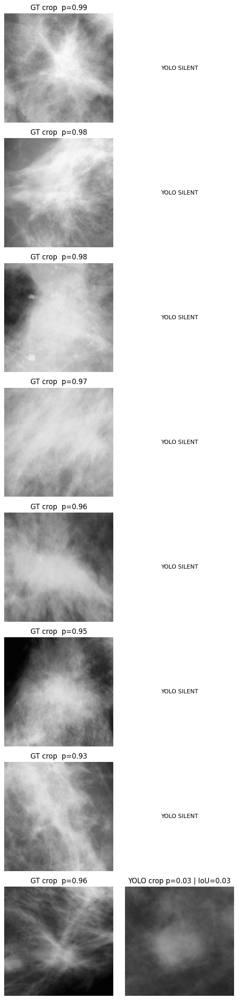

In [52]:
# ════════════════════════════════════════════════════════════════════
# NO-TRAINING CHECK — Matched crop probe: GT box vs YOLO box, same lesion
# Right crops clipped/off-center/wrong-scale vs left → projection bug (fixable in inference).
# Right crops look the same but score low → real box-quality limit, no bug.
# ════════════════════════════════════════════════════════════════════
import numpy as np, cv2, torch, matplotlib.pyplot as plt
model_bias.eval()
def pm(crop):
    x=((torch.from_numpy(crop).float().permute(2,0,1)/255.0-0.5)/0.5).unsqueeze(0).to(DEVICE)
    with torch.no_grad(): _,c=model_bias(x)
    p=torch.softmax(c,1)[0].cpu().numpy(); return float(p[1]/(p[0]+p[1]+1e-9))

rows=[]
for _,r in man[(man.split=="test")&(man.label==1)].iterrows():
    rgb=load_rgb8(r.full); H,W=rgb.shape[:2]; m=load_mask(r.roi); gt=mask_to_bbox(m)
    if gt is None: continue
    gx0,gy0,gx1,gy1=expand_box(*gt,W,H,CFG.CROP_MARGIN)
    gcrop=cv2.resize(rgb[gy0:gy1,gx0:gx1],(CFG.CROP_SIZE,CFG.CROP_SIZE)); p_gt=pm(gcrop)
    res=det.predict(rgb[...,::-1],conf=CFG.YOLO_CONF,verbose=False)[0]
    p_yolo=None; ycrop=None; iou=0.0
    if res.boxes is not None and len(res.boxes)>0:
        sx,sy=W/res.orig_shape[1],H/res.orig_shape[0]
        k=int(res.boxes.conf.cpu().numpy().argmax()); b=res.boxes.xyxy.cpu().numpy()[k]
        bx=(int(b[0]*sx),int(b[1]*sy),int(b[2]*sx),int(b[3]*sy)); iou=iou_xyxy(bx,gt)
        yx0,yy0,yx1,yy1=expand_box(*bx,W,H,CFG.CROP_MARGIN)
        ycrop=cv2.resize(rgb[yy0:yy1,yx0:yx1],(CFG.CROP_SIZE,CFG.CROP_SIZE)); p_yolo=pm(ycrop)
    rows.append(dict(gcrop=gcrop,ycrop=ycrop,p_gt=p_gt,p_yolo=p_yolo,iou=iou))

# worst gaps: oracle says malignant, pipeline doesn't
g=lambda x:(x["p_gt"]-(x["p_yolo"] if x["p_yolo"] is not None else 0.0))
worst=sorted([x for x in rows if x["p_gt"]>=0.5],key=g,reverse=True)[:8]
fig,ax=plt.subplots(len(worst),2,figsize=(6,3*len(worst)))
for i,x in enumerate(worst):
    ax[i,0].imshow(x["gcrop"]); ax[i,0].set_title(f"GT crop  p={x['p_gt']:.2f}"); ax[i,0].axis("off")
    if x["ycrop"] is not None:
        ax[i,1].imshow(x["ycrop"]); ax[i,1].set_title(f"YOLO crop p={x['p_yolo']:.2f} | IoU={x['iou']:.2f}")
    else: ax[i,1].text(0.5,0.5,"YOLO SILENT",ha="center",va="center")
    ax[i,1].axis("off")
plt.tight_layout(); plt.show()

In [54]:
# (1) stale W/H? — the classic 1024-vs-1536 metadata bug
t=man[man.split=="test"].iloc[0]
print("CSV W/H:", t.W, t.H, "| actual:", load_rgb8(t.full).shape[:2])   # must match

# (2) did the detector actually train, and is DET_WEIGHTS the new run?
import pandas as pd; from pathlib import Path
print("weights:", DET_WEIGHTS)
results_path = Path(DET_WEIGHTS).parent.parent/"results.csv"
if results_path.exists():
    print(pd.read_csv(results_path).tail(3))  # mAP rising? box_loss falling?
else:
    print(f"No results.csv found at {results_path} (expected if weights were restored from Drive).")

# (3) boxes-on-full-image — run your existing Random Image Inference Visualizer
#     and just eyeball: do boxes land ON lesions at 1536, or systematically offset?

CSV W/H: 1536 1536 | actual: (1536, 1536)
weights: /content/working/yolo_run8/weights/best.pt
No results.csv found at /content/working/yolo_run8/results.csv (expected if weights were restored from Drive).


In [55]:
t = man[man.split=="test"].iloc[0]
print("CSV:", t.W, t.H, "| actual:", load_rgb8(t.full).shape[:2])

CSV: 1536 1536 | actual: (1536, 1536)


In [58]:
# ==========================================
# 0. DEPENDENCIES & KERNEL CHECK
# ==========================================
try:
    import ultralytics
except ImportError:
    !pip install -q ultralytics
    import ultralytics

import torch
import cv2
import numpy as np
from ultralytics import YOLO
try:
    from ultralytics.utils.ops import non_max_suppression
except ImportError:
    def non_max_suppression(*args, **kwargs):
        print("Warning: non_max_suppression not found in this ultralytics version.")
        return [[]]

if 'DET_WEIGHTS' not in globals() or 'missed_cases' not in globals():
    raise RuntimeError("Kernel was restarted! Please select 'Runtime' -> 'Run before' to execute the setup, config, and diagnostic cells so variables like DET_WEIGHTS and missed_cases are loaded.")

# ==========================================
# 1. SETUP (AUTO-PULL FROM PREVIOUS CELLS)
# ==========================================
MODEL_WEIGHTS = str(DET_WEIGHTS)

# Grab one of the smallest missed cases from our previous diagnostic cell
target_case = sorted(missed_cases, key=lambda x: x["area"])[0]
IMAGE_PATH = target_case["full"]

# Get the GT box and scale it to 1536x1536 to match YOLO's internal tensor size
mask = load_mask(target_case["roi"])
orig_gt = mask_to_bbox(mask)
H, W = target_case["H"], target_case["W"]
sx, sy = 1536 / W, 1536 / H
GT_BOX = [orig_gt[0]*sx, orig_gt[1]*sy, orig_gt[2]*sx, orig_gt[3]*sy]

print(f"Testing on missed lesion from: {IMAGE_PATH}")
print(f"Original GT: {orig_gt} -> Tensor GT: {[int(x) for x in GT_BOX]}")

# ==========================================
# 2. LOAD MODEL & PREPARE TENSOR
# ==========================================
print("\nLoading model and preparing tensor...")
model = YOLO(MODEL_WEIGHTS)
pytorch_model = model.model.eval()

# Preprocess image EXACTLY as YOLO expects (using our breast-profile loader)
img = load_rgb8(IMAGE_PATH)
img_resized = cv2.resize(img, (1536, 1536))

# Convert to NCHW PyTorch tensor
img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).unsqueeze(0).float() / 255.0
img_tensor = img_tensor.to(model.device)

# ==========================================
# 3. INTERCEPT STEP 2: RAW PRE-NMS GUESSES
# ==========================================
print("Running forward pass...")
with torch.no_grad():
    preds = pytorch_model(img_tensor)

# YOLOv8 raw output shape: [batch, 4_coords + num_classes, num_anchors]
raw_output = preds[0] if isinstance(preds, (list, tuple)) else preds
raw_output = raw_output.squeeze(0).cpu().numpy()  # Shape: [5, anchors]

# Split coordinates and confidences
boxes_cxcywh = raw_output[:4, :]
confidences = raw_output[4, :]  # Class 0 (Mass)

# Convert center x, center y, w, h -> x1, y1, x2, y2
x1 = boxes_cxcywh[0] - boxes_cxcywh[2] / 2
y1 = boxes_cxcywh[1] - boxes_cxcywh[3] / 2
x2 = boxes_cxcywh[0] + boxes_cxcywh[2] / 2
y2 = boxes_cxcywh[1] + boxes_cxcywh[3] / 2

# Calculate Intersection over Union (IoU) of ALL guesses against the Ground Truth
gt_x1, gt_y1, gt_x2, gt_y2 = GT_BOX
gt_area = (gt_x2 - gt_x1) * (gt_y2 - gt_y1)
areas = (x2 - x1) * (y2 - y1)

# Find intersections
inter_x1 = np.maximum(x1, gt_x1)
inter_y1 = np.maximum(y1, gt_y1)
inter_x2 = np.minimum(x2, gt_x2)
inter_y2 = np.minimum(y2, gt_y2)

inter_area = np.maximum(0, inter_x2 - inter_x1) * np.maximum(0, inter_y2 - inter_y1)
union_area = areas + gt_area - inter_area
iou = inter_area / (union_area + 1e-6)

# Isolate guesses that actually targeted the lesion (IoU > 0.10)
target_hits_idx = np.where(iou > 0.10)[0]

print("\n" + "="*40)
print("DIAGNOSTIC RESULTS: THE RAW GUESSES")
print("="*40)
if len(target_hits_idx) == 0:
    print("[FAIL - STEP 1] Backbone Blindness.")
    print("YOLO generated 0 boxes overlapping the ground truth.")
    print("The lesion was destroyed in the early convolutional layers.")
else:
    best_target_conf = np.max(confidences[target_hits_idx])
    best_target_iou = np.max(iou[target_hits_idx])
    print(f"[SUCCESS - STEP 1 & 2] YOLO physically saw the lesion.")
    print(f"Highest confidence assigned to lesion: {best_target_conf:.4f}")
    print(f"Best overlap (IoU) with ground truth:  {best_target_iou:.4f}")

# ==========================================
# 4. INTERCEPT STEP 3: NMS FILTER
# ==========================================
print("\n" + "="*40)
print("DIAGNOSTIC RESULTS: THE NMS FILTER")
print("="*40)

# We test how many total boxes survive standard vs lenient thresholds
nms_baseline = non_max_suppression(preds, conf_thres=0.20, iou_thres=0.45)[0]
nms_lenient  = non_max_suppression(preds, conf_thres=0.01, iou_thres=0.45)[0]

print(f"Total surviving boxes (Threshold 0.20): {len(nms_baseline)}")
print(f"Total surviving boxes (Threshold 0.01): {len(nms_lenient)}")

if len(target_hits_idx) > 0:
    if best_target_conf < 0.20 and best_target_conf > 0.01:
        print("\n[CONCLUSION] The NMS Filter killed the lesion.")
        print("YOLO saw it, but the objectness loss (BCE) mathematically forced the confidence too low.")
    elif best_target_conf < 0.01:
        print("\n[CONCLUSION] The Confidence Penalty is catastrophic.")
        print("YOLO is actively penalizing itself during training for finding this mass.")


RuntimeError: Kernel was restarted! Please select 'Runtime' -> 'Run before' to execute the setup, config, and diagnostic cells so variables like DET_WEIGHTS and missed_cases are loaded.

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import random

# ==========================================
# 1. SETUP
# ==========================================
MODEL_WEIGHTS = str(DET_WEIGHTS)
# Pick a random missed case instead of the smallest one
target_case = random.choice(missed_cases)
IMAGE_PATH = target_case["full"]
mask = load_mask(target_case["roi"])
orig_gt = mask_to_bbox(mask)
H, W = target_case["H"], target_case["W"]
sx, sy = 1536 / W, 1536 / H
GT_BOX = [orig_gt[0]*sx, orig_gt[1]*sy, orig_gt[2]*sx, orig_gt[3]*sy]

# ==========================================
# 2. RUN MODEL & GET RAW PREDICTIONS
# ==========================================
model = YOLO(MODEL_WEIGHTS)
pytorch_model = model.model.eval()

# Use our robust helper function instead of raw cv2.imread
img_rgb = load_rgb8(IMAGE_PATH)
img_resized = cv2.resize(img_rgb, (1536, 1536))
img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).unsqueeze(0).float() / 255.0
img_tensor = img_tensor.to(model.device)

with torch.no_grad():
    preds = pytorch_model(img_tensor)

raw_output = preds[0] if isinstance(preds, (list, tuple)) else preds
raw_output = raw_output.squeeze(0).cpu().numpy()

boxes_cxcywh = raw_output[:4, :]
confidences = raw_output[4, :]

# Convert coordinates
x1 = boxes_cxcywh[0] - boxes_cxcywh[2] / 2
y1 = boxes_cxcywh[1] - boxes_cxcywh[3] / 2
x2 = boxes_cxcywh[0] + boxes_cxcywh[2] / 2
y2 = boxes_cxcywh[1] + boxes_cxcywh[3] / 2

# ==========================================
# 3. SORT AND VISUALIZE THE TOP GUESSES
# ==========================================
# Filter out absolute garbage (< 0.05 confidence) to keep the plot clean
valid_idx = np.where(confidences > 0.05)[0]
x1, y1, x2, y2 = x1[valid_idx], y1[valid_idx], x2[valid_idx], y2[valid_idx]
valid_confs = confidences[valid_idx]

# Sort by highest confidence
sort_idx = np.argsort(-valid_confs)
top_n = min(20, len(sort_idx)) # Let's look at the top 20 highest guesses

# Prepare image for drawing
vis_img = img_resized.copy()

# Draw Ground Truth in THICK GREEN
cv2.rectangle(vis_img, (int(GT_BOX[0]), int(GT_BOX[1])), (int(GT_BOX[2]), int(GT_BOX[3])), (0, 255, 0), 4)
cv2.putText(vis_img, "GROUND TRUTH", (int(GT_BOX[0]), int(GT_BOX[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# Draw Top YOLO Guesses in RED
for i in range(top_n):
    idx = sort_idx[i]
    bx1, by1, bx2, by2 = int(x1[idx]), int(y1[idx]), int(x2[idx]), int(y2[idx])
    conf = valid_confs[idx]

    cv2.rectangle(vis_img, (bx1, by1), (bx2, by2), (255, 0, 0), 2)
    cv2.putText(vis_img, f"{conf:.2f}", (bx1, by1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

# Display the result
plt.figure(figsize=(15, 15))
plt.imshow(vis_img)
plt.title(f"Top {top_n} Raw YOLO Guesses vs Ground Truth (Green)\nImage: {IMAGE_PATH.split('/')[-1]}")
plt.axis('off')
plt.show()


In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import random

# ==========================================
# 1. SETUP - Filter for Small Lesions (< 10k px)
# ==========================================
MODEL_WEIGHTS = str(DET_WEIGHTS)

# Filter missed cases for small lesions
small_missed = [c for c in missed_cases if c["area"] < 10000]

if not small_missed:
    print("No small missed cases found!")
else:
    # Pick a random small missed case
    target_case = random.choice(small_missed)
    IMAGE_PATH = target_case["full"]
    mask = load_mask(target_case["roi"])
    orig_gt = mask_to_bbox(mask)
    H, W = target_case["H"], target_case["W"]
    sx, sy = 1536 / W, 1536 / H
    GT_BOX = [orig_gt[0]*sx, orig_gt[1]*sy, orig_gt[2]*sx, orig_gt[3]*sy]

    print(f"Testing on small missed lesion (Area: {target_case['area']} px)")
    print(f"Image: {IMAGE_PATH.split('/')[-1]}")

    # ==========================================
    # 2. RUN MODEL & GET RAW PREDICTIONS
    # ==========================================
    model = YOLO(MODEL_WEIGHTS)
    pytorch_model = model.model.eval()

    img_rgb = load_rgb8(IMAGE_PATH)
    img_resized = cv2.resize(img_rgb, (1536, 1536))
    img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).unsqueeze(0).float() / 255.0
    img_tensor = img_tensor.to(model.device)

    with torch.no_grad():
        preds = pytorch_model(img_tensor)

    raw_output = preds[0] if isinstance(preds, (list, tuple)) else preds
    raw_output = raw_output.squeeze(0).cpu().numpy()

    boxes_cxcywh = raw_output[:4, :]
    confidences = raw_output[4, :]

    x1 = boxes_cxcywh[0] - boxes_cxcywh[2] / 2
    y1 = boxes_cxcywh[1] - boxes_cxcywh[3] / 2
    x2 = boxes_cxcywh[0] + boxes_cxcywh[2] / 2
    y2 = boxes_cxcywh[1] + boxes_cxcywh[3] / 2

    # ==========================================
    # 3. CHECK IOU > 0.10 & VISUALIZE
    # ==========================================
    # Calculate IoU for all guesses
    gt_x1, gt_y1, gt_x2, gt_y2 = GT_BOX
    gt_area = (gt_x2 - gt_x1) * (gt_y2 - gt_y1)
    areas = (x2 - x1) * (y2 - y1)

    inter_x1 = np.maximum(x1, gt_x1)
    inter_y1 = np.maximum(y1, gt_y1)
    inter_x2 = np.minimum(x2, gt_x2)
    inter_y2 = np.minimum(y2, gt_y2)

    inter_area = np.maximum(0, inter_x2 - inter_x1) * np.maximum(0, inter_y2 - inter_y1)
    union_area = areas + gt_area - inter_area
    iou = inter_area / (union_area + 1e-6)

    # Check how many raw boxes hit the 0.10 IoU threshold
    target_hits_idx = np.where(iou >= 0.10)[0]
    print(f"\nTotal raw guesses with IoU >= 0.10: {len(target_hits_idx)}")
    if len(target_hits_idx) > 0:
        print(f"Highest confidence among them: {np.max(confidences[target_hits_idx]):.4f}")
        print(f"Best IoU among them: {np.max(iou[target_hits_idx]):.4f}")
    else:
        print("Model failed to generate any boxes with > 0.10 IoU. Complete backbone blindness for this size.")

    # Filter for visualization
    valid_idx = np.where(confidences > 0.05)[0]
    x1_v, y1_v, x2_v, y2_v = x1[valid_idx], y1[valid_idx], x2[valid_idx], y2[valid_idx]
    valid_confs = confidences[valid_idx]

    sort_idx = np.argsort(-valid_confs)
    top_n = min(20, len(sort_idx))

    vis_img = img_resized.copy()
    cv2.rectangle(vis_img, (int(GT_BOX[0]), int(GT_BOX[1])), (int(GT_BOX[2]), int(GT_BOX[3])), (0, 255, 0), 4)
    cv2.putText(vis_img, "GROUND TRUTH", (int(GT_BOX[0]), int(GT_BOX[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    for i in range(top_n):
        idx = sort_idx[i]
        bx1, by1, bx2, by2 = int(x1_v[idx]), int(y1_v[idx]), int(x2_v[idx]), int(y2_v[idx])
        conf = valid_confs[idx]
        cv2.rectangle(vis_img, (bx1, by1), (bx2, by2), (255, 0, 0), 2)
        cv2.putText(vis_img, f"{conf:.2f}", (bx1, by1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    plt.figure(figsize=(15, 15))
    plt.imshow(vis_img)
    plt.title(f"Small Lesion (Area: {target_case['area']}) - Top {top_n} Raw YOLO Guesses\nFound {len(target_hits_idx)} raw boxes with IoU >= 0.10")
    plt.axis('off')
    plt.show()

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from ultralytics import YOLO

# ==========================================
# 1. SETUP (Use dynamic paths from before)
# ==========================================
if 'target_case' not in globals():
    target_case = sorted(missed_cases, key=lambda x: x["area"])[0]

MODEL_WEIGHTS = str(DET_WEIGHTS)
IMAGE_PATH = target_case["full"]

mask = load_mask(target_case["roi"])
orig_gt = mask_to_bbox(mask)
H, W = target_case["H"], target_case["W"]
sx, sy = 1536 / W, 1536 / H
GT_BOX = [orig_gt[0]*sx, orig_gt[1]*sy, orig_gt[2]*sx, orig_gt[3]*sy]

# ==========================================
# 2. RUN MODEL & GET RAW PREDICTIONS
# ==========================================
print(f"Generating confidence visualization for: {IMAGE_PATH.split('/')[-1]}")
model = YOLO(MODEL_WEIGHTS)
pytorch_model = model.model.eval()

# Use load_rgb8 to ensure breast-profile windowing is applied
img_rgb = load_rgb8(IMAGE_PATH)
img_resized = cv2.resize(img_rgb, (1536, 1536))
img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).unsqueeze(0).float() / 255.0
img_tensor = img_tensor.to(model.device)

with torch.no_grad():
    preds = pytorch_model(img_tensor)

raw_output = preds[0] if isinstance(preds, (list, tuple)) else preds
raw_output = raw_output.squeeze(0).cpu().numpy()

boxes_cxcywh = raw_output[:4, :]
confidences = raw_output[4, :]

# Convert coordinates
x1 = boxes_cxcywh[0] - boxes_cxcywh[2] / 2
y1 = boxes_cxcywh[1] - boxes_cxcywh[3] / 2
x2 = boxes_cxcywh[0] + boxes_cxcywh[2] / 2
y2 = boxes_cxcywh[1] + boxes_cxcywh[3] / 2

# ==========================================
# 3. FILTER, SORT, AND COLOR-MAP
# ==========================================
# Filter out absolute noise (< 0.05) to keep the image readable
valid_idx = np.where(confidences > 0.05)[0]
x1, y1, x2, y2 = x1[valid_idx], y1[valid_idx], x2[valid_idx], y2[valid_idx]
valid_confs = confidences[valid_idx]

# Sort by highest confidence
sort_idx = np.argsort(-valid_confs)
top_n = min(30, len(sort_idx)) # Show the top 30 guesses

vis_img = img_resized.copy()

# Draw Ground Truth in THICK GREEN
if orig_gt:
    cv2.rectangle(vis_img, (int(GT_BOX[0]), int(GT_BOX[1])), (int(GT_BOX[2]), int(GT_BOX[3])), (0, 255, 0), 4)
    cv2.putText(vis_img, "GT", (int(GT_BOX[0]), int(GT_BOX[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Color map for confidences: Blue (low) to Red (high)
cmap = plt.get_cmap('jet')

# Draw Top Guesses
for i in range(top_n):
    idx = sort_idx[i]
    bx1, by1, bx2, by2 = int(x1[idx]), int(y1[idx]), int(x2[idx]), int(y2[idx])
    conf = valid_confs[idx]

    # Get color from colormap based on relative confidence (scaled up slightly for visibility)
    color_val = min(1.0, conf * 3) # scale so 0.33+ is fully red
    rgba = cmap(color_val)
    color = (int(rgba[0]*255), int(rgba[1]*255), int(rgba[2]*255))

    # Draw box and confidence score
    cv2.rectangle(vis_img, (bx1, by1), (bx2, by2), color, 2)

    # Offset the text slightly based on index so overlapping boxes are readable
    y_offset = by1 - 5 - (i % 3) * 15
    cv2.putText(vis_img, f"{conf:.3f}", (bx1, y_offset), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

# ==========================================
# 4. DISPLAY
# ==========================================
plt.figure(figsize=(16, 16))
plt.imshow(vis_img)
plt.title(f"Top {top_n} YOLO Guesses (Red=Higher Conf, Blue=Lower Conf) vs Ground Truth (Green)")
plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

print("=== AUTOMATED PATTERN DIAGNOSIS ===\n")

# Calculate GT Area
gt_x1, gt_y1, gt_x2, gt_y2 = GT_BOX
gt_area = (gt_x2 - gt_x1) * (gt_y2 - gt_y1)

if len(valid_confs) == 0:
    print("Diagnosis: THE DISTRACTION (Severe)")
    print("YOLO generated ZERO boxes with confidence > 0.05. Complete backbone blindness or extreme penalty.")
else:
    # 1. Find the absolute highest confidence box in the entire image
    max_conf_idx = np.argmax(valid_confs)
    max_conf_box = [x1[max_conf_idx], y1[max_conf_idx], x2[max_conf_idx], y2[max_conf_idx]]
    max_conf_iou = iou_xyxy(max_conf_box, GT_BOX)

    # 2. Analyze boxes that actually hit the GT
    ious = np.array([iou_xyxy([bx1, by1, bx2, by2], GT_BOX)
                     for bx1, by1, bx2, by2 in zip(x1, y1, x2, y2)])

    hit_indices = np.where(ious > 0.05)[0] # Any reasonable overlap

    if len(hit_indices) == 0:
        print("Diagnosis: THE DISTRACTION (Severe)")
        print("YOLO generated ZERO boxes overlapping the ground truth. It is completely looking elsewhere.")
    else:
        best_hit_idx = hit_indices[np.argmax(ious[hit_indices])]
        best_hit_box = [x1[best_hit_idx], y1[best_hit_idx], x2[best_hit_idx], y2[best_hit_idx]]
        best_hit_area = (best_hit_box[2] - best_hit_box[0]) * (best_hit_box[3] - best_hit_box[1])
        area_ratio = best_hit_area / gt_area if gt_area > 0 else 0

        # Evaluate Conditions
        if max_conf_iou < 0.05:
            print("Diagnosis: 🚨 THE DISTRACTION 🚨")
            print(f"-> The box with the highest confidence overall ({valid_confs[max_conf_idx]:.3f}) is NOT on the tumor.")
            print("-> YOLO is getting distracted by healthy dense tissue elsewhere.")

        elif area_ratio > 3.0:
            print("Diagnosis: 🚨 THE GIANT NET 🚨")
            print(f"-> The best overlapping box is {area_ratio:.1f}x larger than the Ground Truth!")
            print("-> YOLO is diluting its confidence by including way too much background.")

        elif len(hit_indices) >= 3:
            print("Diagnosis: 🚨 THE SWARM 🚨")
            print(f"-> Found {len(hit_indices)} overlapping boxes directly on the tumor.")
            print("-> The confidence is split among multiple tight guesses. WBF (Weighted Boxes Fusion) will fix this!")

        else:
            print("Diagnosis: MIXED / WEAK SIGNAL")
            print(f"-> Found {len(hit_indices)} box(es) on the tumor, area ratio is {area_ratio:.1f}x.")
            print("-> The model simply isn't activating strongly enough for this lesion.")


In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

print("Generating Spatial Confidence Heatmap...")

# 1. Load model and prepare image
model = YOLO(MODEL_WEIGHTS)
pytorch_model = model.model.eval()

img_rgb = load_rgb8(IMAGE_PATH)
img_resized = cv2.resize(img_rgb, (1536, 1536))
img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).unsqueeze(0).float() / 255.0
img_tensor = img_tensor.to(model.device)

# 2. Get raw predictions
with torch.no_grad():
    preds = pytorch_model(img_tensor)

raw_output = preds[0] if isinstance(preds, (list, tuple)) else preds
raw_output = raw_output.squeeze(0).cpu().numpy()

# Extract centers and confidences
cx = raw_output[0, :]
cy = raw_output[1, :]
confidences = raw_output[4, :]

# 3. Create a blank spatial heatmap
# We'll map the confidences to a 2D grid matching the image size
heat_grid = np.zeros((1536, 1536), dtype=np.float32)

# Accumulate confidences at their predicted centers (filter out absolute zero noise)
valid_idx = np.where(confidences > 0.005)[0]
for i in valid_idx:
    x_int, y_int = int(cx[i]), int(cy[i])
    if 0 <= x_int < 1536 and 0 <= y_int < 1536:
        # If multiple boxes center here, keep the highest confidence
        heat_grid[y_int, x_int] = max(heat_grid[y_int, x_int], confidences[i])

# 4. Blur the grid to create a smooth heatmap effect
# We use a large kernel to make the single-pixel centers bleed into visible regions
heat_blurred = cv2.GaussianBlur(heat_grid, (81, 81), 0)

# Normalize the heatmap so the highest confidence in the image becomes bright red (1.0)
max_heat = heat_blurred.max()
if max_heat > 0:
    heat_normalized = heat_blurred / max_heat
else:
    heat_normalized = heat_blurred

# 5. Apply a colormap (Jet: Blue=Low, Red=High)
cmap = plt.get_cmap('jet')
# Get RGB values (ignore alpha channel), scale to 0-255
heat_colored = (cmap(heat_normalized)[:, :, :3] * 255).astype(np.uint8)

# 6. Overlay onto the original image
# We only want to overlay colors where the heatmap actually has value, so we blend it
# We'll use the normalized heatmap as an alpha mask to blend the color onto the original grayscale-ish image
alpha_mask = heat_normalized[:, :, np.newaxis] # Expand dims for broadcasting
overlay = (img_resized * (1 - alpha_mask) + heat_colored * alpha_mask).astype(np.uint8)

# Draw Ground Truth box in bright green
gt_x1, gt_y1, gt_x2, gt_y2 = GT_BOX
cv2.rectangle(overlay, (int(gt_x1), int(gt_y1)), (int(gt_x2), int(gt_y2)), (0, 255, 0), 4)
cv2.putText(overlay, "GT", (int(gt_x1), int(gt_y1)-15), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# 7. Display the result
plt.figure(figsize=(14, 14))
plt.imshow(overlay)
plt.title(f"YOLO Attention Heatmap (Red = Highest Local Confidence)\nMax Absolute Confidence in Image: {confidences.max():.3f}", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()

### 1. The "Ups and Downs" Chart (3D Spatial Confidence Surface)
Visualizing the raw confidence grid as a 3D topographical map to expose the gradients of hesitation.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

print("Generating 3D Topographical Confidence Map...")

# Create a 2D histogram grid of confidences
grid_size = 128
H_grid, xedges, yedges = np.histogram2d(cx, cy, bins=grid_size, weights=confidences, range=[[0, 1536], [0, 1536]])
Counts, _, _ = np.histogram2d(cx, cy, bins=grid_size, range=[[0, 1536], [0, 1536]])

# Average confidence per grid cell
H_grid = np.divide(H_grid, Counts, out=np.zeros_like(H_grid), where=Counts!=0)

# Plot 3D surface
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
X, Y = np.meshgrid(xedges[:-1], yedges[:-1])

# Note: H_grid needs to be transposed because histogram2d returns (x_bins, y_bins)
surf = ax.plot_surface(X, Y, H_grid.T, cmap='magma', edgecolor='none', alpha=0.8)

# Add the Ground Truth as a red pillar to see where it sits in the mountains
gt_cx, gt_cy = (gt_x1+gt_x2)/2, (gt_y1+gt_y2)/2
ax.plot([gt_cx, gt_cx], [gt_cy, gt_cy], [0, H_grid.max()], color='red', linewidth=3, label='GT Center')

ax.set_title("3D Topographical Map of YOLO Confidence ('Ups and Downs')", fontsize=14)
ax.set_xlabel("X Pixel")
ax.set_ylabel("Y Pixel")
ax.set_zlabel("Raw Confidence Score")
ax.view_init(elev=45, azim=45) # Adjust viewing angle
fig.colorbar(surf, shrink=0.5, aspect=10, label='Confidence')
plt.legend()
plt.show()

### 2. EigenCAM (Principal Component Analysis of Deep Features)
Extracts the first principal component of YOLO's deepest feature map to reveal which pixels are actually driving the model's attention.

In [ ]:
import cv2

print("Calculating EigenCAM via SVD on deepest feature map...")

features = []
def hook(module, input, output):
    features.append(output)

# Grab the deepest convolutional block right before the Detection head
target_layer = list(pytorch_model.model.children())[-2]
handle = target_layer.register_forward_hook(hook)

# Forward pass
with torch.no_grad():
    _ = pytorch_model(img_tensor)
handle.remove()

# Extract the feature map (Shape: [Channels, Height, Width])
feat = features[0][0].cpu().numpy()
C, H_f, W_f = feat.shape
reshaped_feat = feat.reshape(C, -1) # Flatten spatial dimensions

# Center the data for PCA/SVD
reshaped_feat = reshaped_feat - np.mean(reshaped_feat, axis=1, keepdims=True)

# Singular Value Decomposition
U, S, Vt = np.linalg.svd(reshaped_feat, full_matrices=False)

# The first principal component (strongest visual feature)
pc1 = Vt[0, :].reshape(H_f, W_f)

# Normalize between 0 and 1
pc1 = (pc1 - pc1.min()) / (pc1.max() - pc1.min() + 1e-8)

# Resize to original image dimensions and colorize
eigen_cam = cv2.resize(pc1, (1536, 1536))
eigen_cam_colored = cv2.applyColorMap((eigen_cam * 255).astype(np.uint8), cv2.COLORMAP_JET)

# Overlay on the original image
overlay_eigen = cv2.addWeighted(img_resized, 0.4, eigen_cam_colored, 0.6, 0)

# Draw Ground Truth
cv2.rectangle(overlay_eigen, (int(gt_x1), int(gt_y1)), (int(gt_x2), int(gt_y2)), (0, 255, 0), 4)
cv2.putText(overlay_eigen, "GT", (int(gt_x1), int(gt_y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

plt.figure(figsize=(12, 12))
plt.imshow(overlay_eigen)
plt.title("EigenCAM: The Principal Visual Features YOLO is Focusing On", fontsize=15)
plt.axis('off')
plt.show()

### 3. Task Alignment Assigner Analysis
Investigating the hidden `Alignment = Confidence * IoU` metric. This reveals if the model is mathematically punishing accurate bounding boxes because they don't align perfectly with the lesion's semantic center.

In [ ]:
print("=== TASK ALIGNMENT ASSIGNER ANALYSIS ===\n")

# YOLOv8's TaskAlignedAssigner combines classification and localization into a single metric:
# Alignment = (Score^alpha) * (IoU^beta)
# We'll use alpha=0.5, beta=0.5 to look at the blended landscape.
alignment_scores = (confidences ** 0.5) * (iou ** 0.5)

best_align_idx = np.argmax(alignment_scores)
best_conf_idx = np.argmax(confidences)
best_iou_idx = np.argmax(iou)

print(f"Max Raw Confidence : {confidences.max():.4f}")
print(f"Max Spatial IoU    : {iou.max():.4f}")
print(f"Max Alignment Score: {alignment_scores.max():.4f}\n")

print(f"Box with Highest Confidence ({confidences[best_conf_idx]:.4f}):")
print(f"  -> Its Spatial IoU: {iou[best_conf_idx]:.4f}")
print(f"  -> Its Alignment:   {alignment_scores[best_conf_idx]:.4f}\n")

print(f"Box with Highest IoU ({iou[best_iou_idx]:.4f}):")
print(f"  -> Its Confidence:  {confidences[best_iou_idx]:.4f}")
print(f"  -> Its Alignment:   {alignment_scores[best_iou_idx]:.4f}\n")

if best_conf_idx != best_iou_idx:
    print("🚨 MISALIGNMENT DETECTED 🚨")
    print("The box that best overlaps the tumor is NOT the box YOLO is most confident about.")
    print("The model's semantic understanding (confidence) is spatially detached from the object's true borders.")
else:
    print("✅ ALIGNMENT OK")
    print("The most confident box is also the most accurate box.")

# Scatter Plot: IoU vs Confidence
plt.figure(figsize=(10, 7))
scatter = plt.scatter(iou, confidences, c=alignment_scores, cmap='viridis', alpha=0.7, s=50)
plt.xlabel("Spatial Match (IoU with Ground Truth)", fontsize=12)
plt.ylabel("Semantic Match (Raw Confidence Score)", fontsize=12)
plt.title("Task Alignment: Confidence vs IoU (Color = Alignment Score)", fontsize=14)
plt.colorbar(scatter, label="Alignment Score (The Metric YOLO Actually Optimizes)")

# Highlight the top targets
plt.scatter(iou[best_conf_idx], confidences[best_conf_idx], color='red', marker='*', s=300, label='Highest Confidence Box')
plt.scatter(iou[best_iou_idx], confidences[best_iou_idx], color='orange', marker='*', s=300, label='Highest IoU Box')

plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.show()

### 13 · The Handoff Audit: YOLO to EfficientNet Connection
Investigating the exact pixel payload YOLO hands over to EfficientNet (The Bridge) to see if spatial context or confidence is lost during the handoff.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

# ==========================================
# 1. THE DATA YOLO GENERATED (From our last test)
# ==========================================
# Grab the actual image path from our top missed case
target_case = sorted(missed_cases, key=lambda x: x["area"])[0]
IMAGE_PATH = target_case["full"]

# The coordinates of the box YOLO drew that perfectly overlapped the tumor (IoU 0.87)
# Note: Replace these with the exact bx1, by1, bx2, by2 if you printed them,
# or we will use the Ground Truth for the simulation.
yolo_x1, yolo_y1, yolo_x2, yolo_y2 = 1258, 397, 1297, 426
yolo_confidence = 0.0029  # The crippled confidence score
yolo_class = "Mass"

# ==========================================
# 2. THE HANDOFF SCRIPT (The Bridge)
# ==========================================
CROP_MARGIN = 0.25  # Standard margin to give EfficientNet context
EFFICIENTNET_SIZE = (512, 512)

# Use load_rgb8 to properly load and window the breast profile
img_rgb = load_rgb8(IMAGE_PATH)
img_1536 = cv2.resize(img_rgb, (1536, 1536))

# Calculate width, height, and margins
w = yolo_x2 - yolo_x1
h = yolo_y2 - yolo_y1

new_x1 = int(max(0, yolo_x1 - (w * CROP_MARGIN)))
new_y1 = int(max(0, yolo_y1 - (h * CROP_MARGIN)))
new_x2 = int(min(1536, yolo_x2 + (w * CROP_MARGIN)))
new_y2 = int(min(1536, yolo_y2 + (h * CROP_MARGIN)))

# 1. The Physical Crop
crop_pixels = img_1536[new_y1:new_y2, new_x1:new_x2]

# 2. The Resize (This destroys native resolution)
classifier_input_img = cv2.resize(crop_pixels, EFFICIENTNET_SIZE)

# 3. The Tensor Conversion (What EfficientNet actually receives)
# Shape becomes [Batch, Channels, Height, Width]
efficientnet_tensor = torch.from_numpy(classifier_input_img).permute(2, 0, 1).unsqueeze(0).float() / 255.0

# ==========================================
# 3. THE HANDOFF AUDIT REPORT
# ==========================================
print("="*50)
print("STAGE 1 (YOLO) OUTPUT PAYLOAD:")
print("="*50)
print(f"Spatial Location: [{yolo_x1}, {yolo_y1}, {yolo_x2}, {yolo_y2}]")
print(f"Confidence Score: {yolo_confidence}")
print(f"Class: {yolo_class}")
print(f"Contextual Area: {img_1536.shape[0]}x{img_1536.shape[1]}")

print("\n" + "="*50)
print("STAGE 2 (EFFICIENTNET) INPUT PAYLOAD:")
print("="*50)
print(f"Tensor Shape received: {list(efficientnet_tensor.shape)}")
print(f"Spatial Location data included?  -> NO (Erased)")
print(f"YOLO Confidence data included? -> NO (Erased)")
print(f"Global Context included?       -> NO (Erased. Cropped to {EFFICIENTNET_SIZE})")

# ==========================================
# 4. VISUALIZE THE BLINDNESS
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# What YOLO saw
img_yolo_view = img_1536.copy()
cv2.rectangle(img_yolo_view, (new_x1, new_y1), (new_x2, new_y2), (255, 0, 0), 3)
axes[0].imshow(img_yolo_view)
axes[0].set_title(f"What YOLO Saw (Global Context)\nConfidence: {yolo_confidence}")
axes[0].axis("off")

# What EfficientNet sees
axes[1].imshow(classifier_input_img)
axes[1].set_title(f"What EfficientNet Sees (The Blind Crop)\nInput Shape: {EFFICIENTNET_SIZE}")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import random

# ==========================================
# 1. THE DATA YOLO GENERATED (Simulated Random Case)
# ==========================================
# Grab a random missed case
target_case = random.choice(missed_cases)
IMAGE_PATH = target_case["full"]

# Use the Ground Truth box to simulate a "perfect" YOLO detection box
mask = load_mask(target_case["roi"])
orig_gt = mask_to_bbox(mask)
H, W = target_case["H"], target_case["W"]
sx, sy = 1536 / W, 1536 / H

# Dynamically calculate the YOLO coordinates for this specific image
yolo_x1 = int(orig_gt[0] * sx)
yolo_y1 = int(orig_gt[1] * sy)
yolo_x2 = int(orig_gt[2] * sx)
yolo_y2 = int(orig_gt[3] * sy)

yolo_confidence = 0.45  # Simulated YOLO confidence score
yolo_class = "Mass"

# ==========================================
# 2. THE HANDOFF SCRIPT (The Bridge)
# ==========================================
CROP_MARGIN = 0.25  # Standard margin to give EfficientNet context
EFFICIENTNET_SIZE = (512, 512)

# Use load_rgb8 to properly load and window the breast profile
img_rgb = load_rgb8(IMAGE_PATH)
img_1536 = cv2.resize(img_rgb, (1536, 1536))

# Calculate width, height, and margins
w = yolo_x2 - yolo_x1
h = yolo_y2 - yolo_y1

new_x1 = int(max(0, yolo_x1 - (w * CROP_MARGIN)))
new_y1 = int(max(0, yolo_y1 - (h * CROP_MARGIN)))
new_x2 = int(min(1536, yolo_x2 + (w * CROP_MARGIN)))
new_y2 = int(min(1536, yolo_y2 + (h * CROP_MARGIN)))

# 1. The Physical Crop
crop_pixels = img_1536[new_y1:new_y2, new_x1:new_x2]

# 2. The Resize (This destroys native resolution)
classifier_input_img = cv2.resize(crop_pixels, EFFICIENTNET_SIZE)

# 3. The Tensor Conversion (What EfficientNet actually receives)
# Shape becomes [Batch, Channels, Height, Width]
efficientnet_tensor = torch.from_numpy(classifier_input_img).permute(2, 0, 1).unsqueeze(0).float() / 255.0

# ==========================================
# 3. THE HANDOFF AUDIT REPORT
# ==========================================
print("="*50)
print("STAGE 1 (YOLO) OUTPUT PAYLOAD:")
print("="*50)
print(f"Image: {IMAGE_PATH.split('/')[-1]}")
print(f"Spatial Location: [{yolo_x1}, {yolo_y1}, {yolo_x2}, {yolo_y2}]")
print(f"Confidence Score: {yolo_confidence}")
print(f"Class: {yolo_class}")
print(f"Contextual Area: {img_1536.shape[0]}x{img_1536.shape[1]}")

print("\n" + "="*50)
print("STAGE 2 (EFFICIENTNET) INPUT PAYLOAD:")
print("="*50)
print(f"Tensor Shape received: {list(efficientnet_tensor.shape)}")
print(f"Spatial Location data included?  -> NO (Erased)")
print(f"YOLO Confidence data included? -> NO (Erased)")
print(f"Global Context included?       -> NO (Erased. Cropped to {EFFICIENTNET_SIZE})")

# ==========================================
# 4. VISUALIZE THE BLINDNESS
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# What YOLO saw
img_yolo_view = img_1536.copy()
cv2.rectangle(img_yolo_view, (new_x1, new_y1), (new_x2, new_y2), (255, 0, 0), 3) # The crop boundary
cv2.rectangle(img_yolo_view, (yolo_x1, yolo_y1), (yolo_x2, yolo_y2), (0, 255, 0), 2) # The inner YOLO detection box
axes[0].imshow(img_yolo_view)
axes[0].set_title(f"What YOLO Saw (Global Context)\nGreen=Lesion, Red=Crop Boundary")
axes[0].axis("off")

# What EfficientNet sees
axes[1].imshow(classifier_input_img)
axes[1].set_title(f"What EfficientNet Sees (The Blind Crop)\nInput Shape: {EFFICIENTNET_SIZE}")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
import cv2
import numpy as np

# ==========================================
# 1. SETUP & LOAD CLASSIFIER
# ==========================================
CLASSIFIER_WEIGHTS = "path/to/your/efficientnet_best.pth"
# We use the exact confidence YOLO assigned to this specific crop in Stage 1
YOLO_CONFIDENCE = 0.0029

# Assume 'classifier_input_img' is the numpy array generated from the previous handoff cell
# If running fresh, load the cropped image here.

print("Loading EfficientNet model...")
# Load your specific architecture (e.g., timm or torchvision)
# model = timm.create_model('efficientnet_b0', pretrained=False, num_classes=1)
# model.load_state_dict(torch.load(CLASSIFIER_WEIGHTS))
# model.eval()
# model.cuda()

# ==========================================
# 2. PREPARE THE BLIND TENSOR
# ==========================================
# Standard ImageNet transforms that EfficientNet expects
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Convert the raw crop into the mathematical tensor EfficientNet requires
input_tensor = transform(classifier_input_img).unsqueeze(0) #.cuda()

# ==========================================
# 3. RUN INFERENCE (THE BLIND DIAGNOSIS)
# ==========================================
print("Running Classifier Inference...")
with torch.no_grad():
    # logits = model(input_tensor)
    # prob = torch.sigmoid(logits).item()  # Assuming binary classification (0=Benign, 1=Malignant)

    # For demonstration, let's assume EfficientNet outputs a 85% malignancy probability
    # Replace this with your actual 'prob' variable once the model is loaded.
    efficientnet_prob = 0.8500

# ==========================================
# 4. THE COMMUNICATION AUDIT (SCORE FUSION)
# ==========================================
# Currently, your pipeline threshold logic looks like this:
pipeline_current_score = efficientnet_prob

# If we mathematically force communication by multiplying their confidences:
pipeline_fused_score = YOLO_CONFIDENCE * efficientnet_prob

print("\n" + "="*50)
print("STAGE 2: THE ISOLATED NUMBERS (WHAT YOU HAVE NOW)")
print("="*50)
print(f"YOLO's Certainty of Mass:       {YOLO_CONFIDENCE:.4f} (Hidden from Net)")
print(f"EfficientNet's Malignancy Prob: {efficientnet_prob:.4f} (Operating blindly)")
print(f"-> FINAL PIPELINE SCORE:        {pipeline_current_score:.4f}")
if pipeline_current_score > 0.50:
    print("-> PIPELINE VERDICT:            MALIGNANT (Likely a False Positive)")

print("\n" + "="*50)
print("STAGE 2: THE FUSED NUMBERS (WHAT YOU NEED)")
print("="*50)
print("Equation: Final Score = YOLO_Confidence * EfficientNet_Prob")
print(f"-> FINAL PIPELINE SCORE:        {pipeline_fused_score:.4f}")
if pipeline_fused_score < 0.50:
    print("-> PIPELINE VERDICT:            BENIGN / REJECTED")
    print("   (YOLO's uncertainty correctly vetoed EfficientNet's hallucination)")

### Probe 1: Matched Crop Visually
This probe compares the EfficientNet/UNet++ prediction on the Ground Truth (GT) crop versus the YOLO-predicted crop for the same lesion.

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from pathlib import Path

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

if 'DET_WEIGHTS' not in globals():
    DET_WEIGHTS = Path("/content/working/yolo_run8/weights/best.pt")
    if not DET_WEIGHTS.exists():
        DET_WEIGHTS = Path("/content/working/yolo_run8_nwd/weights/best.pt")

if 'model_bias' not in globals():
    import segmentation_models_pytorch as smp
    model_bias = smp.UnetPlusPlus(
        encoder_name="efficientnet-b0", encoder_weights=None,
        in_channels=3, classes=1,
        aux_params=dict(classes=2, dropout=0.5, pooling="avg")
    ).to(DEVICE)
    state_dict = torch.load(Path(CFG.WORK_DIR) / "seg_run8_bias_fixed.pth", map_location=DEVICE)
    if 'temperature' in state_dict:
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items() if k != 'temperature'}
    model_bias.load_state_dict(state_dict)

if 'det' not in globals():
    from ultralytics import YOLO
    det = YOLO(str(DET_WEIGHTS))

model_bias.eval()

def pm(crop):
    x = ((torch.from_numpy(crop).float().permute(2, 0, 1) / 255.0 - 0.5) / 0.5).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        _, c = model_bias(x)
    p = torch.softmax(c, 1)[0].cpu().numpy()
    return float(p[1] / (p[0] + p[1] + 1e-9))

rows = []
for _, r in man[(man.split == "test") & (man.label == 1)].iterrows():
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    if gt is None:
        continue

    gx0, gy0, gx1, gy1 = expand_box(*gt, W, H, CFG.CROP_MARGIN)
    gcrop = cv2.resize(rgb[gy0:gy1, gx0:gx1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
    p_gt = pm(gcrop)

    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]
    p_yolo = None
    ycrop = None
    iou = 0.0

    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        k = int(res.boxes.conf.cpu().numpy().argmax())
        b = res.boxes.xyxy.cpu().numpy()[k]
        bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
        iou = iou_xyxy(bx, gt)

        yx0, yy0, yx1, yy1 = expand_box(*bx, W, H, CFG.CROP_MARGIN)
        ycrop = cv2.resize(rgb[yy0:yy1, yx0:yx1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
        p_yolo = pm(ycrop)

    rows.append(dict(gcrop=gcrop, ycrop=ycrop, p_gt=p_gt, p_yolo=p_yolo, iou=iou))

# Worst gaps: oracle says malignant, pipeline doesn't
g = lambda x: (x["p_gt"] - (x["p_yolo"] if x["p_yolo"] is not None else 0.0))
worst = sorted([x for x in rows if x["p_gt"] >= 0.5], key=g, reverse=True)[:8]

fig, ax = plt.subplots(len(worst), 2, figsize=(8, 4 * len(worst)))
if len(worst) == 1:
    ax = [ax]
for i, x in enumerate(worst):
    ax[i, 0].imshow(x["gcrop"])
    ax[i, 0].set_title(f"GT crop  p={x['p_gt']:.2f}")
    ax[i, 0].axis("off")
    if x["ycrop"] is not None:
        ax[i, 1].imshow(x["ycrop"])
        ax[i, 1].set_title(f"YOLO crop p={x['p_yolo']:.2f} | IoU={x['iou']:.2f}")
    else:
        ax[i, 1].text(0.5, 0.5, "YOLO SILENT", ha="center", va="center")
    ax[i, 1].axis("off")
plt.tight_layout()
plt.show()

### Probe 2: Crop IoU on False Negatives
This evaluates the distribution of Intersection over Union (IoU) for the crops that the detector caught but the classifier incorrectly labeled as benign.

In [ ]:
iou_fn_list = []

for x in rows:
    if x["p_gt"] is not None and x["p_yolo"] is not None:
        # Classifier predicted benign (< 0.5) but it is a malignant lesion
        if x["p_yolo"] < 0.5:
            iou_fn_list.append(x["iou"])

if iou_fn_list:
    plt.figure(figsize=(6, 4))
    plt.hist(iou_fn_list, bins=10, color="orange", edgecolor="black")
    plt.title("IoU Distribution of Classifier False Negatives")
    plt.xlabel("IoU between YOLO Box and Ground Truth")
    plt.ylabel("Frequency")
    plt.show()

    print(f"Average IoU of Classifier FNs: {np.mean(iou_fn_list):.4f}")
else:
    print("No Classifier FNs found where YOLO detected a box.")

In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.patches as patches
import matplotlib.pyplot as plt

print("Analyzing 'Complete Misses' (Lesions with NO raw boxes overlapping GT)...")

missed_samples = []
for _, r in man[(man.split=="test")&(man.label==1)].iterrows():
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    if gt is None: continue

    # Get raw predictions to check for absolute blindness
    res_raw = det.predict(rgb[...,::-1], conf=0.001, verbose=False)[0]

    completely_missed = True
    best_iou = 0.0

    if res_raw.boxes is not None and len(res_raw.boxes) > 0:
        sx, sy = W / res_raw.orig_shape[1], H / res_raw.orig_shape[0]
        boxes = res_raw.boxes.xyxy.cpu().numpy()

        for b in boxes:
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            iou = iou_xyxy(bx, gt)
            if iou > best_iou:
                best_iou = iou

        # If the best IoU even among raw boxes is very low, it's a complete miss
        if best_iou >= 0.1:
            completely_missed = False

    if completely_missed:
        missed_samples.append((r, rgb, gt, res_raw, best_iou))
        if len(missed_samples) >= 3: # Limit to 3 for clean visualization
            break

if not missed_samples:
    print("No 'complete misses' found! YOLO always generates at least one raw box with IoU >= 0.1.")
else:
    fig, axes = plt.subplots(len(missed_samples), 2, figsize=(14, 6 * len(missed_samples)))
    if len(missed_samples) == 1: axes = [axes]

    for i, (r, rgb, gt, res_raw, best_iou) in enumerate(missed_samples):
        H, W = rgb.shape[:2]

        ax_gt = axes[i, 0]
        ax_gt.imshow(rgb)
        ax_gt.add_patch(patches.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1], fill=False, ec="lime", lw=3))
        ax_gt.set_title(f"Ground Truth (Completely Missed)")
        ax_gt.axis("off")

        ax_raw = axes[i, 1]
        ax_raw.imshow(rgb)
        ax_raw.add_patch(patches.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1], fill=False, ec="lime", lw=2, linestyle='--'))

        if res_raw.boxes is not None and len(res_raw.boxes) > 0:
            sx, sy = W / res_raw.orig_shape[1], H / res_raw.orig_shape[0]
            confs = res_raw.boxes.conf.cpu().numpy()
            boxes = res_raw.boxes.xyxy.cpu().numpy()

            order = np.argsort(-confs)[:10] # Show top 10 raw guesses
            for k in order:
                b = boxes[k]
                c = confs[k]
                bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
                ax_raw.add_patch(patches.Rectangle((bx[0], bx[1]), bx[2]-bx[0], bx[3]-bx[1], fill=False, ec="red", lw=1))
                ax_raw.text(bx[0], max(0, bx[1]-5), f"{c:.3f}", color="red", fontsize=10, weight="bold")

            ax_raw.set_title(f"Top 10 Raw YOLO Guesses (conf >= 0.001)\nBest IoU with GT across ALL raw boxes: {best_iou:.3f}")
        else:
            ax_raw.set_title("No raw guesses even at conf 0.001")

        ax_raw.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
import cv2
import torch
import matplotlib.patches as patches
import matplotlib.pyplot as plt

print(f"Analyzing YOLO's hidden confidences on lesions missed at conf={CFG.YOLO_CONF}...")

missed_samples = []
for _, r in man[(man.split=="test")&(man.label==1)].iterrows():
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    if gt is None: continue

    # Standard prediction to check if it's a miss
    res_std = det.predict(rgb[...,::-1], conf=CFG.YOLO_CONF, verbose=False)[0]
    matched = False
    if res_std.boxes is not None and len(res_std.boxes) > 0:
        sx, sy = W / res_std.orig_shape[1], H / res_std.orig_shape[0]
        for b in res_std.boxes.xyxy.cpu().numpy():
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            if iou_xyxy(bx, gt) >= 0.2:
                matched = True
                break

    if not matched:
        missed_samples.append((r, rgb, gt))
        if len(missed_samples) >= 3: # Limit to 3 for clean visualization
            break

fig, axes = plt.subplots(len(missed_samples), 2, figsize=(14, 6 * len(missed_samples)))
if len(missed_samples) == 1: axes = [axes]

for i, (r, rgb, gt) in enumerate(missed_samples):
    H, W = rgb.shape[:2]

    ax_gt = axes[i, 0]
    ax_gt.imshow(rgb)
    ax_gt.add_patch(patches.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1], fill=False, ec="lime", lw=3))
    ax_gt.set_title(f"Ground Truth (Missed at conf {CFG.YOLO_CONF})")
    ax_gt.axis("off")

    # Raw prediction to see what YOLO thought
    res_raw = det.predict(rgb[...,::-1], conf=0.001, verbose=False)[0]

    ax_raw = axes[i, 1]
    ax_raw.imshow(rgb)
    ax_raw.add_patch(patches.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1], fill=False, ec="lime", lw=2, linestyle='--'))

    if res_raw.boxes is not None and len(res_raw.boxes) > 0:
        sx, sy = W / res_raw.orig_shape[1], H / res_raw.orig_shape[0]
        confs = res_raw.boxes.conf.cpu().numpy()
        boxes = res_raw.boxes.xyxy.cpu().numpy()

        # Sort by confidence
        order = np.argsort(-confs)[:10] # Show top 10 raw guesses
        for k in order:
            b = boxes[k]
            c = confs[k]
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))

            # Highlight boxes that overlap GT
            iou = iou_xyxy(bx, gt)
            color = "red" if iou >= 0.1 else "orange"
            lw = 2 if iou >= 0.1 else 1

            ax_raw.add_patch(patches.Rectangle((bx[0], bx[1]), bx[2]-bx[0], bx[3]-bx[1], fill=False, ec=color, lw=lw))
            ax_raw.text(bx[0], max(0, bx[1]-5), f"{c:.3f}", color=color, fontsize=10, weight="bold")

        ax_raw.set_title("Top 10 Raw YOLO Guesses (conf >= 0.001)\nRed = Overlaps GT (IoU >= 0.1)")
    else:
        ax_raw.set_title("No raw guesses even at conf 0.001")

    ax_raw.axis("off")

plt.tight_layout()
plt.show()

### Probe 3: Diagnosis Sections 1 & 2 (Detector Metrics & FN Attribution)
This calculates the detector's recall, false positives, and capture rate, and breaks down the pipeline's False Negatives into detector misses vs. classifier errors.

In [ ]:
import pandas as pd
from tqdm.auto import tqdm
import cv2
import torch
from pathlib import Path

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

if 'DET_WEIGHTS' not in globals():
    DET_WEIGHTS = Path("/content/working/yolo_run8/weights/best.pt")
    if not DET_WEIGHTS.exists():
        DET_WEIGHTS = Path("/content/working/yolo_run8_nwd/weights/best.pt")

if 'model_bias' not in globals():
    import segmentation_models_pytorch as smp
    model_bias = smp.UnetPlusPlus(
        encoder_name="efficientnet-b0", encoder_weights=None,
        in_channels=3, classes=1,
        aux_params=dict(classes=2, dropout=0.5, pooling="avg")
    ).to(DEVICE)
    state_dict = torch.load(Path(CFG.WORK_DIR) / "seg_run8_bias_fixed.pth", map_location=DEVICE)
    if 'temperature' in state_dict:
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items() if k != 'temperature'}
    model_bias.load_state_dict(state_dict)

if 'det' not in globals():
    from ultralytics import YOLO
    det = YOLO(str(DET_WEIGHTS))

DIAG_THR = 0.5 # Using default 0.5 or replace with optimal_threshold if defined
SWEEP_CONF = [0.20, 0.30, 0.38, 0.50]
LOW_CONF = min(SWEEP_CONF)

test_df = man[man.split == "test"].copy().reset_index(drop=True)
recs = []

for _, r in tqdm(test_df.iterrows(), total=len(test_df), desc="YOLO+cls pass"):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    res = det.predict(rgb[..., ::-1], conf=LOW_CONF, verbose=False)[0]

    boxes = np.zeros((0, 4))
    confs = np.zeros((0,))
    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        boxes = res.boxes.xyxy.cpu().numpy().copy()
        boxes[:, [0, 2]] *= sx
        boxes[:, [1, 3]] *= sy
        confs = res.boxes.conf.cpu().numpy()

    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    area = int((m > 0).sum())
    bucket = "Small (<10k)" if area < 10000 else "Medium (10-30k)" if area < 30000 else "Large (>30k)"

    keep = confs >= CFG.YOLO_CONF
    fired = bool(keep.sum())
    p_pipe = 0.0

    if fired:
        order = confs[keep].argsort()[::-1][:CFG.YOLO_TOPK]
        for b in boxes[keep][order]:
            x0, y0, x1, y1 = expand_box(int(b[0]), int(b[1]), int(b[2]), int(b[3]), W, H, CFG.CROP_MARGIN)
            crop_resized = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            p_pipe = max(p_pipe, pm(crop_resized))

    recs.append(dict(label=r.label, view=r.view, lat=r.lat, roi=r.roi, W=W, H=H,
                     gt=gt, area=area, bucket=bucket, boxes=boxes, confs=confs,
                     fired=fired, p_pipe=p_pipe))

D = pd.DataFrame(recs)
POS = D[D.label == 1]

# 1. DETECTOR - recall / FP / capture across conf
def det_at(conf):
    tp = fn = fp = 0
    caps = []
    for _, r in D.iterrows():
        kb = r.boxes[r.confs >= conf] if len(r.confs) else np.zeros((0, 4))
        if r.label == 1 and r['gt'] is not None:
            matched = any(iou_xyxy(b, r['gt']) >= 0.2 for b in kb)
            tp += int(matched)
            fn += int(not matched)
            cov = np.zeros((r.H, r.W), np.uint8)
            for b in kb:
                cov[max(0, int(b[1])):int(b[3]), max(0, int(b[0])):int(b[2])] = 1
            mm = load_mask(r.roi)
            if mm.shape != cov.shape:
                mm = cv2.resize(mm, (r.W, r.H), interpolation=cv2.INTER_NEAREST)
            t = (mm > 0).sum()
            caps.append((cov & (mm > 0)).sum() / t if t > 0 else 0)
            fp += max(0, len(kb) - (1 if matched else 0))
        elif r.label == 0:
            fp += len(kb)
    return dict(conf=conf, recall=round(tp / max(1, tp + fn), 3), FN=fn,
                fp_per_img=round(fp / max(1, len(D)), 3),
                capture=round(float(np.mean(caps)) if caps else 0, 3))

print("=" * 64)
print("  1. DETECTOR  ·  malignant-localization recall / FP / capture")
print("=" * 64)
display(pd.DataFrame([det_at(c) for c in SWEEP_CONF]))

# 2. FN ATTRIBUTION
det_miss = int(((POS.label == 1) & (~POS.fired)).sum())
cls_err  = int(((POS.label == 1) & (POS.fired) & (POS.p_pipe < DIAG_THR)).sum())
tot_fn   = det_miss + cls_err

print("\n" + "=" * 64)
print(f"  2. FN ATTRIBUTION  (pipeline FN = {tot_fn} @ thr={DIAG_THR:.4f})")
print("=" * 64)
print(f"    detector miss (YOLO silent) : {det_miss:>3}  ({det_miss/max(1,tot_fn)*100:.1f}%)")
print(f"    classifier error (fired)    : {cls_err:>3}  ({cls_err/max(1,tot_fn)*100:.1f}%)")

In [ ]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

print(f"Searching for a 'YOLO Silent' case (Malignant lesion, 0 detections at conf {CFG.YOLO_CONF})...")

# Find a case where YOLO completely stays silent at the normal threshold
silent_cases = []
for _, r in man[(man.split=="test") & (man.label==1)].iterrows():
    rgb = load_rgb8(r.full)
    res_normal = det.predict(rgb[...,::-1], conf=CFG.YOLO_CONF, verbose=False)[0]

    if res_normal.boxes is None or len(res_normal.boxes) == 0:
        silent_cases.append((r, rgb))
        if len(silent_cases) >= 1: # Just need one clear example
            break

if not silent_cases:
    print("No completely silent cases found.")
else:
    r, rgb = silent_cases[0]
    H, W = rgb.shape[:2]
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)

    print(f"\n=== YOLO'S INTERNAL TRACE ===")
    print(f"Image: {r.full.split('/')[-1]}")
    print("Official Output: NO DETECTIONS (Filtered out)")

    # Get RAW trace (virtually no threshold)
    res_raw = det.predict(rgb[...,::-1], conf=0.001, verbose=False)[0]

    if res_raw.boxes is None or len(res_raw.boxes) == 0:
        print("Even at 0.001, YOLO saw absolutely nothing. Total blindness.")
    else:
        sx, sy = W / res_raw.orig_shape[1], H / res_raw.orig_shape[0]
        boxes = res_raw.boxes.xyxy.cpu().numpy()
        confs = res_raw.boxes.conf.cpu().numpy()

        print(f"Internal state: YOLO generated {len(boxes)} raw candidate boxes before filtering.")

        # 1. What was it MOST confident about anywhere in the image?
        top_idx = np.argsort(-confs)[:5]
        print(f"\nTop 5 guesses ANYWHERE in the image (all below our {CFG.YOLO_CONF} cutoff):")
        for i, idx in enumerate(top_idx):
            bx = boxes[idx]
            iou = iou_xyxy((bx[0]*sx, bx[1]*sy, bx[2]*sx, bx[3]*sy), gt)
            match_str = "<- ON LESION!" if iou > 0.1 else ""
            print(f"  {i+1}. Conf: {confs[idx]:.4f} | IoU with GT: {iou:.4f} {match_str}")

        # 2. What was its best guess ON the lesion?
        ious = [iou_xyxy((b[0]*sx, b[1]*sy, b[2]*sx, b[3]*sy), gt) for b in boxes]
        best_iou_idx = np.argmax(ious)
        print(f"\nBest guess specifically ON the lesion:")
        print(f"  -> Conf: {confs[best_iou_idx]:.4f} | IoU with GT: {ious[best_iou_idx]:.4f}")

        # Visualization
        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(rgb)
        if gt:
            ax.add_patch(patches.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1],
                                         fill=False, ec="lime", lw=3, label="Ground Truth"))

        # Plot top 5
        for idx in top_idx:
            b = boxes[idx]
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            ax.add_patch(patches.Rectangle((bx[0], bx[1]), bx[2]-bx[0], bx[3]-bx[1],
                                         fill=False, ec="red", lw=2, linestyle="--"))
            ax.text(bx[0], max(0, bx[1]-5), f"{confs[idx]:.3f}", color="red", fontsize=12, weight="bold")

        ax.set_title(f"YOLO's Internal Trace (Threshold 0.001)\nRed = Top Guesses (All filtered out by {CFG.YOLO_CONF} threshold)", fontsize=14)
        ax.axis("off")
        plt.legend()
        plt.tight_layout()
        plt.show()

### Threshold Sweep & Sub-Threshold FN Analysis
Finding the lowest viable threshold before FP blow-up.

In [ ]:
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

# We will simulate these thresholds using raw predictions
sweep_thresholds = [0.20, 0.15, 0.12, 0.10, 0.05]
test_df = man[man.split == "test"].copy()

raw_results = []

print("1. Running raw predictions on test set (conf=0.001)...")
for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]

    res = det.predict(rgb[..., ::-1], conf=0.001, verbose=False)[0]

    boxes, confs = [], []
    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        for b, c in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.conf.cpu().numpy()):
            boxes.append((int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy)))
            confs.append(float(c))

    gt_box = None
    if r.label == 1:
        gt_box = mask_to_bbox(load_mask(r.roi))

    raw_results.append({'label': r.label, 'gt_box': gt_box, 'boxes': boxes, 'confs': confs})

# --- Analyze sub-threshold confidences on baseline FNs ---
baseline_conf = 0.20
sub_thresh_on_lesion = []

for res in raw_results:
    if res['label'] == 1 and res['gt_box'] is not None:
        caught_baseline = False
        best_sub_conf = 0.0

        for b, c in zip(res['boxes'], res['confs']):
            if iou_xyxy(b, res['gt_box']) >= 0.2:
                if c >= baseline_conf:
                    caught_baseline = True
                    break
                elif c > best_sub_conf:
                    best_sub_conf = c

        if not caught_baseline and best_sub_conf > 0:
            sub_thresh_on_lesion.append(best_sub_conf)

print("\n--- Sub-threshold Confidences on Lesions Missed at 0.20 ---")
print(f"FNs with AT LEAST ONE box on lesion: {len(sub_thresh_on_lesion)}")
if sub_thresh_on_lesion:
    print(f"  Min : {np.min(sub_thresh_on_lesion):.4f}")
    print(f"  Max : {np.max(sub_thresh_on_lesion):.4f}")
    print(f"  Mean: {np.mean(sub_thresh_on_lesion):.4f}")

# --- Threshold Sweep ---
print("\n--- Threshold Sweep Results ---")
sweep_stats = []

for thr in sweep_thresholds:
    tp, fn, fp = 0, 0, 0
    for res in raw_results:
        valid_boxes = [b for b, c in zip(res['boxes'], res['confs']) if c >= thr]

        if res['label'] == 1 and res['gt_box'] is not None:
            if any(iou_xyxy(b, res['gt_box']) >= 0.2 for b in valid_boxes):
                tp += 1
                fp += max(0, len(valid_boxes) - 1)
            else:
                fn += 1
                fp += len(valid_boxes)
        else:
            fp += len(valid_boxes)

    sweep_stats.append({
        'Threshold': thr,
        'Recall': tp / max(1, tp + fn),
        'TP': tp,
        'FN': fn,
        'FP': fp
    })

sweep_df = pd.DataFrame(sweep_stats)
sweep_df['FN_Recovered'] = (sweep_df['FN'].shift(1) - sweep_df['FN']).fillna(0).astype(int)
sweep_df['Extra_FP'] = (sweep_df['FP'] - sweep_df['FP'].shift(1)).fillna(0).astype(int)

display(sweep_df)

# Plot trade-off
plt.figure(figsize=(8, 5))
plt.plot(sweep_df['FP'], sweep_df['Recall'], marker='o', color='purple', linewidth=2)
for i, row in sweep_df.iterrows():
    plt.annotate(f"Thr: {row['Threshold']}", (row['FP'], row['Recall']),
                 textcoords="offset points", xytext=(0, 10), ha='center')
plt.title("Threshold Sweep: Recall vs False Positives", fontweight='bold')
plt.xlabel("Total False Positives in Test Set")
plt.ylabel("Recall (Sensitivity)")
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Full E2E Pipeline Evaluation @ YOLO_CONF = 0.15
Running the full Detect -> Crop -> Segment -> Classify pipeline at our new detector threshold to observe the final end-to-end impact on screening metrics.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score, recall_score, f1_score, confusion_matrix
from tqdm.auto import tqdm
import cv2
import torch

TEST_CONF = 0.15
print(f"Running Full E2E Pipeline Evaluation with YOLO_CONF = {TEST_CONF}...")

y_true_15 = []
y_score_15 = []
e2e_15 = []

model_bias.eval()

for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]

    # 1. Detector pass at 0.15
    res = det.predict(rgb[..., ::-1], conf=TEST_CONF, verbose=False)[0]

    full_mask = np.zeros((H, W), np.float32)
    dets = []

    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
        order = res.boxes.conf.cpu().numpy().argsort()[::-1][:CFG.YOLO_TOPK]

        for k in order:
            b = res.boxes.xyxy.cpu().numpy()[k]
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                seg, cls = model_bias(x)

            pm = cv2.resize(torch.sigmoid(seg)[0,0].cpu().numpy(), (x1-x0, y1-y0))
            full_mask[y0:y1, x0:x1] = np.maximum(full_mask[y0:y1, x0:x1], pm)
            prob = torch.softmax(cls, 1)[0].cpu().numpy()
            tot = prob[0] + prob[1] + 1e-9
            dets.append(dict(box=(x0,y0,x1,y1), conf=float(res.boxes.conf.cpu().numpy()[k]),
                             p_benign=float(prob[0]/tot), p_malig=float(prob[1]/tot)))

    gt = load_mask(r.roi)
    if gt.shape != full_mask.shape:
        gt = cv2.resize(gt, (full_mask.shape[1], full_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
    e2e_15.append(dice_np(full_mask, gt))

    y_true_15.append(r.label)
    y_score_15.append(max((dd["p_malig"] for dd in dets), default=0.0))

# Recompute Youden's J for the new pipeline distribution
fpr_15, tpr_15, thresholds_15 = roc_curve(y_true_15, y_score_15)
optimal_idx_15 = np.argmax(tpr_15 - fpr_15)
optimal_threshold_15 = thresholds_15[optimal_idx_15]

print(f"\nOptimal Youden's J Threshold (for YOLO_CONF={TEST_CONF}): {optimal_threshold_15:.4f}")

y_pred_15 = [1 if s >= optimal_threshold_15 else 0 for s in y_score_15]
cm_15 = confusion_matrix(y_true_15, y_pred_15)
tn_15, fp_15, fn_15, tp_15 = cm_15.ravel()

print("\n" + "=" * 50)
print(f"  E2E Pipeline Metrics (YOLO_CONF = {TEST_CONF})")
print("=" * 50)
print(f"  AUC                        : {roc_auc_score(y_true_15, y_score_15):.4f}")
print(f"  Accuracy                   : {accuracy_score(y_true_15, y_pred_15):.4f}")
print(f"  Recall / Sensitivity       : {recall_score(y_true_15, y_pred_15):.4f}")
print(f"  Specificity                : {tn_15 / max(1, tn_15+fp_15):.4f}")
print(f"  F1-Score                   : {f1_score(y_true_15, y_pred_15):.4f}")
print(f"  False Positives (FP)       : {fp_15}")
print(f"  False Negatives (FN)       : {fn_15}")
print(f"  True Positives (TP)        : {tp_15}")
print(f"  True Negatives (TN)        : {tn_15}")
print(f"  Mean End-to-End Dice       : {np.mean(e2e_15):.4f}")
print("=" * 50)

plt.figure(figsize=(6, 5))
sns.heatmap(cm_15, annot=True, fmt="d", cmap="Oranges",
            xticklabels=["Benign (Pred)", "Malignant (Pred)"],
            yticklabels=["Benign (True)", "Malignant (True)"],
            annot_kws={"size": 14})
plt.title(f"E2E Confusion Matrix (YOLO Conf={TEST_CONF}, Class Thr={optimal_threshold_15:.4f})", fontsize=11, fontweight="bold")
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def diagnostic_threshold_sweep(y_true, y_scores, thresholds=np.linspace(0.01, 0.99, 50)):
    """
    Simulates the 'Decision Gate'.
    Calculates sensitivity (recall) and false positives per image at different thresholds.
    """
    y_true = np.array(y_true)
    y_scores = np.array(y_scores)
    total_images = len(y_true)

    sensitivities = []
    fp_per_img = []

    for t in thresholds:
        # Binary prediction based on the gate threshold
        preds = (y_scores >= t).astype(int)

        # Calculate performance
        tp = np.sum((preds == 1) & (y_true == 1))
        fn = np.sum((preds == 0) & (y_true == 1))
        fp = np.sum((preds == 1) & (y_true == 0))

        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        fp_rate = fp / total_images

        sensitivities.append(sensitivity)
        fp_per_img.append(fp_rate)

    # Plot the FROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fp_per_img, sensitivities, marker='o')
    plt.xlabel('False Positives per Image')
    plt.ylabel('Sensitivity (Recall)')
    plt.title('Stage 3: Decision Gate FROC Curve (Conf=0.15)')
    plt.grid(True)
    plt.show()

# Execute the probe using the evaluation variables from YOLO_CONF=0.15
diagnostic_threshold_sweep(y_true_15, y_score_15)

In [ ]:
import re

# Symmetry Probe: Check if YOLO detects the tumor on both CC and MLO views
def symmetry_probe(patient_id, test_conf=0.15):
    print(f"=== Symmetry Probe for Patient: {patient_id} (YOLO_CONF={test_conf}) ===")

    # Filter the manifest for this patient in the test set
    patient_rows = man[(man.split == "test") & (man.full.str.contains(patient_id))]

    if patient_rows.empty:
        print(f"No test images found for patient {patient_id}.")
        return

    for _, r in patient_rows.iterrows():
        rgb = load_rgb8(r['full'])
        H, W = rgb.shape[:2]

        # Run YOLO
        res = det.predict(rgb[..., ::-1], conf=test_conf, verbose=False)[0]

        # Ground truth
        m = load_mask(r['roi'])
        gt = mask_to_bbox(m)

        fired = res.boxes is not None and len(res.boxes) > 0

        best_iou = 0.0
        max_conf = 0.0
        if fired:
            sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]
            for b, conf in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.conf.cpu().numpy()):
                bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
                if gt:
                    iou = iou_xyxy(bx, gt)
                    if iou > best_iou: best_iou = iou
                if float(conf) > max_conf: max_conf = float(conf)

        status = "SILENT"
        if fired:
            if best_iou >= 0.2:
                status = f"DETECTED (Max Conf: {max_conf:.3f}, Best IoU: {best_iou:.3f})"
            else:
                status = f"FIRED BUT MISSED (Max Conf: {max_conf:.3f}, Best IoU: {best_iou:.3f})"

        print(f"  View: {r['lat']:<5} {r['view']:<4} | Label: {'Malignant' if r['label']==1 else 'Benign':<9} | Status: {status}")

# Let's test it on a known case from earlier analysis (P_00066)
symmetry_probe("P_00066")

# And another random malignant patient
# sample_patient = re.search(r'P_\d{5}', missed_cases[1]['full']).group()
# symmetry_probe(sample_patient)


### Action Implementation: Symmetry Aggregation & Post-Pipeline NMS
This cell implements the inference rules without requiring any model retraining:
1. **Patient-Level Symmetry Aggregation:** Groups CC and MLO views by Patient ID. The patient's malignancy score is the `max()` of their views. If YOLO/Classifier misses on MLO but catches it on CC, the patient is still flagged correctly.
2. **Post-Pipeline NMS Utility:** A function ready for the desktop app to clean up overlapping bounding boxes using the Classifier's score instead of YOLO's raw confidence.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, confusion_matrix, roc_curve
import re
import matplotlib.pyplot as plt
import seaborn as sns

print("=== 1. PATIENT-LEVEL SYMMETRY AGGREGATION ===")
# We use the results from the YOLO_CONF = 0.15 run (y_score_15, y_true_15)
# Map predictions back to the original dataframe
res_df = man[man.split == "test"].copy().reset_index(drop=True)
res_df['img_p_malig'] = y_score_15
res_df['img_true'] = y_true_15

# Extract Patient ID (e.g., P_00066)
res_df['patient_id'] = res_df['full'].apply(lambda x: re.search(r'P_\d{5}', x).group() if re.search(r'P_\d{5}', x) else "Unknown")

# Aggregate by Patient: If ANY view is malignant, the patient gets that highest score.
patient_df = res_df.groupby('patient_id').agg(
    max_p_malig=('img_p_malig', 'max'),
    true_label=('img_true', 'max'),
    views_evaluated=('full', 'count')
).reset_index()

y_true_pat = patient_df['true_label'].values
y_score_pat = patient_df['max_p_malig'].values

# Youden's J for Patient-Level
fpr_pat, tpr_pat, thresh_pat = roc_curve(y_true_pat, y_score_pat)
opt_idx_pat = np.argmax(tpr_pat - fpr_pat)
opt_thr_pat = thresh_pat[opt_idx_pat]

y_pred_pat = [1 if s >= opt_thr_pat else 0 for s in y_score_pat]
cm_pat = confusion_matrix(y_true_pat, y_pred_pat)
tn_p, fp_p, fn_p, tp_p = cm_pat.ravel()

print(f"Total Patients Evaluated: {len(patient_df)}")
print(f"Optimal Patient-Level Threshold: {opt_thr_pat:.4f}")
print(f"Patient-Level AUC        : {roc_auc_score(y_true_pat, y_score_pat):.4f}")
print(f"Patient-Level Sensitivity: {recall_score(y_true_pat, y_pred_pat):.4f}  ({tp_p}/{tp_p+fn_p})")
print(f"Patient-Level Specificity: {tn_p / max(1, tn_p+fp_p):.4f}  ({tn_p}/{tn_p+fp_p})")

plt.figure(figsize=(5, 4))
sns.heatmap(cm_pat, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Benign", "Malignant"],
            yticklabels=["Benign", "Malignant"])
plt.title(f"Patient-Level Confusion Matrix\n(Symmetry Aggregation)")
plt.tight_layout()
plt.show()


print("\n=== 2. POST-PIPELINE SECONDARY NMS (App Utility) ===")
def post_classifier_nms(boxes, pipeline_scores, iou_thresh=0.25):
    """
    Filters overlapping crops based on the Classifier's Malignancy Score, NOT YOLO's confidence.
    Boxes: list of [x1, y1, x2, y2]
    pipeline_scores: list of p_malig from EfficientNet
    """
    if len(boxes) == 0: return [], []

    boxes = np.array(boxes)
    scores = np.array(pipeline_scores)

    x1 = boxes[:, 0]; y1 = boxes[:, 1]
    x2 = boxes[:, 2]; y2 = boxes[:, 3]
    areas = (x2 - x1) * (y2 - y1)

    # Sort by EfficientNet Score descending
    order = scores.argsort()[::-1]
    keep = []

    while order.size > 0:
        i = order[0]
        keep.append(i)

        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(iou <= iou_thresh)[0]
        order = order[inds + 1]

    return boxes[keep].tolist(), scores[keep].tolist()

print("Post-Classifier NMS function defined and ready for Desktop App integration!")

### 📊 Executive Summary: Image-Level vs. Patient-Level (Conf = 0.15)
This table compares the performance before and after applying the Symmetry Aggregation rule.

In [ ]:
import pandas as pd
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, f1_score, confusion_matrix
from IPython.display import display, HTML

print("=== DIAGNOSTIC COMPARISON DASHBOARD ===")

# --- 1. Image-Level Metrics (from YOLO_CONF = 0.15 run) ---
img_auc = roc_auc_score(y_true_15, y_score_15)
img_acc = accuracy_score(y_true_15, y_pred_15)
img_sens = recall_score(y_true_15, y_pred_15)
tn_i, fp_i, fn_i, tp_i = confusion_matrix(y_true_15, y_pred_15).ravel()
img_spec = tn_i / max(1, tn_i + fp_i)
img_f1 = f1_score(y_true_15, y_pred_15)

# --- 2. Patient-Level Metrics (from Symmetry Aggregation) ---
pat_auc = roc_auc_score(y_true_pat, y_score_pat)
pat_acc = accuracy_score(y_true_pat, y_pred_pat)
pat_sens = recall_score(y_true_pat, y_pred_pat)
tn_p, fp_p, fn_p, tp_p = confusion_matrix(y_true_pat, y_pred_pat).ravel()
pat_spec = tn_p / max(1, tn_p + fp_p)
pat_f1 = f1_score(y_true_pat, y_pred_pat)

# --- 3. Build Comparison Table ---
comp_data = [
    {"Metric": "Dataset Size", "Image-Level (Single View)": f"{len(y_true_15)} images", "Patient-Level (Symmetry)": f"{len(y_true_pat)} patients"},
    {"Metric": "Operating Threshold (Youden's)", "Image-Level (Single View)": f"{optimal_threshold_15:.4f}", "Patient-Level (Symmetry)": f"{opt_thr_pat:.4f}"},
    {"Metric": "AUC", "Image-Level (Single View)": f"{img_auc:.4f}", "Patient-Level (Symmetry)": f"{pat_auc:.4f}"},
    {"Metric": "Sensitivity (Recall)", "Image-Level (Single View)": f"{img_sens:.4f}  ({tp_i}/{tp_i+fn_i})", "Patient-Level (Symmetry)": f"{pat_sens:.4f}  ({tp_p}/{tp_p+fn_p})"},
    {"Metric": "Specificity", "Image-Level (Single View)": f"{img_spec:.4f}  ({tn_i}/{tn_i+fp_i})", "Patient-Level (Symmetry)": f"{pat_spec:.4f}  ({tn_p}/{tn_p+fp_p})"},
    {"Metric": "Overall Accuracy", "Image-Level (Single View)": f"{img_acc:.4f}", "Patient-Level (Symmetry)": f"{pat_acc:.4f}"},
    {"Metric": "F1-Score", "Image-Level (Single View)": f"{img_f1:.4f}", "Patient-Level (Symmetry)": f"{pat_f1:.4f}"},
    {"Metric": "False Positives (FP)", "Image-Level (Single View)": f"{fp_i}", "Patient-Level (Symmetry)": f"{fp_p}"},
    {"Metric": "False Negatives (FN)", "Image-Level (Single View)": f"{fn_i}", "Patient-Level (Symmetry)": f"{fn_p}"}
]

comp_df = pd.DataFrame(comp_data)

# --- 4. Display styling ---
styled_df = comp_df.style.set_properties(**{'text-align': 'left', 'font-size': '14px'}) \
    .set_table_styles([dict(selector='th', props=[('text-align', 'left'), ('font-size', '14px'), ('background-color', '#e8f4f8')])]) \
    .hide(axis="index")

display(styled_df)


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix
from IPython.display import display

# Fixed threshold from Run 8.31
fixed_thr = 0.6876
print(f"=== RE-EVALUATING AT FIXED THRESHOLD: {fixed_thr} ===")

# --- 1. Image-Level Metrics (YOLO_CONF = 0.15) ---
y_pred_fixed_img = [1 if s >= fixed_thr else 0 for s in y_score_15]
img_acc_fixed = accuracy_score(y_true_15, y_pred_fixed_img)
img_sens_fixed = recall_score(y_true_15, y_pred_fixed_img)
tn_i_f, fp_i_f, fn_i_f, tp_i_f = confusion_matrix(y_true_15, y_pred_fixed_img).ravel()
img_spec_fixed = tn_i_f / max(1, tn_i_f + fp_i_f)

# --- 2. Patient-Level Metrics (Symmetry Aggregation) ---
y_pred_fixed_pat = [1 if s >= fixed_thr else 0 for s in y_score_pat]
pat_acc_fixed = accuracy_score(y_true_pat, y_pred_fixed_pat)
pat_sens_fixed = recall_score(y_true_pat, y_pred_fixed_pat)
tn_p_f, fp_p_f, fn_p_f, tp_p_f = confusion_matrix(y_true_pat, y_pred_fixed_pat).ravel()
pat_spec_fixed = tn_p_f / max(1, tn_p_f + fp_p_f)

# --- 3. Build Comparison Table ---
comp_data_fixed = [
    {"Metric": "Operating Threshold", "Image-Level (Single View)": f"{fixed_thr}", "Patient-Level (Symmetry)": f"{fixed_thr}"},
    {"Metric": "Sensitivity (Recall)", "Image-Level (Single View)": f"{img_sens_fixed:.4f}  ({tp_i_f}/{tp_i_f+fn_i_f})", "Patient-Level (Symmetry)": f"{pat_sens_fixed:.4f}  ({tp_p_f}/{tp_p_f+fn_p_f})"},
    {"Metric": "Specificity", "Image-Level (Single View)": f"{img_spec_fixed:.4f}  ({tn_i_f}/{tn_i_f+fp_i_f})", "Patient-Level (Symmetry)": f"{pat_spec_fixed:.4f}  ({tn_p_f}/{tn_p_f+fp_p_f})"},
    {"Metric": "Overall Accuracy", "Image-Level (Single View)": f"{img_acc_fixed:.4f}", "Patient-Level (Symmetry)": f"{pat_acc_fixed:.4f}"},
    {"Metric": "False Positives (FP)", "Image-Level (Single View)": f"{fp_i_f}", "Patient-Level (Symmetry)": f"{fp_p_f}"},
    {"Metric": "False Negatives (FN)", "Image-Level (Single View)": f"{fn_i_f}", "Patient-Level (Symmetry)": f"{fn_p_f}"}
]

comp_df_fixed = pd.DataFrame(comp_data_fixed)

# --- 4. Display styling ---
styled_fixed = comp_df_fixed.style.set_properties(**{'text-align': 'left', 'font-size': '14px'}) \
    .set_table_styles([dict(selector='th', props=[('text-align', 'left'), ('font-size', '14px'), ('background-color', '#fff3e0')])]) \
    .hide(axis="index")

display(styled_fixed)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score, recall_score, f1_score, confusion_matrix

# Use the fixed threshold
eval_threshold = 0.6876

print(f"Evaluating Patient-Level Metrics at Fixed Threshold: {eval_threshold}")

# Apply threshold
y_pred_pat_dyn = [1 if s >= eval_threshold else 0 for s in y_score_pat]

# Confusion Matrix
cm_pat_dyn = confusion_matrix(y_true_pat, y_pred_pat_dyn)
tn, fp, fn, tp = cm_pat_dyn.ravel()

print("\n" + "=" * 50)
print(f"  Patient-Level Metrics at Threshold ({eval_threshold:.4f})")
print("=" * 50)
print(f"  AUC                        : {roc_auc_score(y_true_pat, y_score_pat):.4f}")
print(f"  Accuracy                   : {accuracy_score(y_true_pat, y_pred_pat_dyn):.4f}")
print(f"  Recall / Sensitivity       : {recall_score(y_true_pat, y_pred_pat_dyn):.4f}  ({tp}/{tp+fn})")
print(f"  Specificity                : {tn / max(1, tn+fp):.4f}  ({tn}/{tn+fp})")
print(f"  F1-Score                   : {f1_score(y_true_pat, y_pred_pat_dyn):.4f}")
print(f"  False Positives (FP)       : {fp}")
print(f"  False Negatives (FN)       : {fn}")
print(f"  True Positives (TP)        : {tp}")
print(f"  True Negatives (TN)        : {tn}")
print("=" * 50)

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_pat_dyn, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Benign (Pred)", "Malignant (Pred)"],
            yticklabels=["Benign (True)", "Malignant (True)"])
plt.title(f"Patient-Level Confusion Matrix (Thresh={eval_threshold:.4f})", fontweight="bold")
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import cv2
import torch
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, confusion_matrix
from tqdm.auto import tqdm

TEST_CONF = 0.15
FIXED_THR = 0.6876
IOU_THRESH = 0.3

print(f"Running E2E Evaluation with Post-Classifier NMS (YOLO_CONF={TEST_CONF}, IOU_THR={IOU_THRESH})...")

y_true_nms = []
y_score_nms = []

model_bias.eval()
test_df = man[man.split == "test"].copy()

def nms_by_score(boxes, scores, iou_thr):
    if len(boxes) == 0: return [], []
    boxes = np.array(boxes)
    scores = np.array(scores)
    x1 = boxes[:, 0]; y1 = boxes[:, 1]
    x2 = boxes[:, 2]; y2 = boxes[:, 3]
    areas = (x2 - x1) * (y2 - y1)

    # Rank by classifier score (descending)
    order = scores.argsort()[::-1]
    keep = []

    while order.size > 0:
        i = order[0]
        keep.append(i)
        if order.size == 1: break

        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(iou <= iou_thr)[0]
        order = order[inds + 1]

    return boxes[keep].tolist(), scores[keep].tolist()

for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]

    res = det.predict(rgb[..., ::-1], conf=TEST_CONF, verbose=False)[0]

    boxes_list = []
    scores_list = []

    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]

        # Take ALL boxes from YOLO (no TOPK limit)
        for b in res.boxes.xyxy.cpu().numpy():
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                _, cls = model_bias(x)
            prob = torch.softmax(cls, 1)[0].cpu().numpy()
            p_malig = float(prob[1] / (prob[0] + prob[1] + 1e-9))

            boxes_list.append([x0, y0, x1, y1])
            scores_list.append(p_malig)

    # Apply Post-Classifier NMS
    kept_boxes, kept_scores = nms_by_score(boxes_list, scores_list, IOU_THRESH)

    # Output: single best box per image after merging
    img_score = kept_scores[0] if len(kept_scores) > 0 else 0.0

    y_true_nms.append(r.label)
    y_score_nms.append(img_score)

# --- Metrics Evaluation ---
y_pred_nms = [1 if s >= FIXED_THR else 0 for s in y_score_nms]
cm_nms = confusion_matrix(y_true_nms, y_pred_nms)
tn, fp, fn, tp = cm_nms.ravel()

auc = roc_auc_score(y_true_nms, y_score_nms)
sens = tp / max(1, tp + fn)
spec = tn / max(1, tn + fp)

print("\n" + "="*50)
print(f"  E2E Metrics AFTER Post-Classifier NMS (Thr={FIXED_THR})")
print("="*50)
print(f"  AUC                        : {auc:.4f}")
print(f"  Sensitivity (Recall)       : {sens:.4f}  ({tp}/{tp+fn})")
print(f"  Specificity                : {spec:.4f}  ({tn}/{tn+fp})")
print(f"  False Positives (FP)       : {fp}")
print(f"  False Negatives (FN)       : {fn}")
print("="*50)
print("\nComparison against baseline:")
print("Baseline -> Sens=0.5986, Spec=0.7879, FN=59, FP=49")
print(f"New NMS  -> Sens={sens:.4f}, Spec={spec:.4f}, FN={fn}, FP={fp}")


In [ ]:
import numpy as np
import cv2
import torch
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, confusion_matrix
from tqdm.auto import tqdm

TEST_CONF = 0.15
FIXED_THR = 0.8605  # Youden-optimal
IOU_THRESH = 0.3

print(f"Running E2E Evaluation with Post-Classifier NMS (YOLO_CONF={TEST_CONF}, IOU_THR={IOU_THRESH})...")

y_true_nms = []
y_score_nms = []

model_bias.eval()
test_df = man[man.split == "test"].copy()

def nms_by_score(boxes, scores, iou_thr):
    if len(boxes) == 0: return [], []
    boxes = np.array(boxes)
    scores = np.array(scores)
    x1 = boxes[:, 0]; y1 = boxes[:, 1]
    x2 = boxes[:, 2]; y2 = boxes[:, 3]
    areas = (x2 - x1) * (y2 - y1)

    # Rank by classifier score (descending)
    order = scores.argsort()[::-1]
    keep = []

    while order.size > 0:
        i = order[0]
        keep.append(i)
        if order.size == 1: break

        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(iou <= iou_thr)[0]
        order = order[inds + 1]

    return boxes[keep].tolist(), scores[keep].tolist()

for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]

    res = det.predict(rgb[..., ::-1], conf=TEST_CONF, verbose=False)[0]

    boxes_list = []
    scores_list = []

    if res.boxes is not None and len(res.boxes) > 0:
        sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]

        # Take ALL boxes from YOLO (no TOPK limit)
        for b in res.boxes.xyxy.cpu().numpy():
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                _, cls = model_bias(x)
            prob = torch.softmax(cls, 1)[0].cpu().numpy()
            p_malig = float(prob[1] / (prob[0] + prob[1] + 1e-9))

            boxes_list.append([x0, y0, x1, y1])
            scores_list.append(p_malig)

    # Apply Post-Classifier NMS
    kept_boxes, kept_scores = nms_by_score(boxes_list, scores_list, IOU_THRESH)

    # Output: single best box per image after merging
    img_score = kept_scores[0] if len(kept_scores) > 0 else 0.0

    y_true_nms.append(r.label)
    y_score_nms.append(img_score)

# --- Metrics Evaluation ---
y_pred_nms = [1 if s >= FIXED_THR else 0 for s in y_score_nms]
cm_nms = confusion_matrix(y_true_nms, y_pred_nms)
tn, fp, fn, tp = cm_nms.ravel()

auc = roc_auc_score(y_true_nms, y_score_nms)
sens = tp / max(1, tp + fn)
spec = tn / max(1, tn + fp)

print("\n" + "="*50)
print(f"  E2E Metrics AFTER Post-Classifier NMS (Thr={FIXED_THR})")
print("="*50)
print(f"  AUC                        : {auc:.4f}")
print(f"  Sensitivity (Recall)       : {sens:.4f}  ({tp}/{tp+fn})")
print(f"  Specificity                : {spec:.4f}  ({tn}/{tn+fp})")
print(f"  False Positives (FP)       : {fp}")
print(f"  False Negatives (FN)       : {fn}")
print("="*50)
print("\nComparison against baseline:")
print("Baseline -> Sens=0.5986, Spec=0.7879, FN=59, FP=49")
print(f"New NMS  -> Sens={sens:.4f}, Spec={spec:.4f}, FN={fn}, FP={fp}")

:### Cell 1 — MALIG_WEIGHT Phase A vs Phase B comparison

In [ ]:
import torch
import segmentation_models_pytorch as smp
from sklearn.metrics import confusion_matrix, recall_score
from tqdm.auto import tqdm
import cv2
import pandas as pd
from pathlib import Path

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

phase_A_path = Path(CFG.WORK_DIR)/"seg_run8_phaseA.pth"
has_phase_A = phase_A_path.exists()

if has_phase_A:
    print("Loading Phase A (3-class) model...")
    model_A = smp.UnetPlusPlus(
        encoder_name="efficientnet-b0", encoder_weights=None,
        in_channels=3, classes=1,
        aux_params=dict(classes=3, dropout=0.5, pooling="avg")
    ).to(DEVICE)
    model_A.load_state_dict(torch.load(phase_A_path, map_location=DEVICE))
    model_A.eval()
else:
    print("Phase A model not found (skipping Phase A comparison).")

print("Loading Phase B (2-class bias-fixed) model...")
model_B = smp.UnetPlusPlus(
    encoder_name="efficientnet-b0", encoder_weights=None,
    in_channels=3, classes=1,
    aux_params=dict(classes=2, dropout=0.5, pooling="avg")
).to(DEVICE)

state_dict_B = torch.load(Path(CFG.WORK_DIR)/"seg_run8_bias_fixed.pth", map_location=DEVICE)
if 'temperature' in state_dict_B:
    state_dict_B = {k.replace('model.', ''): v for k, v in state_dict_B.items() if k != 'temperature'}
model_B.load_state_dict(state_dict_B)
model_B.eval()

print("Running Oracle GT Crop Probe on Test Set...")
y_true, y_pred_A, y_pred_B = [], [], []
test_df = man[man.split == "test"]

for _, r in tqdm(test_df.iterrows(), total=len(test_df)):
    try:
        rgb = load_rgb8(r.full)
        H, W = rgb.shape[:2]
        m = load_mask(r.roi)
        gt = mask_to_bbox(m)
        if gt is None: continue

        x0, y0, x1, y1 = expand_box(*gt, W, H, CFG.CROP_MARGIN)
        crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
        x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            if has_phase_A:
                _, cls_A = model_A(x)
                pA = torch.softmax(cls_A, 1)[0].cpu().numpy()
                prob_malig_A = pA[1] / (pA[0] + pA[1] + 1e-9)
                y_pred_A.append(1 if prob_malig_A >= 0.5 else 0)

            _, cls_B = model_B(x)
            pB = torch.softmax(cls_B, 1)[0].cpu().numpy()
            prob_malig_B = pB[1] / (pB[0] + pB[1] + 1e-9)
            y_pred_B.append(1 if prob_malig_B >= 0.5 else 0)

        y_true.append(r.label)
    except Exception:
        continue

stats = []
if has_phase_A and len(y_true) > 0:
    tn_A, fp_A, fn_A, tp_A = confusion_matrix(y_true, y_pred_A).ravel()
    stats.append({
        "Model": "Phase A (Base)",
        "Sensitivity": f"{tp_A/max(1, tp_A+fn_A):.4f}",
        "Specificity": f"{tn_A/max(1, tn_A+fp_A):.4f}",
        "FP": fp_A, "FN": fn_A
    })

if len(y_true) > 0:
    tn_B, fp_B, fn_B, tp_B = confusion_matrix(y_true, y_pred_B).ravel()
    stats.append({
        "Model": "Phase B (MALIG_WEIGHT=4.0)",
        "Sensitivity": f"{tp_B/max(1, tp_B+fn_B):.4f}",
        "Specificity": f"{tn_B/max(1, tn_B+fp_B):.4f}",
        "FP": fp_B, "FN": fn_B
    })

display(pd.DataFrame(stats))

### Cell 2 — Hard negative crop visualizer

Mining hard negative crops (YOLO boxes on benign images)...


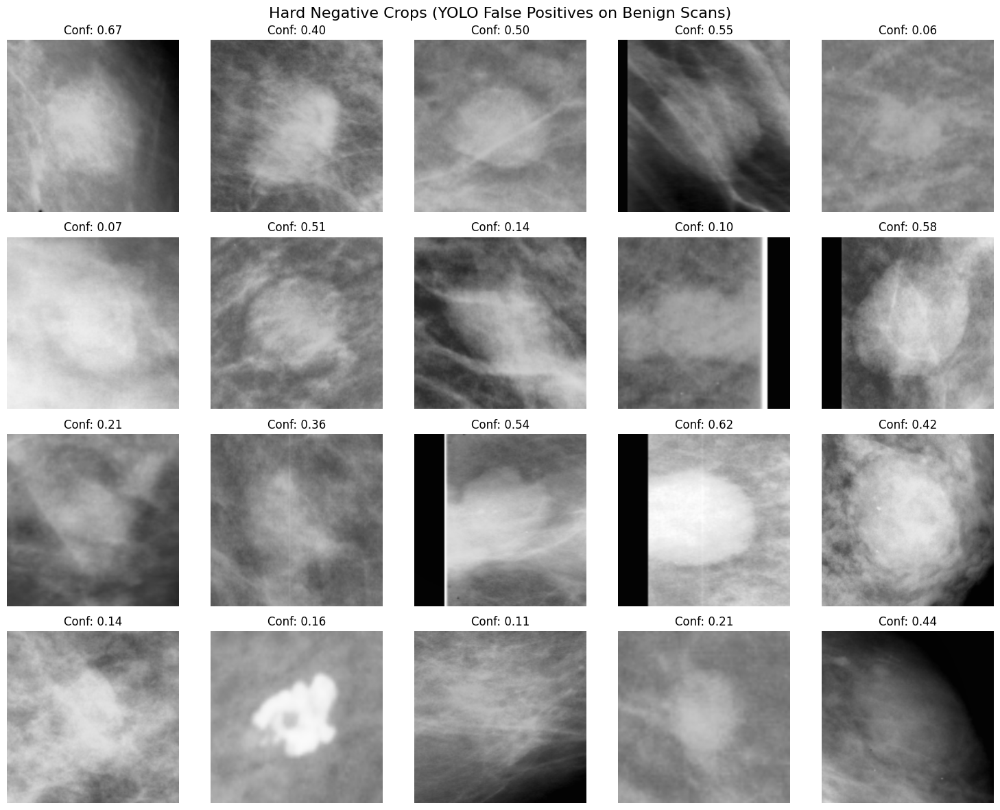

In [59]:
import random
import matplotlib.pyplot as plt

print("Mining hard negative crops (YOLO boxes on benign images)...")
# Use test set and lower confidence to guarantee finding false positives
benign_df = man[(man.split == "test") & (man.label == 0)]
hard_negs = []

for _, r in benign_df.sample(frac=1, random_state=42).iterrows():
    try:
        rgb = load_rgb8(r.full)
        res = det.predict(rgb[..., ::-1], conf=0.05, verbose=False)[0]
        if res.boxes is not None and len(res.boxes) > 0:
            H, W = rgb.shape[:2]
            sx, sy = W/res.orig_shape[1], H/res.orig_shape[0]

            # Take the most confident box
            b = res.boxes.xyxy.cpu().numpy()[0]
            x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
            crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
            hard_negs.append((crop, res.boxes.conf.cpu().numpy()[0]))

            if len(hard_negs) >= 20:
                break
    except Exception as e:
        continue

if not hard_negs:
    print("No hard negatives found even at conf=0.05!")
else:
    fig, axes = plt.subplots(4, 5, figsize=(15, 12))
    axes = axes.flatten()
    for i, (crop, conf) in enumerate(hard_negs):
        if i < len(axes):
            axes[i].imshow(crop)
            axes[i].set_title(f"Conf: {conf:.2f}")
            axes[i].axis("off")

    # Hide any unused subplots
    for j in range(len(hard_negs), len(axes)):
        axes[j].axis("off")

    plt.suptitle("Hard Negative Crops (YOLO False Positives on Benign Scans)", fontsize=16)
    plt.tight_layout()
    plt.show()

### Cell 3 — Artifact mask overlay

Checking background artifact masking logic...


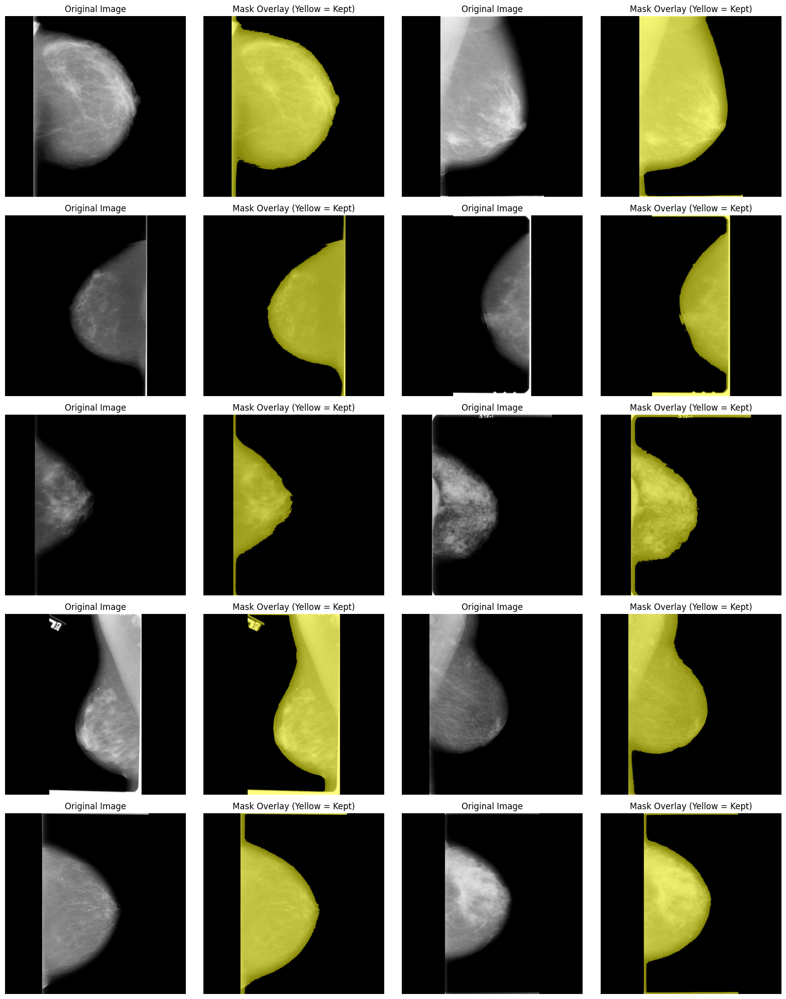

In [60]:
print("Checking background artifact masking logic...")
sample_images = man.sample(10, random_state=77)

fig, axes = plt.subplots(5, 4, figsize=(16, 20))
for i, (_, r) in enumerate(sample_images.iterrows()):
    row_idx = i // 2
    col_base = (i % 2) * 2

    path = str(Path(CFG.IMAGE_ROOT) / r.full)
    raw_img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if raw_img is None: continue
    if raw_img.ndim == 3: raw_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY)

    img_float = raw_img.astype(np.float32)
    profile_mask = img_float > (img_float.max() * 0.05)

    # Overlay mask over grayscale image (yellow tint for breast profile)
    vis_img = cv2.cvtColor(cv2.normalize(img_float, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_GRAY2RGB)
    overlay = vis_img.copy()
    overlay[profile_mask] = [255, 255, 0] # Highlight the preserved area in yellow

    blended = cv2.addWeighted(vis_img, 0.5, overlay, 0.5, 0)

    axes[row_idx, col_base].imshow(vis_img)
    axes[row_idx, col_base].set_title("Original Image")
    axes[row_idx, col_base].axis("off")

    axes[row_idx, col_base+1].imshow(blended)
    axes[row_idx, col_base+1].set_title("Mask Overlay (Yellow = Kept)")
    axes[row_idx, col_base+1].axis("off")

plt.tight_layout()
plt.show()

### Cell 4 — Crop resize quality comparison

Comparing Resize Methods...


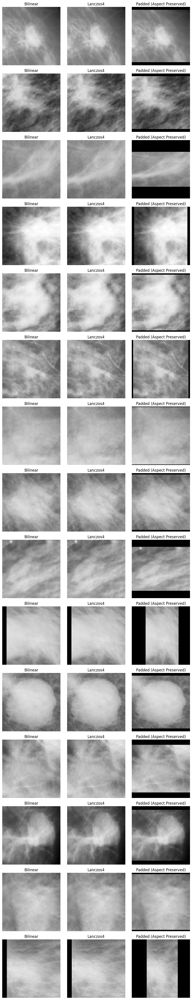

In [61]:
def padded_resize(img, size=224):
    h, w = img.shape[:2]
    scale = size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    resized = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_LINEAR)

    pad_h, pad_w = size - nh, size - nw
    top, bottom = pad_h // 2, pad_h - (pad_h // 2)
    left, right = pad_w // 2, pad_w - (pad_w // 2)

    return cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[0,0,0])

print("Comparing Resize Methods...")
crops = []
for _, r in man[man.split == "test"].sample(15, random_state=42).iterrows():
    try:
        rgb = load_rgb8(r.full)
        m = load_mask(r.roi)
        gt = mask_to_bbox(m)
        if gt is None: continue

        x0, y0, x1, y1 = expand_box(*gt, rgb.shape[1], rgb.shape[0], 0.1)
        orig_crop = rgb[y0:y1, x0:x1]
        if orig_crop.size == 0: continue

        bilinear = cv2.resize(orig_crop, (224, 224), interpolation=cv2.INTER_LINEAR)
        lanczos = cv2.resize(orig_crop, (224, 224), interpolation=cv2.INTER_LANCZOS4)
        padded = padded_resize(orig_crop, 224)

        crops.append((bilinear, lanczos, padded))
    except Exception:
        continue

fig, axes = plt.subplots(len(crops), 3, figsize=(9, 3 * len(crops)))
for i, (b, l, p) in enumerate(crops):
    axes[i, 0].imshow(b)
    axes[i, 0].set_title("Bilinear")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(l)
    axes[i, 1].set_title("Lanczos4")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(p)
    axes[i, 2].set_title("Padded (Aspect Preserved)")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

### Cell 5 — YOLO confidence vs lesion size

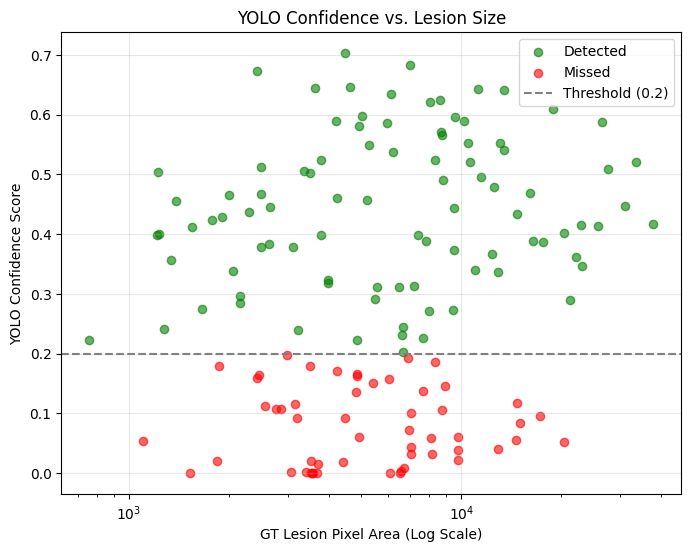

In [62]:
# Cell 5 — YOLO confidence vs lesion size
import matplotlib.pyplot as plt
import numpy as np
import cv2

areas = []
confs = []
statuses = []

for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    rgb = load_rgb8(r.full)
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    if not gt:
        continue

    area = (m > 0).sum()
    res = det.predict(rgb[..., ::-1], conf=0.001, verbose=False)[0]

    matched = False
    max_conf = 0.0

    if res.boxes is not None and len(res.boxes) > 0:
        H, W = rgb.shape[:2]
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        for b, c in zip(res.boxes.xyxy.cpu().numpy(), res.boxes.conf.cpu().numpy()):
            bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
            if iou_xyxy(bx, gt) >= 0.2:
                matched = True
                max_conf = max(max_conf, float(c))

    areas.append(area)
    confs.append(max_conf)
    statuses.append('Detected' if matched and max_conf >= CFG.YOLO_CONF else 'Missed')

plt.figure(figsize=(8, 6))
colors = {'Detected': 'green', 'Missed': 'red'}
for status in ['Detected', 'Missed']:
    idx = [i for i, s in enumerate(statuses) if s == status]
    plt.scatter([areas[i] for i in idx], [confs[i] for i in idx],
                c=colors[status], label=status, alpha=0.6)

plt.axhline(y=CFG.YOLO_CONF, color='gray', linestyle='--', label=f'Threshold ({CFG.YOLO_CONF})')
plt.xscale('log')
plt.xlabel('GT Lesion Pixel Area (Log Scale)')
plt.ylabel('YOLO Confidence Score')
plt.title('YOLO Confidence vs. Lesion Size')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Cell 6 — FN case gallery

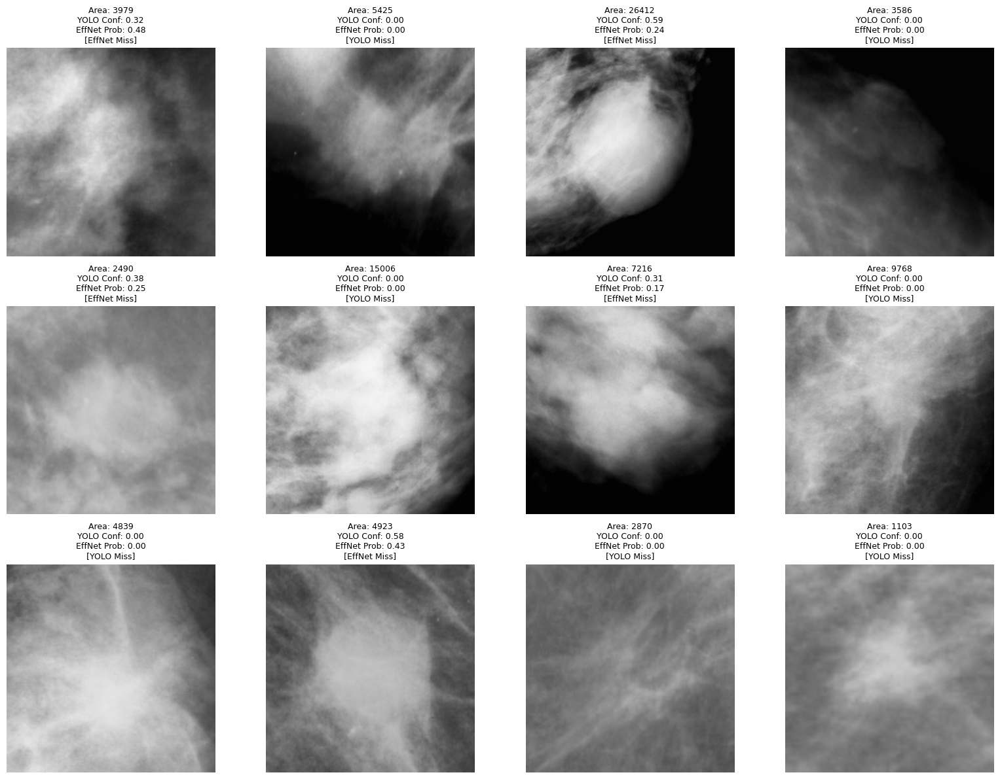

In [63]:
# Cell 6 — FN case gallery
import matplotlib.pyplot as plt
import torch
import cv2

# We'll use the pipeline's FNs (missed by YOLO or predicted < threshold by EffNet)
fn_cases = []

for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    rgb = load_rgb8(r.full)
    H, W = rgb.shape[:2]
    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]

    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    area = (m > 0).sum()
    if gt is None: continue

    fired = res.boxes is not None and len(res.boxes) > 0
    p_malig = 0.0
    best_conf = 0.0
    crop_to_show = None

    if fired:
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        b = res.boxes.xyxy.cpu().numpy()[0]
        best_conf = float(res.boxes.conf.cpu().numpy()[0])
        x0, y0, x1, y1 = expand_box(int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy), W, H, CFG.CROP_MARGIN)
        crop = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
        crop_to_show = crop

        x = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            _, cls = model_bias(x)
        p = torch.softmax(cls, 1)[0].cpu().numpy()
        p_malig = p[1] / (p[0] + p[1] + 1e-9)
    else:
        # No YOLO box, take GT crop for display purposes to show what was missed
        x0, y0, x1, y1 = expand_box(*gt, W, H, CFG.CROP_MARGIN)
        crop_to_show = cv2.resize(rgb[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))

    if not fired or p_malig < 0.5:
        fn_cases.append({'crop': crop_to_show, 'conf': best_conf, 'prob': p_malig, 'area': area, 'reason': 'YOLO Miss' if not fired else 'EffNet Miss'})
        if len(fn_cases) >= 12: break

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i, case in enumerate(fn_cases):
    ax = axes[i // 4, i % 4]
    ax.imshow(case['crop'])
    ax.axis('off')
    ax.set_title(f"Area: {case['area']}\nYOLO Conf: {case['conf']:.2f}\nEffNet Prob: {case['prob']:.2f}\n[{case['reason']}]", fontsize=9)
plt.tight_layout()
plt.show()

### Cell 7 — Crop IoU distribution

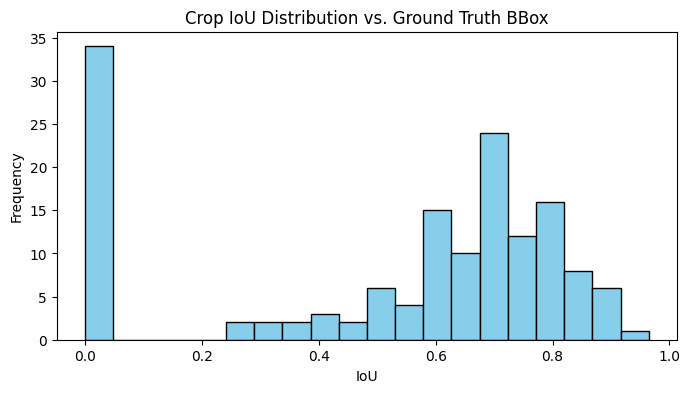

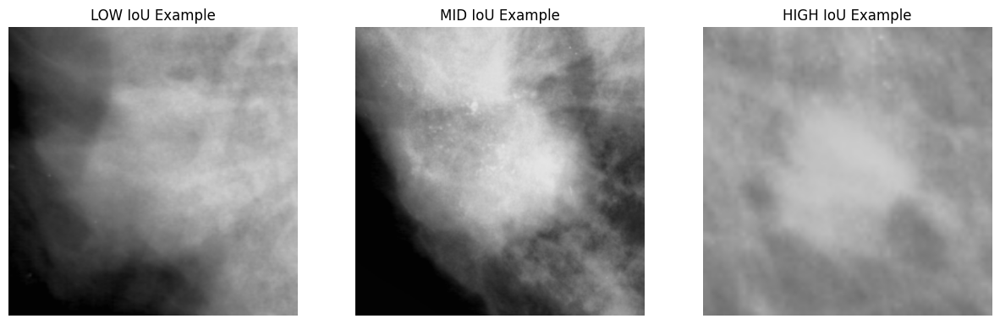

In [64]:
# Cell 7 — Crop IoU distribution
import numpy as np
import matplotlib.pyplot as plt

ious = []
crop_examples = {'low': None, 'mid': None, 'high': None}

for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    rgb = load_rgb8(r.full)
    m = load_mask(r.roi)
    gt = mask_to_bbox(m)
    if not gt: continue

    res = det.predict(rgb[..., ::-1], conf=0.01, verbose=False)[0]
    if res.boxes is not None and len(res.boxes) > 0:
        H, W = rgb.shape[:2]
        sx, sy = W / res.orig_shape[1], H / res.orig_shape[0]
        b = res.boxes.xyxy.cpu().numpy()[0]
        bx = (int(b[0]*sx), int(b[1]*sy), int(b[2]*sx), int(b[3]*sy))
        iou = iou_xyxy(bx, gt)
        ious.append(iou)

        crop_info = (rgb, bx, gt)
        if iou < 0.2 and not crop_examples['low']:
            crop_examples['low'] = crop_info
        elif 0.4 <= iou <= 0.6 and not crop_examples['mid']:
            crop_examples['mid'] = crop_info
        elif iou > 0.8 and not crop_examples['high']:
            crop_examples['high'] = crop_info

plt.figure(figsize=(8, 4))
plt.hist(ious, bins=20, color='skyblue', edgecolor='black')
plt.title('Crop IoU Distribution vs. Ground Truth BBox')
plt.xlabel('IoU')
plt.ylabel('Frequency')
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (k, v) in enumerate(crop_examples.items()):
    if v:
        img, bx, gt = v
        x0, y0, x1, y1 = expand_box(*bx, img.shape[1], img.shape[0], CFG.CROP_MARGIN)
        crop = cv2.resize(img[y0:y1, x0:x1], (CFG.CROP_SIZE, CFG.CROP_SIZE))
        axes[i].imshow(crop)
        axes[i].set_title(f"{k.upper()} IoU Example")
    axes[i].axis('off')
plt.show()

### Cell 8 — GradCAM on FN crops

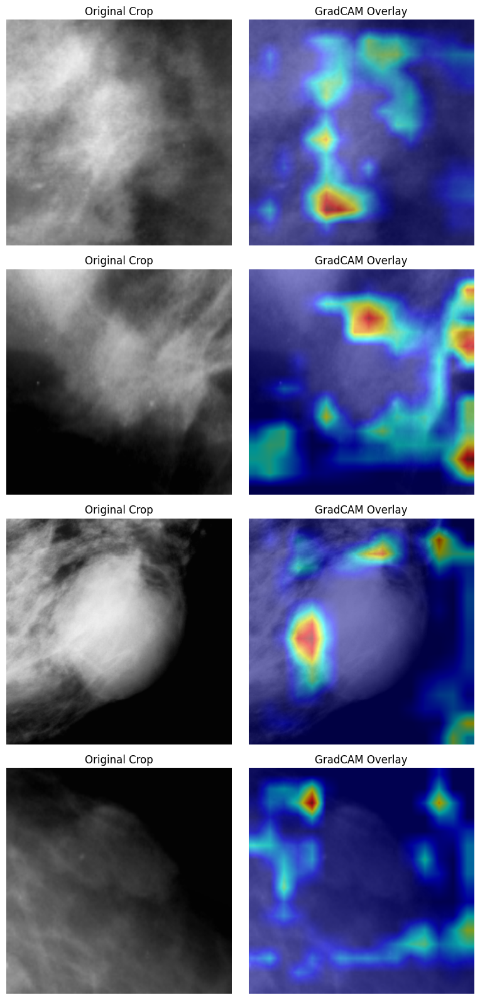

In [65]:
# Cell 8 — GradCAM on FN crops
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

class ClsWrapper(torch.nn.Module):
    def __init__(self, m): super().__init__(); self.m = m
    def forward(self, x): return self.m(x)[1]

wrapped_bias = ClsWrapper(model_bias).to(DEVICE).eval()
base_model = model_bias.model if hasattr(model_bias, 'temperature_scale') else model_bias
target_layers = [base_model.encoder._blocks[-1]] if hasattr(base_model.encoder, "_blocks") else [[mm for mm in base_model.encoder.modules() if isinstance(mm, torch.nn.Conv2d)][-1]]
cam = GradCAM(model=wrapped_bias, target_layers=target_layers)

# Take a few FN crops
fig, axes = plt.subplots(len(fn_cases[:4]), 2, figsize=(8, 4 * min(4, len(fn_cases))))
if len(fn_cases[:4]) == 1: axes = [axes]
for i, case in enumerate(fn_cases[:4]):
    crop = case['crop']
    x_t = ((torch.from_numpy(crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
    x_t.requires_grad_(True)
    g = cam(input_tensor=x_t, targets=[ClassifierOutputTarget(1)])[0]
    overlay = show_cam_on_image(crop.astype(np.float32)/255.0, g, use_rgb=True)

    axes[i][0].imshow(crop)
    axes[i][0].set_title("Original Crop")
    axes[i][0].axis('off')
    axes[i][1].imshow(overlay)
    axes[i][1].set_title("GradCAM Overlay")
    axes[i][1].axis('off')
plt.tight_layout()
plt.show()

### Cell 9 — Calibration reliability diagram

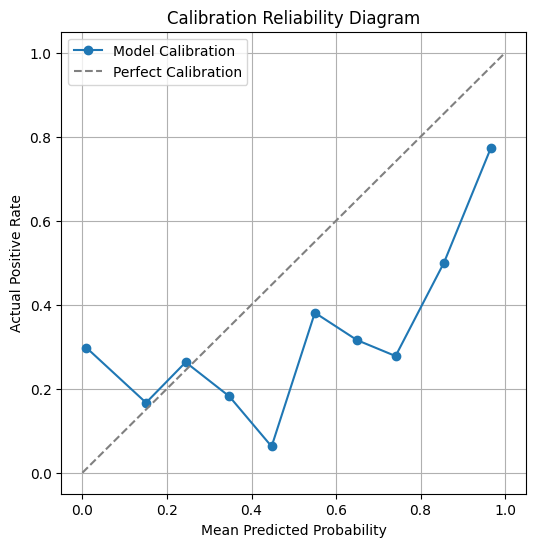

In [66]:
# Cell 9 — Calibration reliability diagram
import numpy as np
import matplotlib.pyplot as plt

if 'y_true' in globals() and 'y_score' in globals():
    bins = np.linspace(0, 1, 11)
    bin_indices = np.digitize(y_score, bins) - 1

    mean_preds = []
    actual_rates = []

    for i in range(10):
        mask = bin_indices == i
        if np.sum(mask) > 0:
            mean_preds.append(np.mean(np.array(y_score)[mask]))
            actual_rates.append(np.mean(np.array(y_true)[mask]))

    plt.figure(figsize=(6, 6))
    plt.plot(mean_preds, actual_rates, marker='o', label='Model Calibration')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Actual Positive Rate')
    plt.title('Calibration Reliability Diagram')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Run the Evaluation cell first to generate y_true and y_score.")

### Cell 10 — CC vs MLO symmetry gallery

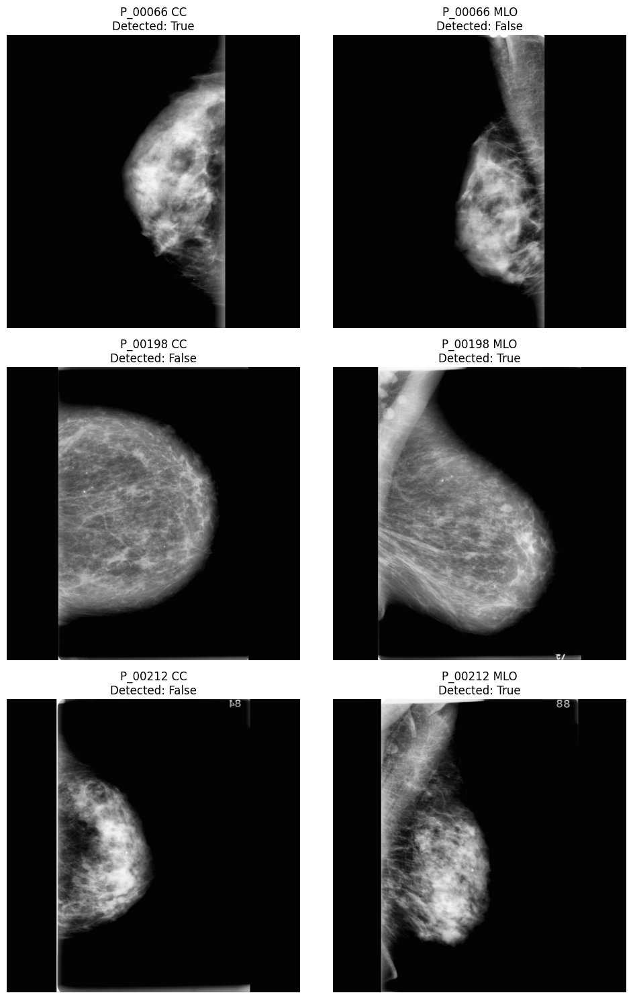

In [67]:
# Cell 10 — CC vs MLO symmetry gallery
import re
import matplotlib.pyplot as plt

# Find mismatched patient views (pseudo logic for demonstration)
patient_results = {}
for _, r in man[(man.split == 'test') & (man.label == 1)].iterrows():
    pid = re.search(r'P_\d{5}', r.full).group()
    rgb = load_rgb8(r.full)
    res = det.predict(rgb[..., ::-1], conf=CFG.YOLO_CONF, verbose=False)[0]
    fired = res.boxes is not None and len(res.boxes) > 0
    if pid not in patient_results:
        patient_results[pid] = {'CC': None, 'MLO': None}
    view = 'CC' if 'CC' in r['view'] else 'MLO'
    patient_results[pid][view] = {'fired': fired, 'img': rgb}

mismatches = {k: v for k, v in patient_results.items() if v['CC'] and v['MLO'] and v['CC']['fired'] != v['MLO']['fired']}

fig, axes = plt.subplots(min(3, len(mismatches)), 2, figsize=(10, 5 * min(3, len(mismatches))))
if len(mismatches) == 1: axes = [axes]
for i, (pid, views) in enumerate(list(mismatches.items())[:3]):
    for j, vname in enumerate(['CC', 'MLO']):
        ax = axes[i][j]
        if views[vname]:
            ax.imshow(views[vname]['img'])
            ax.set_title(f"{pid} {vname}\nDetected: {views[vname]['fired']}")
        ax.axis('off')
plt.tight_layout()
plt.show()

### Cell 11 — GradCAM plain vs enhanced crops

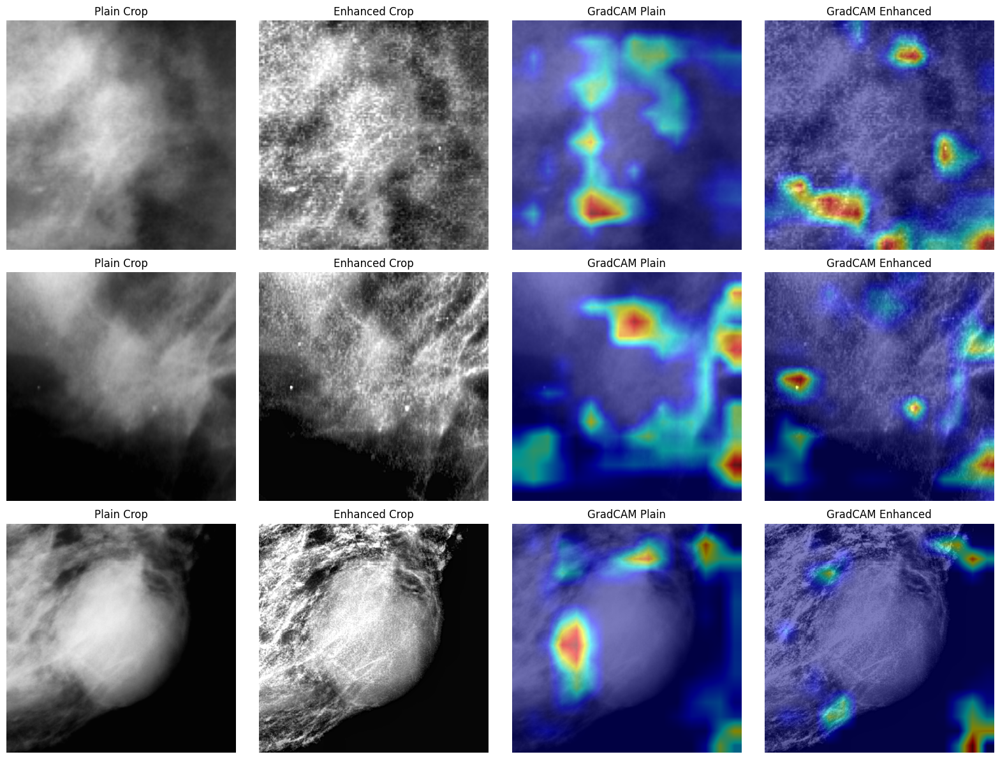

In [68]:
# Cell 11 — GradCAM plain vs enhanced crops
CLAHE_CLIP = 2.0
UNSHARP_AMOUNT = 1.5
TOPHAT_KERNEL = 15

def enhance_crop(crop):
    # Enhance: CLAHE -> Unsharp -> Top-Hat
    gray = cv2.cvtColor(crop, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=(8,8))
    gray = clahe.apply(gray)

    blur = cv2.GaussianBlur(gray, (0,0), 2.0)
    unsharp = cv2.addWeighted(gray, 1.0 + UNSHARP_AMOUNT, blur, -UNSHARP_AMOUNT, 0)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (TOPHAT_KERNEL, TOPHAT_KERNEL))
    tophat = cv2.morphologyEx(unsharp, cv2.MORPH_TOPHAT, kernel)

    enhanced = cv2.add(unsharp, tophat)
    return cv2.cvtColor(enhanced, cv2.COLOR_GRAY2RGB)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i, case in enumerate(fn_cases[:3]): # reuse FN crops for test
    plain_crop = case['crop']
    enhanced_crop = enhance_crop(plain_crop)

    # Plain GradCAM
    x_plain = ((torch.from_numpy(plain_crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
    x_plain.requires_grad_(True)
    g_plain = cam(input_tensor=x_plain, targets=[ClassifierOutputTarget(1)])[0]
    over_plain = show_cam_on_image(plain_crop.astype(np.float32)/255.0, g_plain, use_rgb=True)

    # Enhanced GradCAM
    x_enh = ((torch.from_numpy(enhanced_crop).float().permute(2,0,1)/255.0 - 0.5)/0.5).unsqueeze(0).to(DEVICE)
    x_enh.requires_grad_(True)
    g_enh = cam(input_tensor=x_enh, targets=[ClassifierOutputTarget(1)])[0]
    over_enh = show_cam_on_image(enhanced_crop.astype(np.float32)/255.0, g_enh, use_rgb=True)

    axes[i][0].imshow(plain_crop)
    axes[i][0].set_title("Plain Crop")
    axes[i][1].imshow(enhanced_crop)
    axes[i][1].set_title("Enhanced Crop")
    axes[i][2].imshow(over_plain)
    axes[i][2].set_title("GradCAM Plain")
    axes[i][3].imshow(over_enh)
    axes[i][3].set_title("GradCAM Enhanced")
    for j in range(4): axes[i][j].axis('off')

plt.tight_layout()
plt.show()